CONFIG

Install once:
%pip install -U sentence-transformers scikit-learn pandas numpy tqdm nltk
"""

In [1]:
import os, re, math, json, hashlib
from pathlib import Path
from collections import Counter, defaultdict
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.neighbors import NearestNeighbors
from sentence_transformers import SentenceTransformer
import datetime

# NLTK setup
import nltk
try:
    nltk.data.find("corpora/stopwords")
except LookupError:
    nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

# Suppress sentence-transformers logging
import logging
logging.getLogger("sentence_transformers").setLevel(logging.ERROR)

import os
import re
import json
import hashlib
from datetime import datetime
import pandas as pd
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords


In [5]:
# ============================================================
# CELL 2: BASE CONFIGURATION
# ============================================================
CONFIG = {
    "paths": {
        "corpus_dir": r"C:\Users\Home\policy-analysis\Slavery_text",
        "out_dir": r"C:\Users\Home\policy-analysis\dictionairy",
        "model_dir": r"C:\Users\Home\policy-analysis",
        "dictionary_excel": r"C:\Users\Home\policy-analysis\dutch_slavery_legacy_dictionary.xlsx",
    },
    "model_name": "NetherlandsForensicInstitute/robbert-2022-dutch-sentence-transformers",
    "topics": {
        # Default topics - will be overridden if Excel file is loaded
        "Historical slavery": ["slavernij", "tot-slaaf-gemaakte", "dwangarbeid","zweep"],
        "Colonialism": ["kolonie", "koloniaal", "voc", "wic", "neokoloniaal", "grondstoffen", 
                        "ketenuitbuiting", "belastingparadijs", "handelsbalans","exploitatie","economisch", "contractarbeid"],
        "Modern racism& inequality": ["racisme", "discriminatie", "microagressie", "etnisch profileren",
                                       "ongelijkheid", "segregatie"],
    },
    "vocab": {
        "min_df": 5,
        "max_len": 30,
        "max_vocab": 50000,
    },
    "expand": {
        "k_nearest": 50,
        "topN_per_topic": 300,
        "min_cosine": 0.55,
    },
    "scoring": {
        "use_sif": True,
        "sif_a": 1e-3,
    },
    "chunking": {
        "sentences_per_chunk": 10,
        "min_sentences_to_keep": 3,
        "drop_likely_english": True,
        "remove_stopwords": True,
        "use_stemming": False,
    },
    "tokenize": {
        "lower": True,
        "keep_hyphen": True,
        "min_len": 2,
        "max_len": 30,
        "pattern": r"[0-9A-Za-zÀ-ÖØ-öø-ÿ\-]+",
    },
    "output": {
        "iterative_folder": "Model_iterations",
        "config_subfolder": "configs",
        "data_subfolder": "processed_data",
        "model_subfolder": "bertje_finetuned",
        "version": None,
        "current_vocab_folder": None
    },
    # Model loading configuration
    "model_loading": {
        "use_pretrained": True,
        "iteration_to_load": "Slavery_005",
        "model_subfolder": "bertje_finetuned",
        "include_processed_data": True,
    },
    # Dictionary loading configuration
    "dictionary_loading": {
        "use_excel": True,
        "topic_column": "topic",
        "keyword_column": "keyword",
        "sheet_name": 0,
    }
}

print("✓ Base configuration loaded")

✓ Base configuration loaded


In [3]:
# ============================================================
# CELL 3: HELPER FUNCTIONS
# ============================================================

def load_topics_from_excel(config):
    """Load topics and keywords from Excel file."""
    excel_path = config['paths']['dictionary_excel']
    dict_config = config['dictionary_loading']
    
    if not Path(excel_path).exists():
        print(f"⚠ Excel file not found: {excel_path}")
        print("  Using default topics from config")
        return config['topics']
    
    try:
        df = pd.read_excel(excel_path, sheet_name=dict_config['sheet_name'])
        
        topic_col = dict_config['topic_column']
        keyword_col = dict_config['keyword_column']
        
        if topic_col not in df.columns or keyword_col not in df.columns:
            print(f"⚠ Required columns not found. Expected: '{topic_col}' and '{keyword_col}'")
            print(f"  Found columns: {list(df.columns)}")
            print("  Using default topics from config")
            return config['topics']
        
        topics_dict = {}
        for topic, group in df.groupby(topic_col):
            keywords = group[keyword_col].dropna().str.strip().tolist()
            if keywords:
                topics_dict[topic] = keywords
        
        print(f"✓ Loaded topics from Excel: {excel_path}")
        print(f"  Found {len(topics_dict)} topics with {len(df)} total keywords")
        return topics_dict
        
    except Exception as e:
        print(f"⚠ Error loading Excel file: {e}")
        print("  Using default topics from config")
        return config['topics']


def get_next_iteration_number(base_dir, prefix="Slavery_"):
    """Get the next available iteration number."""
    os.makedirs(base_dir, exist_ok=True)
    existing = [d for d in os.listdir(base_dir) if d.startswith(prefix)]
    
    if existing:
        versions = [int(d[len(prefix):]) for d in existing if d[len(prefix):].isdigit()]
        return f"{max(versions)+1:03d}" if versions else "001"
    return "001"


def create_iteration_folders(base_folder):
    """Create config and data subfolders within an iteration folder."""
    config_folder = os.path.join(base_folder, CONFIG["output"]["config_subfolder"])
    data_folder = os.path.join(base_folder, CONFIG["output"]["data_subfolder"])
    
    os.makedirs(config_folder, exist_ok=True)
    os.makedirs(data_folder, exist_ok=True)
    
    return config_folder, data_folder


def save_config_snapshot(iteration_name: str = None):
    """Save current CONFIG to timestamped JSON file."""
    if CONFIG["output"]["current_vocab_folder"] is None:
        raise ValueError("No iteration folder set. Run CELL 5 or CELL 6 first.")
    
    config_folder, _ = create_iteration_folders(CONFIG["output"]["current_vocab_folder"])
    
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"config_{iteration_name}_{timestamp}.json" if iteration_name else f"config_{timestamp}.json"
    config_path = os.path.join(config_folder, filename)
    
    config_with_meta = {
        "metadata": {
            "timestamp": timestamp,
            "iteration_name": iteration_name or "default",
            "saved_at": datetime.now().isoformat()
        },
        "config": CONFIG
    }
    
    with open(config_path, 'w', encoding='utf-8') as f:
        json.dump(config_with_meta, f, indent=2, ensure_ascii=False)
    
    print(f"✓ Config saved to: {config_path}")
    return config_path


def save_processed_data(df: pd.DataFrame, iteration_name: str = None):
    """Save processed DataFrame to iterative folder."""
    if CONFIG["output"]["current_vocab_folder"] is None:
        raise ValueError("No iteration folder set. Run CELL 5 or CELL 6 first.")
    
    _, data_folder = create_iteration_folders(CONFIG["output"]["current_vocab_folder"])
    
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"processed_{iteration_name}_{timestamp}.csv" if iteration_name else f"processed_{timestamp}.csv"
    data_path = os.path.join(data_folder, filename)
    
    df.to_csv(data_path, index=False, encoding='utf-8')
    print(f"✓ Data saved to: {data_path}")
    return data_path

print("✓ Helper functions defined")

✓ Helper functions defined


In [4]:
# ============================================================
# CELL 4: LOAD TOPICS FROM EXCEL
# ============================================================
# ⚠️ RUN THIS BEFORE CREATING OR LOADING ITERATIONS
# This ensures topics are in CONFIG before saving

if CONFIG['dictionary_loading']['use_excel']:
    loaded_topics = load_topics_from_excel(CONFIG)
    CONFIG['topics'] = loaded_topics  # Update CONFIG with loaded topics

print(f"\n{'='*60}")
print("TOPICS CONFIGURATION")
print(f"{'='*60}")
print(f"  Total topics: {len(CONFIG['topics'])}")
for topic, keywords in CONFIG['topics'].items():
    print(f"  - {topic}: {len(keywords)} keywords")
print(f"\n✓ Topics are now in CONFIG and will be saved to config snapshots")

✓ Loaded topics from Excel: C:\Users\Home\policy-analysis\dutch_slavery_legacy_dictionary.xlsx
  Found 3 topics with 55 total keywords

TOPICS CONFIGURATION
  Total topics: 3
  - Colonialism: 19 keywords
  - Historical Slavery: 18 keywords
  - Modern Racism & Inequality: 18 keywords

✓ Topics are now in CONFIG and will be saved to config snapshots


In [6]:
# ============================================================
# CELL 5: CREATE NEW ITERATION
# ============================================================
# Run this cell to START A NEW ITERATION with a new folder
# ⚠️ Make sure you ran CELL 4 first to load topics!

base_dir = CONFIG["output"]["iterative_folder"]
prefix = "Trained_Slavery_"
version = get_next_iteration_number(base_dir, prefix)

base_folder = os.path.join(base_dir, f"{prefix}{version}")
CONFIG["output"]["version"] = version
CONFIG["output"]["current_vocab_folder"] = base_folder

# Create folder structure
config_folder, data_folder = create_iteration_folders(base_folder)

print(f"\n{'='*60}")
print("NEW ITERATION CREATED")
print(f"{'='*60}")
print(f"  Iteration: {prefix}{version}")
print(f"  Folder: {base_folder}")
print(f"  Config folder: {config_folder}")
print(f"  Data folder: {data_folder}")
print(f"\n  Topics in CONFIG: {len(CONFIG['topics'])}")


NEW ITERATION CREATED
  Iteration: Trained_Slavery_001
  Folder: Model_iterations\Trained_Slavery_001
  Config folder: Model_iterations\Trained_Slavery_001\configs
  Data folder: Model_iterations\Trained_Slavery_001\processed_data

  Topics in CONFIG: 3


In [5]:
# CELL 6: LOAD PREVIOUS ITERATION
# ============================================================
# Run this cell to LOAD AN EXISTING ITERATION
# Set the folder name below:

LOAD_ITERATION = "Slavery_005"  # <<< CHANGE THIS

base_dir = CONFIG["output"]["iterative_folder"]
base_folder = os.path.join(base_dir, LOAD_ITERATION)

if not os.path.exists(base_folder):
    raise FileNotFoundError(f"Iteration folder not found: {base_folder}")

# Find and load the most recent config
config_dir = Path(base_folder) / CONFIG["output"]["config_subfolder"]

if not config_dir.exists():
    raise FileNotFoundError(f"Config directory not found: {config_dir}")

config_files = sorted(config_dir.glob("config_*.json"), 
                     key=lambda x: x.stat().st_mtime, 
                     reverse=True)

if not config_files:
    raise FileNotFoundError(f"No config files found in {config_dir}")

# Load the most recent config
latest_config = config_files[0]
print(f"Loading config from: {latest_config}")

with open(latest_config, 'r', encoding='utf-8') as f:
    loaded_data = json.load(f)

# Merge loaded config with current CONFIG (preserving paths)
saved_paths = CONFIG['paths'].copy()  # Preserve current paths
CONFIG.update(loaded_data["config"])
CONFIG['paths'] = saved_paths  # Restore paths

# Set the current folder
CONFIG["output"]["current_vocab_folder"] = base_folder
CONFIG["output"]["version"] = LOAD_ITERATION.split("_")[-1]

print(f"\n{'='*60}")
print("LOADED PREVIOUS ITERATION")
print(f"{'='*60}")
print(f"  Iteration: {LOAD_ITERATION}")
print(f"  Folder: {base_folder}")
print(f"  Config loaded from: {latest_config.name}")
print(f"\n  Topics loaded: {len(CONFIG['topics'])}")
for topic, keywords in CONFIG['topics'].items():
    print(f"    - {topic}: {len(keywords)} keywords")

Loading config from: Model_iterations\Slavery_005\configs\config_after_training_20251022_182234.json

LOADED PREVIOUS ITERATION
  Iteration: Slavery_005
  Folder: Model_iterations\Slavery_005
  Config loaded from: config_after_training_20251022_182234.json

  Topics loaded: 3
    - Colonialism: 19 keywords
    - Historical Slavery: 18 keywords
    - Modern Racism & Inequality: 18 keywords


In [7]:
# ============================================================
# CELL 7: LOAD SENTENCE TRANSFORMER MODEL
# ============================================================
from sentence_transformers import SentenceTransformer
import numpy as np

print(f"\n{'='*60}")
print("LOADING SENTENCE TRANSFORMER MODEL")
print(f"{'='*60}")

# Load the appropriate model as SentenceTransformer
if CONFIG['model_loading']['use_pretrained']:
    # Build the path
    path_components = [
        CONFIG['paths']['model_dir'],
        CONFIG['output']['iterative_folder'],
        CONFIG['model_loading']['iteration_to_load']
    ]
    
    if CONFIG['model_loading'].get('include_processed_data', False):
        path_components.append(CONFIG['output']['data_subfolder'])
    
    path_components.append(CONFIG['model_loading']['model_subfolder'])
    model_path = os.path.join(*path_components)
    model_path = os.path.normpath(model_path)
    
    print(f"📂 Loading pretrained model from:")
    print(f"   {model_path}")
    print(f"   Path exists: {os.path.exists(model_path)}")
    
    if os.path.exists(model_path):
        try:
            st_model = SentenceTransformer(model_path)
            print(f"✓ Pretrained SentenceTransformer loaded from {CONFIG['model_loading']['iteration_to_load']}")
        except Exception as e:
            print(f"❌ Error loading pretrained model: {e}")
            print("   Falling back to base model...")
            st_model = SentenceTransformer(CONFIG["model_name"])
    else:
        print(f"❌ Path does not exist!")
        print("   Falling back to base model...")
        st_model = SentenceTransformer(CONFIG["model_name"])
else:
    # Load base model
    print(f"📂 Loading base model: {CONFIG['model_name']}")
    st_model = SentenceTransformer(CONFIG["model_name"])
    print(f"✓ Base SentenceTransformer loaded")

# Define the embedding function using st_model
def st_embed(texts: list[str], batch_size: int = 256) -> np.ndarray:
    """Embed texts using the loaded SentenceTransformer model."""
    return st_model.encode(
        texts, 
        batch_size=batch_size, 
        show_progress_bar=False, 
        normalize_embeddings=True
    )

print(f"\n{'='*60}")
print("MODEL READY")
print(f"{'='*60}")
print(f"  Model loaded: {model_path if CONFIG['model_loading']['use_pretrained'] else CONFIG['model_name']}")
print(f"  Max sequence length: {st_model.max_seq_length}")
print(f"  Embedding dimension: {st_model.get_sentence_embedding_dimension()}")
print(f"\n✓ Embedding function 'st_embed()' ready to use")


LOADING SENTENCE TRANSFORMER MODEL
📂 Loading pretrained model from:
   C:\Users\Home\policy-analysis\Model_iterations\Slavery_005\processed_data\bertje_finetuned
   Path exists: True
✓ Pretrained SentenceTransformer loaded from Slavery_005

MODEL READY
  Model loaded: C:\Users\Home\policy-analysis\Model_iterations\Slavery_005\processed_data\bertje_finetuned
  Max sequence length: 512
  Embedding dimension: 768

✓ Embedding function 'st_embed()' ready to use


In [8]:
# ============================================================
# CELL 8: SAVE INITIAL CONFIG SNAPSHOT
# ============================================================
# Save the current configuration to the iteration folder
# Only run this after setting up your iteration (CELL 5 or CELL 6)

if CONFIG["output"]["current_vocab_folder"] is None:
    print("❌ No iteration folder set!")
    print("   Run CELL 5 (new iteration) or CELL 6 (load iteration) first")
else:
    config_path = save_config_snapshot("initial_setup")
    
    print(f"\n{'='*60}")
    print("SETUP COMPLETE")
    print(f"{'='*60}")
    print(f"Iteration folder: {CONFIG['output']['current_vocab_folder']}")
    print(f"Config saved: {config_path}")
    print(f"\nConfig contains {len(CONFIG['topics'])} topics:")
    for topic in CONFIG['topics'].keys():
        print(f"  - {topic}")
    print(f"\nReady to proceed with:")
    print("  1. Text preprocessing")
    print("  2. Vocabulary building")
    print("  3. Model scoring")
    print("  4. Visualization & analysis")

✓ Config saved to: Model_iterations\Trained_Slavery_001\configs\config_initial_setup_20251024_112952.json

SETUP COMPLETE
Iteration folder: Model_iterations\Trained_Slavery_001
Config saved: Model_iterations\Trained_Slavery_001\configs\config_initial_setup_20251024_112952.json

Config contains 3 topics:
  - Historical slavery
  - Colonialism
  - Modern racism& inequality

Ready to proceed with:
  1. Text preprocessing
  2. Vocabulary building
  3. Model scoring
  4. Visualization & analysis


# =========================
# 2) TEXT CLEANING UTILITIES
# =========================

In [9]:
#============================================================
# CELL 2: TEXT CLEANING UTILITIES
# ============================================================
stemmer = SnowballStemmer("dutch")

# Build comprehensive stopword set
nltk_stopwords = set(stopwords.words('dutch')) | set(stopwords.words('english'))
custom_stopwords = set([
    "de","het","een","en","van","in","op","met","voor","tegen","zonder","bij","naar","tot","uit","door","aan","om","te","als","ook","maar","want","dus",
    "of","dan","nog","wel","zijn","is","was","waren","worden","hebben","heeft","had","doet","doen","al","alle","meer","minder","veel","weinig",
    "binnen","buiten","tussen","onder","boven","over","na","achter","naast","sinds","tijdens","zoals",
    "ik","jij","hij","zij","wij","jullie","u","je","ze","dit","dat","die","deze","welke","ons","hun","hem","haar","onszelf","hunzelf","jouw","mijn",
    "bijlage","bijlagen","inleiding","samenvatting","conclusie","conclusies","tabel","groep","project","organisatie","onderdeel","onderzoek","overzicht",
    "resultaten","resultaat","aantal","totaal","deel","delen","vraag","vragen","antwoord","antwoorden","rapport","rapportage","toelichting",
    "jaar","jaren","gegeven","gegevens","gebruik","gebruikt","beleid",
])
ALL_STOPWORDS = nltk_stopwords | custom_stopwords

# English vs Dutch detection sets
ENGLISH_HINTS = set("""the and of to in that is for on with as by from at it this be are were was has have will would can could should""".split())
DUTCH_HINTS = set("""de het een en van voor met op aan te is zijn worden was waren niet bij in over uit door naar tot als ook om""".split())

def likely_english_sentence(s: str) -> bool:
    """Heuristic to detect likely English sentences"""
    if not CONFIG["chunking"]["drop_likely_english"]:
        return False
    tokens = re.findall(r"[A-Za-zÀ-ÖØ-öø-ÿ]+", s.lower())
    if not tokens:
        return False
    e = sum(t in ENGLISH_HINTS for t in tokens)
    d = sum(t in DUTCH_HINTS for t in tokens)
    return e > max(2, d + 1)

def remove_stopwords_and_numbers(text: str) -> str:
    """Remove stopwords and digits"""
    if pd.isna(text):
        return ""
    tokens = re.findall(r"\b\w+\b", text.lower())
    filtered = [tok for tok in tokens if tok not in ALL_STOPWORDS and not tok.isdigit()]
    return " ".join(filtered)

def stem_text(text: str) -> str:
    """Apply Dutch stemming"""
    tokens = re.findall(r"\b\w+\b", text.lower())
    return " ".join(stemmer.stem(w) for w in tokens)

def normalize_space(text: str) -> str:
    """Normalize whitespace"""
    return re.sub(r"\s+", " ", text).strip()

def short_file_hash(path: str, n=8) -> str:
    """Create short hash for file identification"""
    return hashlib.sha1(path.encode("utf-8", errors="ignore")).hexdigest()[:n]

def make_chunk_uid(file_path: str, chunk_idx: int) -> str:
    """Generate unique chunk identifier"""
    return f"{short_file_hash(file_path)}:{chunk_idx:05d}"



In [10]:
# ============================================================
# CELL 3: SENTENCE-BASED CHUNKING
# ============================================================
def split_into_sentences(text: str) -> list:
    """Split text into sentences"""
    sentences = re.split(r'(?<=[.!?])\s+', text)
    return [s.strip() for s in sentences if s.strip()]

def chunk_by_sentences(text: str, file_path: str) -> list:
    """
    Chunk text by sentences with cleaning pipeline.
    Returns list of tuples: (chunk_uid, raw_text, text_for_scoring, sentence_count)
    """
    sentences = split_into_sentences(text)
    
    sentences_per_chunk = CONFIG["chunking"]["sentences_per_chunk"]
    min_sentences = CONFIG["chunking"]["min_sentences_to_keep"]
    
    chunks = []
    chunk_idx = 0
    
    for i in range(0, len(sentences), sentences_per_chunk):
        sent_slice = sentences[i:i + sentences_per_chunk]
        
        if len(sent_slice) < min_sentences:
            continue
        
        # Raw text (unfiltered)
        raw_text = " ".join(sent_slice)
        
        # Apply English filtering if enabled
        if CONFIG["chunking"]["drop_likely_english"]:
            filtered_sents = [s for s in sent_slice if not likely_english_sentence(s)]
            if len(filtered_sents) < min_sentences:
                # Too few sentences after filtering - mark but keep
                text_for_scoring = ""
            else:
                filtered_text = " ".join(filtered_sents)
                text_for_scoring = normalize_space(filtered_text)
        else:
            text_for_scoring = normalize_space(raw_text)
        
        # Apply stopword removal if enabled
        if CONFIG["chunking"]["remove_stopwords"] and text_for_scoring:
            text_for_scoring = remove_stopwords_and_numbers(text_for_scoring)
        
        # Apply stemming if enabled
        if CONFIG["chunking"]["use_stemming"] and text_for_scoring:
            text_for_scoring = stem_text(text_for_scoring)
        
        text_for_scoring = normalize_space(text_for_scoring)
        
        chunks.append((
            make_chunk_uid(file_path, chunk_idx),
            raw_text,
            text_for_scoring,
            len(sent_slice)
        ))
        chunk_idx += 1
    
    return chunks

In [11]:
# ============================================================
# PROCESS CORPUS AND SAVE CHUNKS
# ============================================================
all_chunks = []

# Load and process documents
for doc_path in Path(CONFIG["paths"]["corpus_dir"]).glob("*.txt"):
    with open(doc_path, 'r', encoding='utf-8') as f:
        text = f.read()
    
    doc_chunks = chunk_by_sentences(text, str(doc_path))
    for chunk_uid, raw_text, text_for_scoring, sentence_count in doc_chunks:
        all_chunks.append({
            'file_path': str(doc_path),
            'chunk_uid': chunk_uid,
            'raw_text': raw_text,
            'text_for_scoring': text_for_scoring,
            'sentence_count': sentence_count
        })

# Convert to DataFrame and save
chunks_df = pd.DataFrame(all_chunks)
save_processed_data(chunks_df, "chunked_corpus")

print(f"✓ Processed {len(chunks_df)} chunks from {chunks_df['file_path'].nunique()} documents")

✓ Data saved to: Model_iterations\Trained_Slavery_001\processed_data\processed_chunked_corpus_20251024_113036.csv
✓ Processed 2900 chunks from 1378 documents


# =========================
#  BUILD VOCABULARY
# =========================

In [12]:
# ============================================================
# IO + TOKENIZER (for vocab building)
# ============================================================
def ensure_dir(p: str | Path) -> Path:
    p = Path(p)
    p.mkdir(parents=True, exist_ok=True)
    return p

def iter_text_files():
    base = Path(CONFIG["paths"]["corpus_dir"])
    for fp in base.glob("**/*.txt"):
        yield fp

def read_text(path: Path) -> str:
    for enc in ("utf-8", "utf-8-sig", "latin-1"):
        try:
            return path.read_text(encoding=enc, errors="ignore")
        except Exception:
            pass
    return path.read_text(errors="ignore")

_tok_re = re.compile(CONFIG["tokenize"]["pattern"])

def tokenize(text: str) -> list[str]:
    """Simple tokenization for vocab building"""
    if CONFIG["tokenize"]["lower"]:
        text = text.lower()
    toks = _tok_re.findall(text)
    keep = []
    mn = CONFIG["tokenize"]["min_len"]
    mx = CONFIG["tokenize"]["max_len"]
    for t in toks:
        if not CONFIG["tokenize"]["keep_hyphen"]:
            t = t.replace("-", "")
        if mn <= len(t) <= mx:
            keep.append(t)
    return keep

print("✓ IO and tokenizer functions ready")

from collections import Counter

doc_tokens = []
term_freq = Counter()
doc_freq = Counter()




✓ IO and tokenizer functions ready


In [13]:
# ============================================================
# BUILD VOCABULARY FROM CORPUS
# ============================================================
print("\n" + "="*60)
print("BUILDING VOCABULARY")
print("="*60)

from collections import Counter

for fp in tqdm(list(iter_text_files()), desc="Processing documents"):
    text = read_text(fp)
    toks = tokenize(text)
    doc_tokens.append((fp, toks))
    
    # Update frequencies
    term_freq.update(toks)
    doc_freq.update(set(toks))

print(f"\n✓ Processed {len(doc_tokens)} documents")
print(f"  Total tokens: {sum(term_freq.values()):,}")
print(f"  Unique terms: {len(term_freq):,}")

# Filter vocabulary
min_df = CONFIG["vocab"]["min_df"]
max_vocab = CONFIG["vocab"]["max_vocab"]

vocab_candidates = [
    (term, freq) for term, freq in term_freq.items()
    if doc_freq[term] >= min_df
]

vocab_candidates.sort(key=lambda x: x[1], reverse=True)
vocab_candidates = vocab_candidates[:max_vocab]

terms = [term for term, _ in vocab_candidates]
print(f"\n✓ Filtered vocabulary: {len(terms)} terms")
print(f"  Min document frequency: {min_df}")
print(f"  Max vocabulary size: {max_vocab}")



BUILDING VOCABULARY


Processing documents: 100%|██████████| 1582/1582 [00:00<00:00, 3893.06it/s]


✓ Processed 1582 documents
  Total tokens: 485,433
  Unique terms: 38,449

✓ Filtered vocabulary: 8160 terms
  Min document frequency: 5
  Max vocabulary size: 50000


In [ ]:
# ============================================================
# SAVE VOCABULARY TO PROCESSED_DATA
# ============================================================

# Save vocabulary
vocab_df = pd.DataFrame({
    'term': terms,
    'term_freq': [term_freq[t] for t in terms],
    'doc_freq': [doc_freq[t] for t in terms]
})

vocab_path = os.path.join(data_folder, "vocabulary.csv")
vocab_df.to_csv(vocab_path, index=False, encoding='utf-8-sig')
print(f"\n✓ Saved vocabulary → {vocab_path}")

# Save term and document frequencies for later use
freq_data = {
    'term_freq': dict(term_freq),
    'doc_freq': dict(doc_freq),
    'n_documents': len(doc_tokens)
}

freq_path = os.path.join( data_folder, "term_frequencies.json")
with open(freq_path, 'w', encoding='utf-8') as f:
    json.dump(freq_data, f, ensure_ascii=False, indent=2)
print(f"✓ Saved frequencies → {freq_path}")


✓ Saved vocabulary → Model_iterations\Trained_Slavery_001\processed_data\vocabulary.csv
✓ Saved frequencies → Model_iterations\Trained_Slavery_001\processed_data\term_frequencies.json


In [16]:
# ============================================================
# CELL 2: ENCODE VOCABULARY & BUILD NN INDEX
# ============================================================

# Remove the duplicate st_embed definition - it's already defined in the previous cell
# def st_embed(texts: list[str], batch_size: int = 256) -> np.ndarray:
#     return model.encode(texts, batch_size=batch_size, show_progress_bar=False, normalize_embeddings=True)

print("\nSTEP 4: Encoding vocabulary...")
vocab_emb = st_embed(terms)
print(f"✓ Encoded {len(terms)} terms → shape {vocab_emb.shape}")

term2idx = {t: i for i, t in enumerate(terms)}

print("\nSTEP 5: Building nearest neighbor index...")
nn = NearestNeighbors(n_neighbors=min(100, len(terms)), metric="cosine", algorithm="auto")
nn.fit(vocab_emb)
print("✓ NN index ready")

def nearest_terms(query: str, k: int = 50) -> list[tuple[str, float]]:
    qv = st_embed([query])[0].reshape(1, -1)
    distances, indices = nn.kneighbors(qv, n_neighbors=min(k, len(terms)))
    sims = 1.0 - distances[0]
    idxs = indices[0]
    return [(terms[i], float(sims[j])) for j, i in enumerate(idxs)]

print("✓ Nearest terms function ready")


STEP 4: Encoding vocabulary...
✓ Encoded 8160 terms → shape (8160, 768)

STEP 5: Building nearest neighbor index...
✓ NN index ready
✓ Nearest terms function ready


In [17]:
# ============================================================
# CELL 3: EXPAND SEED TERMS
# ============================================================
print("\n" + "=" * 60)
print("STEP 6: Expanding seed terms...")
print("=" * 60)

topic_rows = []
k = CONFIG["expand"]["k_nearest"]
min_cos = CONFIG["expand"]["min_cosine"]

for topic, seeds in CONFIG["topics"].items():
    print(f"  Processing: {topic}")
    seen = {}
    for s in seeds:
        for w, sim in nearest_terms(s, k=k):
            if doc_freq.get(w, 0) < CONFIG["vocab"]["min_df"]:
                continue
            if sim < min_cos:
                continue
            if w not in seen or sim > seen[w]:
                seen[w] = sim
    
    for s in seeds:
        if s in term2idx:
            seen[s] = max(seen.get(s, 0.0), 1.0)
    
    rows = sorted(seen.items(), key=lambda x: x[1], reverse=True)[:CONFIG["expand"]["topN_per_topic"]]
    for w, sc in rows:
        topic_rows.append({
            "topic": topic,
            "term": w,
            "cosine": round(sc, 4),
            "df": int(doc_freq.get(w, 0))
        })
    print(f"    → Found {len(rows)} candidate terms")

cands_df = pd.DataFrame(topic_rows)
print(f"\n✓ Generated {len(cands_df)} candidate terms across {cands_df['topic'].nunique()} topics")


cands_path = os.path.join( data_folder, "xfmr_neighbors_for_manual_vetting.csv")

cands_df.to_csv(cands_path, index=False, encoding="utf-8-sig")
print(f"\n✓ Saved candidates → {cands_path}")
print(f"\n  Review and curate this file, then save as:")
print(f"  {os.path.join(data_folder, 'xfmr_neighbors_CURATED.csv')}")


STEP 6: Expanding seed terms...
  Processing: Historical slavery
    → Found 141 candidate terms
  Processing: Colonialism
    → Found 300 candidate terms
  Processing: Modern racism& inequality
    → Found 210 candidate terms

✓ Generated 651 candidate terms across 3 topics

✓ Saved candidates → Model_iterations\Trained_Slavery_001\processed_data\xfmr_neighbors_for_manual_vetting.csv

  Review and curate this file, then save as:
  Model_iterations\Trained_Slavery_001\processed_data\xfmr_neighbors_CURATED.csv


In [23]:
# ============================================================
# CELL 5: CHECK FOR CURATED FILE & BUILD TOPIC VECTORS
# ============================================================
print("\n" + "=" * 60)
print("STEP 7: Checking for curated dictionary...")
print("=" * 60)

CURATED_PATH = os.path.join( data_folder, "xfmr_neighbors_VETTED_BALANCED.csv")

# Fix: Convert to absolute path
CURATED_PATH = os.path.abspath(CURATED_PATH)

if not os.path.exists(CURATED_PATH):
    print(f"[INFO] File not found: {CURATED_PATH}")
    print("       Create this file after manual pruning to continue.")
    print("\n✓ Stopped before scoring (waiting for curated file)")
else:
    print(f"✓ Found curated file: {CURATED_PATH}")
    pruned = pd.read_csv(CURATED_PATH)
    print(f"  Contains {len(pruned)} terms across {pruned['topic'].nunique()} topics")

    # Calculate term weights (SIF weighting)
    total_tf = max(1, sum(term_freq.values()))
    a = CONFIG["scoring"]["sif_a"]
    
    def term_weight(t: str) -> float:
        if not CONFIG["scoring"]["use_sif"]:
            return 1.0
        tf = term_freq.get(t, 1)
        return 1.0 / (a + tf / total_tf)

    print("\nSTEP 8: Building topic vectors...")
    topic2vec = {}
    topic2terms = defaultdict(list)
    
    for topic, sub in pruned.groupby("topic", sort=False):
        vecs, ws = [], []
        for t in sub["term"]:
            if t not in term2idx:
                continue
            v = vocab_emb[term2idx[t]]
            w = term_weight(t)
            vecs.append(v)
            ws.append(w)
            topic2terms[topic].append(t)
        
        if not vecs:
            continue
        
        V = np.vstack(vecs)
        W = np.array(ws).reshape(-1, 1)
        tv = (V * W).sum(axis=0) / (W.sum() + 1e-12)
        tv = tv / (np.linalg.norm(tv) + 1e-12)
        topic2vec[topic] = tv
        print(f"  {topic}: {len(topic2terms[topic])} terms")

    print(f"\n✓ Created {len(topic2vec)} topic vectors")



STEP 7: Checking for curated dictionary...
✓ Found curated file: c:\Users\Home\policy-analysis\Model_iterations\Trained_Slavery_001\processed_data\xfmr_neighbors_VETTED_BALANCED.csv
  Contains 113 terms across 3 topics

STEP 8: Building topic vectors...
  Colonialism: 38 terms
  Historical Slavery: 37 terms
  Modern Racism & Inequality: 37 terms

✓ Created 3 topic vectors


In [24]:
# ============================================================
# CELL 6: SAVE TOPIC VECTORS (ITERATIVE)
# ============================================================


# Save topic vectors (add Model_iterations prefix)
topic_vec_path = os.path.join( data_folder, "xfmr_topic_vectors.npy")
np.save(topic_vec_path, topic2vec, allow_pickle=True)

# Save metadata (add Model_iterations prefix)
meta_path = os.path.join( data_folder, "xfmr_topic_vectors_meta.json")
with open(meta_path, "w", encoding="utf-8") as f:
    json.dump({
        "topics": list(topic2vec.keys()),
        "terms": dict(topic2terms)
    }, f, ensure_ascii=False, indent=2)

print(f"✓ Saved topic vectors → {topic_vec_path}")
print(f"✓ Saved metadata → {meta_path}")

✓ Saved topic vectors → Model_iterations\Trained_Slavery_001\processed_data\xfmr_topic_vectors.npy
✓ Saved metadata → Model_iterations\Trained_Slavery_001\processed_data\xfmr_topic_vectors_meta.json


In [28]:
# ============================================================
# CELL 7: SCORE CHUNKS (THREE-TIER CONFIDENCE CLASSIFICATION)
# ============================================================
print("\n" + "=" * 60)
print("STEP 9: Scoring chunks and classifying by confidence...")
print("=" * 60)

def cosine(a: np.ndarray, b: np.ndarray) -> float:
    return float(np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b) + 1e-12))

# Ensure data folder exists
if 'data_folder' not in locals():
    _, data_folder = create_iteration_folders(CONFIG["output"]["current_vocab_folder"])

# Score ALL chunks first
records = []
for chunk_data in tqdm(all_chunks, desc="Scoring all chunks", ncols=80):
    # Score based on text_for_scoring (cleaned text)
    text = chunk_data['text_for_scoring']
    
    # file_path is stored as a string in all_chunks; use it directly
    filename = chunk_data.get('file_path', '')
    
    if text:
        dv = st_embed([text])[0]
        row = {
            "filename": filename,
            "chunk_id": chunk_data['chunk_uid'],
            "sentence_count": chunk_data['sentence_count'],
            "raw_text": chunk_data['raw_text'],
            "text_for_scoring": text,
        }
        for topic, tv in topic2vec.items():
            row[f"cos_{topic}"] = cosine(dv, tv)
    else:
        # Empty after filtering
        row = {
            "filename": filename,
            "chunk_id": chunk_data['chunk_uid'],
            "sentence_count": chunk_data['sentence_count'],
            "raw_text": chunk_data['raw_text'],
            "text_for_scoring": "",
        }
        for topic in topic2vec.keys():
            row[f"cos_{topic}"] = 0.0
    
    records.append(row)

all_scores_df = pd.DataFrame(records)
print(f"✓ Scored {len(all_scores_df)} chunks across {len(topic2vec)} topics")

# ============================================================
# SAVE RAW SCORES IMMEDIATELY
# ============================================================
raw_scores_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_raw.csv")
all_scores_df.to_csv(raw_scores_path, index=False, encoding='utf-8')
print(f"✓ Saved raw scores to: {raw_scores_path}")

# ============================================================
# THREE-TIER CONFIDENCE CLASSIFICATION
# ============================================================
print(f"\n{'='*60}")
print("Classifying chunks by confidence level...")
print(f"{'='*60}")

# Get topic columns
topic_cols = [col for col in all_scores_df.columns if col.startswith('cos_')]

# Calculate confidence metrics
all_scores_df['max_score'] = all_scores_df[topic_cols].max(axis=1)
all_scores_df['primary_topic'] = all_scores_df[topic_cols].idxmax(axis=1).str.replace('cos_', '')

# Calculate score margin (difference between top and second-best scores)
topic_scores = all_scores_df[topic_cols].values
sorted_scores = np.sort(topic_scores, axis=1)[:, ::-1]
all_scores_df['score_margin'] = sorted_scores[:, 0] - sorted_scores[:, 1]

# ============================================================
# CONFIDENCE THRESHOLDS
# ============================================================
# HIGH CONFIDENCE: Strong signal for labeling
HIGH_CONFIDENCE_SCORE = 0.50      # Minimum score threshold
HIGH_CONFIDENCE_MARGIN = 0.05     # Minimum margin between top 2 topics

# LOW CONFIDENCE: Ambiguous but potentially relevant
LOW_CONFIDENCE_SCORE = 0.40       # Lower bound - still shows some relevance
LOW_CONFIDENCE_MARGIN = 0.02      # Smaller margin - less clear distinction

# NO CONFIDENCE: Very unlikely to belong to any topic
# (anything below LOW_CONFIDENCE thresholds)

# ============================================================
# CLASSIFY INTO THREE TIERS
# ============================================================

# HIGH CONFIDENCE: Clear topic assignment
high_confidence_mask = (
    (all_scores_df['max_score'] >= HIGH_CONFIDENCE_SCORE) & 
    (all_scores_df['score_margin'] >= HIGH_CONFIDENCE_MARGIN)
)

# LOW CONFIDENCE: Potentially relevant but ambiguous
low_confidence_mask = (
    (all_scores_df['max_score'] >= LOW_CONFIDENCE_SCORE) & 
    (all_scores_df['score_margin'] >= LOW_CONFIDENCE_MARGIN) &
    ~high_confidence_mask  # Not already in high confidence
)

# NO CONFIDENCE: Below both thresholds
no_confidence_mask = ~(high_confidence_mask | low_confidence_mask)

# Create the three datasets
high_confidence_df = all_scores_df[high_confidence_mask].copy()
low_confidence_df = all_scores_df[low_confidence_mask].copy()
no_confidence_df = all_scores_df[no_confidence_mask].copy()

# Add confidence label to each
high_confidence_df['confidence_level'] = 'high'
low_confidence_df['confidence_level'] = 'low'
no_confidence_df['confidence_level'] = 'none'

# ============================================================
# SAVE TO FILES IMMEDIATELY
# ============================================================
print(f"\n{'='*60}")
print("SAVING CLASSIFIED RESULTS")
print(f"{'='*60}")

# Save high confidence (primary labeled data)
high_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_high_confidence.csv")
high_confidence_df.to_csv(high_conf_path, index=False, encoding='utf-8')
print(f"✓ Saved high confidence scores to: {high_conf_path}")

# Save low confidence (potential future labels)
low_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_low_confidence.csv")
low_confidence_df.to_csv(low_conf_path, index=False, encoding='utf-8')
print(f"✓ Saved low confidence scores to: {low_conf_path}")

# Save no confidence (for completeness/analysis)
no_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_no_confidence.csv")
no_confidence_df.to_csv(no_conf_path, index=False, encoding='utf-8')
print(f"✓ Saved no confidence scores to: {no_conf_path}")

# Save combined dataset with confidence labels
all_with_labels_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_all_labeled.csv")
all_with_confidence = pd.concat([high_confidence_df, low_confidence_df, no_confidence_df], ignore_index=True)
all_with_confidence.to_csv(all_with_labels_path, index=False, encoding='utf-8')
print(f"✓ Saved complete dataset with confidence labels to: {all_with_labels_path}")

# ============================================================
# REPORTING
# ============================================================
print(f"\n{'='*60}")
print("CONFIDENCE CLASSIFICATION RESULTS")
print(f"{'='*60}")

total = len(all_scores_df)
print(f"\nTotal chunks: {total}")
print(f"\n1. HIGH CONFIDENCE (for labeling):")
print(f"   Count: {len(high_confidence_df)} ({len(high_confidence_df)/total*100:.1f}%)")
print(f"   Criteria: score ≥ {HIGH_CONFIDENCE_SCORE}, margin ≥ {HIGH_CONFIDENCE_MARGIN}")
print(f"   Mean max score: {high_confidence_df['max_score'].mean():.3f}")
print(f"   Mean margin: {high_confidence_df['score_margin'].mean():.3f}")

print(f"\n2. LOW CONFIDENCE (potentially relevant):")
print(f"   Count: {len(low_confidence_df)} ({len(low_confidence_df)/total*100:.1f}%)")
print(f"   Criteria: score ≥ {LOW_CONFIDENCE_SCORE}, margin ≥ {LOW_CONFIDENCE_MARGIN}")
print(f"   Mean max score: {low_confidence_df['max_score'].mean():.3f}")
print(f"   Mean margin: {low_confidence_df['score_margin'].mean():.3f}")

print(f"\n3. NO CONFIDENCE (unlikely relevant):")
print(f"   Count: {len(no_confidence_df)} ({len(no_confidence_df)/total*100:.1f}%)")
print(f"   Criteria: Below low confidence thresholds")
print(f"   Mean max score: {no_confidence_df['max_score'].mean():.3f}")
print(f"   Mean margin: {no_confidence_df['score_margin'].mean():.3f}")

# Topic distribution for each confidence level
print(f"\n{'='*60}")
print("TOPIC DISTRIBUTION BY CONFIDENCE LEVEL")
print(f"{'='*60}")

if len(high_confidence_df) > 0:
    print(f"\nHigh confidence topics:")
    print(high_confidence_df['primary_topic'].value_counts())

if len(low_confidence_df) > 0:
    print(f"\nLow confidence topics:")
    print(low_confidence_df['primary_topic'].value_counts())

if len(no_confidence_df) > 0:
    print(f"\nNo confidence topics (for reference):")
    print(no_confidence_df['primary_topic'].value_counts())

# ============================================================
# DEFINE MAIN DATAFRAMES FOR DOWNSTREAM USE
# ============================================================
# For training/fine-tuning: use high confidence
scores_df = high_confidence_df.copy()
print(f"\n✓ Set 'scores_df' to high confidence data ({len(scores_df)} chunks)")

# For analysis/exploration: keep low confidence
labeled_df = low_confidence_df.copy()
print(f"✓ Set 'labeled_df' to low confidence data ({len(labeled_df)} chunks)")

# Keep no confidence for reference
unlabeled_df = no_confidence_df.copy()
print(f"✓ Set 'unlabeled_df' to no confidence data ({len(unlabeled_df)} chunks)")

# Preserve all original chunks
chunks_df = all_chunks.copy()
print(f"✓ Preserved all {len(chunks_df)} original chunks in 'chunks_df'")

print(f"\n{'='*60}")
print("FILES SAVED & READY FOR NEXT STEPS")
print(f"{'='*60}")
print(f"Saved to: {data_folder}")
print(f"\nAvailable dataframes in memory:")
print(f"  - scores_df: {len(scores_df)} high-confidence labeled chunks")
print(f"  - labeled_df: {len(labeled_df)} low-confidence chunks")
print(f"  - unlabeled_df: {len(unlabeled_df)} no-confidence chunks")
print(f"  - chunks_df: {len(chunks_df)} all original chunks")
print(f"  - all_with_confidence: {len(all_with_confidence)} all chunks with labels")


STEP 9: Scoring chunks and classifying by confidence...


Scoring all chunks: 100%|███████████████████| 2900/2900 [00:45<00:00, 64.21it/s]


✓ Scored 2900 chunks across 3 topics
✓ Saved raw scores to: Model_iterations\Trained_Slavery_001\processed_data\xfmr_doc_topic_cosine_scores_raw.csv

Classifying chunks by confidence level...

SAVING CLASSIFIED RESULTS
✓ Saved high confidence scores to: Model_iterations\Trained_Slavery_001\processed_data\xfmr_doc_topic_cosine_scores_high_confidence.csv
✓ Saved low confidence scores to: Model_iterations\Trained_Slavery_001\processed_data\xfmr_doc_topic_cosine_scores_low_confidence.csv
✓ Saved no confidence scores to: Model_iterations\Trained_Slavery_001\processed_data\xfmr_doc_topic_cosine_scores_no_confidence.csv
✓ Saved complete dataset with confidence labels to: Model_iterations\Trained_Slavery_001\processed_data\xfmr_doc_topic_cosine_scores_all_labeled.csv

CONFIDENCE CLASSIFICATION RESULTS

Total chunks: 2900

1. HIGH CONFIDENCE (for labeling):
   Count: 1525 (52.6%)
   Criteria: score ≥ 0.5, margin ≥ 0.05
   Mean max score: 0.557
   Mean margin: 0.137

2. LOW CONFIDENCE (potential

In [30]:
# ============================================================
# CELL 9: SAVE PER-TOPIC SUGGESTIONS (ITERATIVE)
# ============================================================


# Check if pruned data exists
CURATED_PATH = os.path.join( data_folder, "xfmr_neighbors_VETTED_BALANCED.csv")

if not os.path.exists(CURATED_PATH):
    print(f"[INFO] Curated file not found: {CURATED_PATH}")
    print("       Skipping per-topic suggestions export.")
else:
    # Load the curated file
    pruned = pd.read_csv(CURATED_PATH)
    
    # Create suggestions subfolder
    sug_dir = os.path.join(data_folder, "dictionary_suggestions")
    os.makedirs(sug_dir, exist_ok=True)

    for topic, sub in pruned.groupby("topic", sort=False):
        out = sub.copy()
        if "topic" not in out.columns:
            out.insert(0, "topic", topic)
        out["keep"] = True
        
        topic_filename = f"{topic.replace(' ', '_')}_suggestions.csv"
        topic_path = os.path.join(sug_dir, topic_filename)
        out.to_csv(topic_path, index=False, encoding="utf-8-sig")

    print(f"✓ Saved {pruned['topic'].nunique()} per-topic suggestion files → {sug_dir}/")


✓ Saved 3 per-topic suggestion files → Model_iterations\Trained_Slavery_001\processed_data\dictionary_suggestions/


In [31]:

# ============================================================
# CELL 10: SUMMARY
# ============================================================
print("\n" + "=" * 60)
print("✓ ALL STEPS COMPLETED SUCCESSFULLY")
print("=" * 60)
print(f"\nChunking summary:")
print(f"  - Sentences per chunk: {CONFIG['chunking']['sentences_per_chunk']}")
print(f"  - English filtering: {CONFIG['chunking']['drop_likely_english']}")
print(f"  - Stopword removal: {CONFIG['chunking']['remove_stopwords']}")
print(f"  - Stemming enabled: {CONFIG['chunking']['use_stemming']}")
print(f"  - Total chunks created: {len(all_chunks)}")

print(f"\nModel & scoring:")
print(f"  - Model: {CONFIG['model_name']}")
print(f"  - SIF weighting: {CONFIG['scoring']['use_sif']}")
print(f"  - Topics processed: {len(topic2vec)}")

print(f"\nOutput location:")
print(f"  - Vocab folder: {CONFIG['output']['current_vocab_folder']}")


✓ ALL STEPS COMPLETED SUCCESSFULLY

Chunking summary:
  - Sentences per chunk: 10
  - English filtering: True
  - Stopword removal: True
  - Stemming enabled: False
  - Total chunks created: 2900

Model & scoring:
  - Model: NetherlandsForensicInstitute/robbert-2022-dutch-sentence-transformers
  - SIF weighting: True
  - Topics processed: 3

Output location:
  - Vocab folder: Model_iterations\Trained_Slavery_001


# =========================
#  Train model
# =========================

In [32]:
# ============================================================
# CELL 8: PREPARE TRAINING DATASET WITH CONFIDENCE TIERS
# ============================================================
import pandas as pd
import os
import numpy as np
from pathlib import Path
from sklearn.model_selection import train_test_split
import json

print(f"\n{'='*60}")
print("PREPARING TRAINING DATASETS FROM CONFIDENCE TIERS")
print(f"{'='*60}")

# Ensure data folder exists
if 'data_folder' not in locals():
    _, data_folder = create_iteration_folders(CONFIG["output"]["current_vocab_folder"])

# ============================================================
# LOAD CONFIDENCE-CLASSIFIED DATA
# ============================================================
print(f"\nLoading confidence-classified data from: {data_folder}")

# Load high confidence data (for primary training)
high_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_high_confidence.csv")
df_high_conf = pd.read_csv(high_conf_path)
print(f"✓ Loaded {len(df_high_conf)} high-confidence chunks")

# Load low confidence data (potentially relevant)
low_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_low_confidence.csv")
df_low_conf = pd.read_csv(low_conf_path)
print(f"✓ Loaded {len(df_low_conf)} low-confidence chunks")

# Load no confidence data (for unlabeled pool)
no_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_no_confidence.csv")
df_no_conf = pd.read_csv(no_conf_path)
print(f"✓ Loaded {len(df_no_conf)} no-confidence chunks")

# ============================================================
# ANALYZE HIGH CONFIDENCE DATA FOR TRAINING
# ============================================================
print(f"\n{'='*60}")
print("HIGH CONFIDENCE DATA ANALYSIS")
print(f"{'='*60}")

print(f"\nTopic distribution:")
print(df_high_conf['primary_topic'].value_counts())

print(f"\nScore statistics:")
print(f"  Mean max score: {df_high_conf['max_score'].mean():.3f}")
print(f"  Min max score: {df_high_conf['max_score'].min():.3f}")
print(f"  Mean margin: {df_high_conf['score_margin'].mean():.3f}")
print(f"  Min margin: {df_high_conf['score_margin'].min():.3f}")

# Check if we have enough examples per topic
print(f"\nExamples per topic:")
topic_counts = df_high_conf['primary_topic'].value_counts()
print(topic_counts)

min_examples = topic_counts.min()
if min_examples < 10:
    print(f"\n⚠️ WARNING: Some topics have fewer than 10 examples.")
    print(f"   Minimum: {min_examples} examples for topic '{topic_counts.idxmin()}'")
    print(f"   Consider lowering confidence thresholds or gathering more data.")
else:
    print(f"\n✓ All topics have at least {min_examples} examples")

# ============================================================
# PREPARE LABELED DATA FOR TRAINING
# ============================================================
print(f"\n{'='*60}")
print("PREPARING LABELED TRAINING DATA")
print(f"{'='*60}")

# Use high confidence data as labeled training data
df_labeled = df_high_conf.copy()
df_labeled['text'] = df_labeled['raw_text']
df_labeled['label'] = df_labeled['primary_topic']

# Create label to ID mapping
label2id = {label: idx for idx, label in enumerate(sorted(df_labeled['label'].unique()))}
id2label = {idx: label for label, idx in label2id.items()}

df_labeled['label_id'] = df_labeled['label'].map(label2id)

print(f"\nLabel mapping:")
for label, idx in label2id.items():
    count = (df_labeled['label'] == label).sum()
    print(f"  {idx}: {label} ({count} examples)")

# ============================================================
# SPLIT LABELED DATA INTO TRAIN/VALIDATION
# ============================================================
print(f"\n{'='*60}")
print("SPLITTING LABELED DATA")
print(f"{'='*60}")

# Check if we have enough data for stratified split
can_stratify = all(topic_counts >= 2)

if can_stratify:
    train_df, val_df = train_test_split(
        df_labeled[['text', 'label', 'label_id']],
        test_size=0.2,
        stratify=df_labeled['label'],
        random_state=42
    )
    print(f"✓ Stratified split complete")
else:
    print(f"⚠️ Some topics have <2 examples, using random split")
    train_df, val_df = train_test_split(
        df_labeled[['text', 'label', 'label_id']],
        test_size=0.2,
        random_state=42
    )
    print(f"✓ Random split complete")

print(f"  Training (labeled): {len(train_df)} examples")
print(f"  Validation: {len(val_df)} examples")

print(f"\nTraining set topic distribution:")
print(train_df['label'].value_counts())

# ============================================================
# PREPARE UNLABELED DATA FROM NO-CONFIDENCE TIER
# ============================================================
print(f"\n{'='*60}")
print("PREPARING UNLABELED DATA")
print(f"{'='*60}")

# Use no-confidence chunks as unlabeled data
df_unlabeled_prep = df_no_conf[['raw_text']].copy()
df_unlabeled_prep.rename(columns={'raw_text': 'text'}, inplace=True)
df_unlabeled_prep['label'] = 'UNLABELED'
df_unlabeled_prep['label_id'] = -1

# Remove any NaN or empty texts
df_unlabeled_prep = df_unlabeled_prep[df_unlabeled_prep['text'].notna()].copy()
df_unlabeled_prep = df_unlabeled_prep[df_unlabeled_prep['text'].astype(str).str.strip() != ''].copy()

print(f"✓ Prepared {len(df_unlabeled_prep)} unlabeled examples")

# ============================================================
# OPTIONAL: PREPARE LOW-CONFIDENCE AS PSEUDO-LABELED DATA
# ============================================================
print(f"\n{'='*60}")
print("PREPARING LOW-CONFIDENCE DATA (OPTIONAL PSEUDO-LABELS)")
print(f"{'='*60}")

df_low_conf_prep = df_low_conf.copy()
df_low_conf_prep['text'] = df_low_conf_prep['raw_text']
df_low_conf_prep['label'] = df_low_conf_prep['primary_topic']
df_low_conf_prep['label_id'] = df_low_conf_prep['label'].map(label2id)

# Mark as pseudo-labeled
df_low_conf_prep['is_pseudo'] = True
train_df['is_pseudo'] = False
val_df['is_pseudo'] = False

print(f"✓ Prepared {len(df_low_conf_prep)} low-confidence examples as pseudo-labels")
print(f"\nLow-confidence topic distribution:")
print(df_low_conf_prep['label'].value_counts())

# ============================================================
# COMBINE TRAINING DATA WITH OPTIONS
# ============================================================
print(f"\n{'='*60}")
print("CREATING TRAINING SET VARIANTS")
print(f"{'='*60}")

# Option 1: Labeled only (supervised baseline)
train_labeled_only = train_df.copy()
print(f"\n📊 Option 1 - High Confidence Only (Baseline):")
print(f"  Purpose: Standard supervised learning")
print(f"  Examples: {len(train_labeled_only)}")
print(f"  Best for: Quick baseline, well-defined topics")

# Option 2: Labeled + unlabeled (semi-supervised for boundary learning)
if len(df_unlabeled_prep) > 0:
    # Sample unlabeled data (2-3x labeled size)
    max_unlabeled = len(train_df) * 3
    
    if len(df_unlabeled_prep) > max_unlabeled:
        df_unlabeled_sampled = df_unlabeled_prep.sample(n=max_unlabeled, random_state=42)
        print(f"\n  Sampled {len(df_unlabeled_sampled)} from {len(df_unlabeled_prep)} unlabeled chunks")
    else:
        df_unlabeled_sampled = df_unlabeled_prep
        print(f"\n  Using all {len(df_unlabeled_sampled)} unlabeled chunks")
    
    df_unlabeled_sampled['is_pseudo'] = False
    train_with_unlabeled = pd.concat([train_df, df_unlabeled_sampled], ignore_index=True)
    
    print(f"\n📊 Option 2 - High Confidence + Unlabeled (Semi-Supervised):")
    print(f"  Purpose: Learn topic boundaries and negative space")
    print(f"  Total: {len(train_with_unlabeled)} examples")
    print(f"  Labeled: {len(train_df)} ({len(train_df)/len(train_with_unlabeled)*100:.1f}%)")
    print(f"  Unlabeled: {len(df_unlabeled_sampled)} ({len(df_unlabeled_sampled)/len(train_with_unlabeled)*100:.1f}%)")
    print(f"  Best for: Finding hard boundaries, learning what's NOT each topic")
else:
    train_with_unlabeled = train_labeled_only
    df_unlabeled_sampled = pd.DataFrame()
    print(f"\n⚠️ No unlabeled data available")

# Option 3: Labeled + pseudo-labeled (more training signal)
if len(df_low_conf_prep) > 0:
    max_pseudo = len(train_df) * 2
    
    if len(df_low_conf_prep) > max_pseudo:
        df_pseudo_sampled = df_low_conf_prep.sample(n=max_pseudo, random_state=42)
        print(f"\n  Sampled {len(df_pseudo_sampled)} from {len(df_low_conf_prep)} low-confidence chunks")
    else:
        df_pseudo_sampled = df_low_conf_prep
        print(f"\n  Using all {len(df_pseudo_sampled)} low-confidence chunks")
    
    train_with_pseudo = pd.concat([train_df, df_pseudo_sampled[['text', 'label', 'label_id', 'is_pseudo']]], ignore_index=True)
    
    print(f"\n📊 Option 3 - High + Low Confidence (Pseudo-Labeling):")
    print(f"  Purpose: Leverage potentially relevant but ambiguous examples")
    print(f"  Total: {len(train_with_pseudo)} examples")
    print(f"  High confidence: {len(train_df)} ({len(train_df)/len(train_with_pseudo)*100:.1f}%)")
    print(f"  Low confidence (pseudo): {len(df_pseudo_sampled)} ({len(df_pseudo_sampled)/len(train_with_pseudo)*100:.1f}%)")
    print(f"  Best for: Learning fuzzy topic boundaries with more labeled signal")
else:
    train_with_pseudo = train_labeled_only
    df_pseudo_sampled = pd.DataFrame()
    print(f"\n⚠️ No low-confidence data available")

# Option 4: ALL THREE TIERS - High + Low + Unlabeled (COMPREHENSIVE)
if len(df_low_conf_prep) > 0 and len(df_unlabeled_prep) > 0:
    # Balance the data - use sampled versions from Options 2 and 3
    # Start with high confidence labeled data
    train_comprehensive_parts = [train_df]
    
    # Add pseudo-labeled (low confidence) with labels
    train_comprehensive_parts.append(df_pseudo_sampled[['text', 'label', 'label_id', 'is_pseudo']])
    
    # Add unlabeled (no confidence) without labels
    train_comprehensive_parts.append(df_unlabeled_sampled)
    
    train_comprehensive = pd.concat(train_comprehensive_parts, ignore_index=True)
    
    print(f"\n📊 Option 4 - High + Low + Unlabeled (COMPREHENSIVE):")
    print(f"  Purpose: Full spectrum learning - from core to boundaries to negative space")
    print(f"  Total: {len(train_comprehensive)} examples")
    print(f"  High confidence (labeled): {len(train_df)} ({len(train_df)/len(train_comprehensive)*100:.1f}%)")
    print(f"  Low confidence (pseudo): {len(df_pseudo_sampled)} ({len(df_pseudo_sampled)/len(train_comprehensive)*100:.1f}%)")
    print(f"  Unlabeled (no confidence): {len(df_unlabeled_sampled)} ({len(df_unlabeled_sampled)/len(train_comprehensive)*100:.1f}%)")
    print(f"  ✨ Best for: Maximum learning - topic cores, fuzzy boundaries, and hard edges")
    print(f"  🎯 Combines advantages of Options 2 & 3:")
    print(f"     - Learns topic centers from high-confidence labels")
    print(f"     - Learns fuzzy boundaries from low-confidence pseudo-labels")
    print(f"     - Learns hard boundaries and negative space from unlabeled data")
else:
    train_comprehensive = train_with_pseudo if len(df_low_conf_prep) > 0 else train_with_unlabeled
    if len(df_low_conf_prep) == 0:
        print(f"\n⚠️ Option 4 reduced to Option 2 (no low-confidence data)")
    elif len(df_unlabeled_prep) == 0:
        print(f"\n⚠️ Option 4 reduced to Option 3 (no unlabeled data)")

# ============================================================
# SAVE ALL DATASET VARIANTS
# ============================================================
print(f"\n{'='*60}")
print("SAVING DATASETS")
print(f"{'='*60}")

# Save label mapping
label_map_path = os.path.join(data_folder, "bertje_label_mapping.json")
with open(label_map_path, 'w', encoding='utf-8') as f:
    json.dump({'label2id': label2id, 'id2label': id2label}, f, indent=2, ensure_ascii=False)
print(f"✓ Saved label mapping: {label_map_path}")

# Save validation set
val_path = os.path.join(data_folder, "bertje_val.csv")
val_df.to_csv(val_path, index=False, encoding='utf-8')
print(f"✓ Saved validation set: {val_path}")

# Save Option 1: Labeled only
train_labeled_path = os.path.join(data_folder, "bertje_train_option1_labeled_only.csv")
train_labeled_only.to_csv(train_labeled_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 1 (labeled only): {train_labeled_path}")

# Save Option 2: Labeled + Unlabeled
train_unlabeled_path = os.path.join(data_folder, "bertje_train_option2_high_unlabeled.csv")
train_with_unlabeled.to_csv(train_unlabeled_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 2 (high + unlabeled): {train_unlabeled_path}")

# Save Option 3: Labeled + Pseudo-labeled
train_pseudo_path = os.path.join(data_folder, "bertje_train_option3_high_low.csv")
train_with_pseudo.to_csv(train_pseudo_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 3 (high + low): {train_pseudo_path}")

# Save Option 4: All three tiers
train_comprehensive_path = os.path.join(data_folder, "bertje_train_option4_comprehensive.csv")
train_comprehensive.to_csv(train_comprehensive_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 4 (high + low + unlabeled): {train_comprehensive_path}")

# Save separate pools for reference
if len(df_unlabeled_prep) > 0:
    unlabeled_path = os.path.join(data_folder, "bertje_unlabeled_pool.csv")
    df_unlabeled_prep.to_csv(unlabeled_path, index=False, encoding='utf-8')
    print(f"✓ Saved unlabeled pool: {unlabeled_path}")

if len(df_low_conf_prep) > 0:
    low_conf_labeled_path = os.path.join(data_folder, "bertje_low_confidence_pseudo.csv")
    df_low_conf_prep[['text', 'label', 'label_id']].to_csv(low_conf_labeled_path, index=False, encoding='utf-8')
    print(f"✓ Saved low-confidence pseudo-labels: {low_conf_labeled_path}")

# ============================================================
# FINAL SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("DATASET PREPARATION COMPLETE")
print(f"{'='*60}")

print(f"\n📊 Final Summary:")
print(f"\nValidation set:")
print(f"  Examples: {len(val_df)}")

print(f"\nTraining set options:")
print(f"  1. High confidence only: {len(train_labeled_only)} examples")
print(f"     └─ Baseline supervised learning")

print(f"\n  2. High + Unlabeled: {len(train_with_unlabeled)} examples")
print(f"     ├─ High confidence: {len(train_df)}")
print(f"     └─ Unlabeled: {len(df_unlabeled_sampled) if len(df_unlabeled_sampled) > 0 else 0}")
print(f"     └─ Learn hard boundaries and negative space")

print(f"\n  3. High + Low: {len(train_with_pseudo)} examples")
print(f"     ├─ High confidence: {len(train_df)}")
print(f"     └─ Low confidence (pseudo): {len(df_pseudo_sampled) if len(df_pseudo_sampled) > 0 else 0}")
print(f"     └─ Learn fuzzy boundaries with more labels")

print(f"\n  4. High + Low + Unlabeled (RECOMMENDED): {len(train_comprehensive)} examples")
print(f"     ├─ High confidence: {len(train_df)}")
print(f"     ├─ Low confidence (pseudo): {len(df_pseudo_sampled) if len(df_pseudo_sampled) > 0 else 0}")
print(f"     └─ Unlabeled: {len(df_unlabeled_sampled) if len(df_unlabeled_sampled) > 0 else 0}")
print(f"     └─ COMPLETE spectrum: cores → fuzzy edges → hard boundaries")

print(f"\nAdditional reference pools:")
print(f"  Unlabeled pool: {len(df_unlabeled_prep)} chunks")
print(f"  Low-confidence pool: {len(df_low_conf_prep)} chunks")

print(f"\nNumber of topics: {len(label2id)}")
print(f"Topics: {list(label2id.keys())}")

print(f"\n💡 Training Strategy Recommendation:")
print(f"  🥇 Option 4 (Comprehensive): Use for best topic boundary detection")
print(f"     - Learns topic centers from high-confidence examples")
print(f"     - Learns fuzzy boundaries from low-confidence pseudo-labels")
print(f"     - Learns hard boundaries from unlabeled examples")
print(f"     - Requires semi-supervised learning framework")
print(f"\n  🥈 Option 2 (High + Unlabeled): If you want simpler semi-supervised")
print(f"     - Still learns boundaries but without pseudo-label noise")
print(f"\n  🥉 Option 1 (High Only): For quick baseline")
print(f"     - Standard supervised learning, easiest to implement")


PREPARING TRAINING DATASETS FROM CONFIDENCE TIERS

Loading confidence-classified data from: Model_iterations\Trained_Slavery_001\processed_data
✓ Loaded 1525 high-confidence chunks
✓ Loaded 869 low-confidence chunks
✓ Loaded 506 no-confidence chunks

HIGH CONFIDENCE DATA ANALYSIS

Topic distribution:
primary_topic
Modern Racism & Inequality    659
Historical Slavery            513
Colonialism                   353
Name: count, dtype: int64

Score statistics:
  Mean max score: 0.557
  Min max score: 0.500
  Mean margin: 0.137
  Min margin: 0.050

Examples per topic:
primary_topic
Modern Racism & Inequality    659
Historical Slavery            513
Colonialism                   353
Name: count, dtype: int64

✓ All topics have at least 353 examples

PREPARING LABELED TRAINING DATA

Label mapping:
  0: Colonialism (353 examples)
  1: Historical Slavery (513 examples)
  2: Modern Racism & Inequality (659 examples)

SPLITTING LABELED DATA
✓ Stratified split complete
  Training (labeled): 122

In [47]:
# ============================================================
# CELL 8: PREPARE TRAINING DATASET WITH CONFIDENCE TIERS
# ============================================================
import pandas as pd
import os
import numpy as np
from pathlib import Path
from sklearn.model_selection import train_test_split
import json

print(f"\n{'='*60}")
print("PREPARING TRAINING DATASETS FROM CONFIDENCE TIERS")
print(f"{'='*60}")

# ============================================================
# CREATE COSINE SUBFOLDER
# ============================================================
print(f"\nCreating cosine labeling subfolder...")

# Get current iteration folder
if 'CONFIG' not in locals() or CONFIG["output"]["current_vocab_folder"] is None:
    raise ValueError("CONFIG with current_vocab_folder not found. Please run iteration setup cells first.")

current_iteration = CONFIG["output"]["current_vocab_folder"]

# Create cosine_labeling subfolder
cosine_labeling_folder = os.path.join(current_iteration, "cosine_labeling")
os.makedirs(cosine_labeling_folder, exist_ok=True)

print(f"✓ Created cosine labeling folder:")
print(f"  {cosine_labeling_folder}")

# Set this as the data_folder for this cell
data_folder = cosine_labeling_folder

# ============================================================
# LOAD CONFIDENCE-CLASSIFIED DATA
# ============================================================
print(f"\n{'='*60}")
print("LOADING CONFIDENCE-CLASSIFIED DATA")
print(f"{'='*60}")

# Check if we need to load from the parent data folder
parent_data_folder = os.path.join(current_iteration, CONFIG["output"]["data_subfolder"])

print(f"\nLooking for confidence files in: {parent_data_folder}")

# Load high confidence data (for primary training)
high_conf_path = os.path.join(parent_data_folder, "xfmr_doc_topic_cosine_scores_high_confidence.csv")
if not os.path.exists(high_conf_path):
    raise ValueError(f"High confidence file not found: {high_conf_path}")

df_high_conf = pd.read_csv(high_conf_path)
print(f"✓ Loaded {len(df_high_conf)} high-confidence chunks")

# Load low confidence data (potentially relevant)
low_conf_path = os.path.join(parent_data_folder, "xfmr_doc_topic_cosine_scores_low_confidence.csv")
if not os.path.exists(low_conf_path):
    raise ValueError(f"Low confidence file not found: {low_conf_path}")

df_low_conf = pd.read_csv(low_conf_path)
print(f"✓ Loaded {len(df_low_conf)} low-confidence chunks")

# Load no confidence data (for unlabeled pool)
no_conf_path = os.path.join(parent_data_folder, "xfmr_doc_topic_cosine_scores_no_confidence.csv")
if not os.path.exists(no_conf_path):
    raise ValueError(f"No confidence file not found: {no_conf_path}")

df_no_conf = pd.read_csv(no_conf_path)
print(f"✓ Loaded {len(df_no_conf)} no-confidence chunks")

# ============================================================
# ANALYZE HIGH CONFIDENCE DATA FOR TRAINING
# ============================================================
print(f"\n{'='*60}")
print("HIGH CONFIDENCE DATA ANALYSIS")
print(f"{'='*60}")

print(f"\nTopic distribution:")
print(df_high_conf['primary_topic'].value_counts())

print(f"\nScore statistics:")
print(f"  Mean max score: {df_high_conf['max_score'].mean():.3f}")
print(f"  Min max score: {df_high_conf['max_score'].min():.3f}")
print(f"  Mean margin: {df_high_conf['score_margin'].mean():.3f}")
print(f"  Min margin: {df_high_conf['score_margin'].min():.3f}")

# Check if we have enough examples per topic
print(f"\nExamples per topic:")
topic_counts = df_high_conf['primary_topic'].value_counts()
print(topic_counts)

min_examples = topic_counts.min()
if min_examples < 10:
    print(f"\n⚠️ WARNING: Some topics have fewer than 10 examples.")
    print(f"   Minimum: {min_examples} examples for topic '{topic_counts.idxmin()}'")
    print(f"   Consider lowering confidence thresholds or gathering more data.")
else:
    print(f"\n✓ All topics have at least {min_examples} examples")

# ============================================================
# PREPARE LABELED DATA FOR TRAINING
# ============================================================
print(f"\n{'='*60}")
print("PREPARING LABELED TRAINING DATA")
print(f"{'='*60}")

# Use high confidence data as labeled training data
df_labeled = df_high_conf.copy()
df_labeled['text'] = df_labeled['raw_text']
df_labeled['label'] = df_labeled['primary_topic']

# Create label to ID mapping
label2id = {label: idx for idx, label in enumerate(sorted(df_labeled['label'].unique()))}
id2label = {idx: label for label, idx in label2id.items()}

df_labeled['label_id'] = df_labeled['label'].map(label2id)

print(f"\nLabel mapping:")
for label, idx in label2id.items():
    count = (df_labeled['label'] == label).sum()
    print(f"  {idx}: {label} ({count} examples)")

# ============================================================
# SPLIT LABELED DATA INTO TRAIN/VALIDATION
# ============================================================
print(f"\n{'='*60}")
print("SPLITTING LABELED DATA")
print(f"{'='*60}")

# Check if we have enough data for stratified split
can_stratify = all(topic_counts >= 2)

if can_stratify:
    train_df, val_df = train_test_split(
        df_labeled[['text', 'label', 'label_id']],
        test_size=0.2,
        stratify=df_labeled['label'],
        random_state=42
    )
    print(f"✓ Stratified split complete")
else:
    print(f"⚠️ Some topics have <2 examples, using random split")
    train_df, val_df = train_test_split(
        df_labeled[['text', 'label', 'label_id']],
        test_size=0.2,
        random_state=42
    )
    print(f"✓ Random split complete")

print(f"  Training (labeled): {len(train_df)} examples")
print(f"  Validation: {len(val_df)} examples")

print(f"\nTraining set topic distribution:")
print(train_df['label'].value_counts())

# ============================================================
# PREPARE UNLABELED DATA FROM NO-CONFIDENCE TIER
# ============================================================
print(f"\n{'='*60}")
print("PREPARING UNLABELED DATA")
print(f"{'='*60}")

# Use no-confidence chunks as unlabeled data
df_unlabeled_prep = df_no_conf[['raw_text']].copy()
df_unlabeled_prep.rename(columns={'raw_text': 'text'}, inplace=True)
df_unlabeled_prep['label'] = 'UNLABELED'
df_unlabeled_prep['label_id'] = -1

# Remove any NaN or empty texts
df_unlabeled_prep = df_unlabeled_prep[df_unlabeled_prep['text'].notna()].copy()
df_unlabeled_prep = df_unlabeled_prep[df_unlabeled_prep['text'].astype(str).str.strip() != ''].copy()

print(f"✓ Prepared {len(df_unlabeled_prep)} unlabeled examples")

# Sample unlabeled data (2-3x labeled size)
max_unlabeled = len(train_df) * 3

if len(df_unlabeled_prep) > max_unlabeled:
    df_unlabeled_sampled = df_unlabeled_prep.sample(n=max_unlabeled, random_state=42)
    print(f"  Sampled {len(df_unlabeled_sampled)} from {len(df_unlabeled_prep)} unlabeled chunks")
else:
    df_unlabeled_sampled = df_unlabeled_prep
    print(f"  Using all {len(df_unlabeled_sampled)} unlabeled chunks")

df_unlabeled_sampled['is_pseudo'] = False

# ============================================================
# PREPARE LOW-CONFIDENCE AS PSEUDO-LABELED DATA
# ============================================================
print(f"\n{'='*60}")
print("PREPARING LOW-CONFIDENCE DATA (PSEUDO-LABELS)")
print(f"{'='*60}")

df_low_conf_prep = df_low_conf.copy()
df_low_conf_prep['text'] = df_low_conf_prep['raw_text']
df_low_conf_prep['label'] = df_low_conf_prep['primary_topic']
df_low_conf_prep['label_id'] = df_low_conf_prep['label'].map(label2id)
df_low_conf_prep['is_pseudo'] = True

print(f"✓ Prepared {len(df_low_conf_prep)} low-confidence examples as pseudo-labels")
print(f"\nLow-confidence topic distribution:")
print(df_low_conf_prep['label'].value_counts())

# Sample pseudo-labels (2x labeled size)
max_pseudo = len(train_df) * 2

if len(df_low_conf_prep) > max_pseudo:
    df_pseudo_sampled = df_low_conf_prep.sample(n=max_pseudo, random_state=42)
    print(f"  Sampled {len(df_pseudo_sampled)} from {len(df_low_conf_prep)} low-confidence chunks")
else:
    df_pseudo_sampled = df_low_conf_prep
    print(f"  Using all {len(df_pseudo_sampled)} low-confidence chunks")

# ============================================================
# CREATE TRAINING SET VARIANTS
# ============================================================
print(f"\n{'='*60}")
print("CREATING TRAINING SET VARIANTS")
print(f"{'='*60}")

# Add is_pseudo flag to train_df
train_df['is_pseudo'] = False

# Option 1: High confidence only
train_option1 = train_df.copy()

# Option 2: High + Unlabeled
train_option2 = pd.concat([train_df, df_unlabeled_sampled], ignore_index=True)

# Option 3: High + Low (pseudo-labeled)
train_option3 = pd.concat([train_df, df_pseudo_sampled[['text', 'label', 'label_id', 'is_pseudo']]], ignore_index=True)

# Option 4: High + Low + Unlabeled (COMPREHENSIVE)
train_option4 = pd.concat([
    train_df,
    df_pseudo_sampled[['text', 'label', 'label_id', 'is_pseudo']],
    df_unlabeled_sampled
], ignore_index=True)

print(f"\n📊 Training Set Options Created:")
print(f"\n  Option 1 - High Confidence Only:")
print(f"    Total: {len(train_option1)} examples")
print(f"    └─ Baseline supervised learning")

print(f"\n  Option 2 - High + Unlabeled:")
print(f"    Total: {len(train_option2)} examples")
print(f"    ├─ Labeled: {len(train_df)} ({len(train_df)/len(train_option2)*100:.1f}%)")
print(f"    └─ Unlabeled: {len(df_unlabeled_sampled)} ({len(df_unlabeled_sampled)/len(train_option2)*100:.1f}%)")
print(f"    └─ Learn hard boundaries and negative space")

print(f"\n  Option 3 - High + Low (Pseudo):")
print(f"    Total: {len(train_option3)} examples")
print(f"    ├─ High confidence: {len(train_df)} ({len(train_df)/len(train_option3)*100:.1f}%)")
print(f"    └─ Low confidence (pseudo): {len(df_pseudo_sampled)} ({len(df_pseudo_sampled)/len(train_option3)*100:.1f}%)")
print(f"    └─ Learn fuzzy boundaries with more labels")

print(f"\n  Option 4 - High + Low + Unlabeled (RECOMMENDED):")
print(f"    Total: {len(train_option4)} examples")
print(f"    ├─ High confidence: {len(train_df)} ({len(train_df)/len(train_option4)*100:.1f}%)")
print(f"    ├─ Low confidence (pseudo): {len(df_pseudo_sampled)} ({len(df_pseudo_sampled)/len(train_option4)*100:.1f}%)")
print(f"    └─ Unlabeled: {len(df_unlabeled_sampled)} ({len(df_unlabeled_sampled)/len(train_option4)*100:.1f}%)")
print(f"    └─ COMPLETE spectrum: cores → fuzzy edges → hard boundaries")

# ============================================================
# SAVE ALL DATASET VARIANTS TO COSINE SUBFOLDER
# ============================================================
print(f"\n{'='*60}")
print("SAVING DATASETS TO COSINE LABELING FOLDER")
print(f"{'='*60}")

# Save label mapping
label_map_path = os.path.join(cosine_labeling_folder, "bertje_label_mapping.json")
with open(label_map_path, 'w', encoding='utf-8') as f:
    json.dump({'label2id': label2id, 'id2label': id2label}, f, indent=2, ensure_ascii=False)
print(f"✓ Saved label mapping: {label_map_path}")

# Save validation set
val_path = os.path.join(cosine_labeling_folder, "bertje_val.csv")
val_df.to_csv(val_path, index=False, encoding='utf-8')
print(f"✓ Saved validation set: {val_path}")

# Save all options
train_option1_path = os.path.join(cosine_labeling_folder, "bertje_train_option1_high_only.csv")
train_option1.to_csv(train_option1_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 1 (high only): {train_option1_path}")

train_option2_path = os.path.join(cosine_labeling_folder, "bertje_train_option2_high_unlabeled.csv")
train_option2.to_csv(train_option2_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 2 (high + unlabeled): {train_option2_path}")

train_option3_path = os.path.join(cosine_labeling_folder, "bertje_train_option3_high_low.csv")
train_option3.to_csv(train_option3_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 3 (high + low): {train_option3_path}")

train_option4_path = os.path.join(cosine_labeling_folder, "bertje_train_option4_comprehensive.csv")
train_option4.to_csv(train_option4_path, index=False, encoding='utf-8')
print(f"✓ Saved Option 4 (comprehensive): {train_option4_path}")

# Save separate pools for reference
unlabeled_pool_path = os.path.join(cosine_labeling_folder, "bertje_unlabeled_pool.csv")
df_unlabeled_prep.to_csv(unlabeled_pool_path, index=False, encoding='utf-8')
print(f"✓ Saved unlabeled pool: {unlabeled_pool_path}")

low_conf_pool_path = os.path.join(cosine_labeling_folder, "bertje_low_confidence_pool.csv")
df_low_conf_prep[['text', 'label', 'label_id']].to_csv(low_conf_pool_path, index=False, encoding='utf-8')
print(f"✓ Saved low-confidence pool: {low_conf_pool_path}")

# Save metadata about the dataset preparation
metadata = {
    'timestamp': pd.Timestamp.now().isoformat(),
    'source_data': {
        'high_confidence_file': high_conf_path,
        'low_confidence_file': low_conf_path,
        'no_confidence_file': no_conf_path,
    },
    'statistics': {
        'high_confidence_chunks': len(df_high_conf),
        'low_confidence_chunks': len(df_low_conf),
        'no_confidence_chunks': len(df_no_conf),
        'training_examples': len(train_df),
        'validation_examples': len(val_df),
    },
    'label_mapping': label2id,
    'topic_distribution': df_high_conf['primary_topic'].value_counts().to_dict(),
    'options': {
        'option1_size': len(train_option1),
        'option2_size': len(train_option2),
        'option3_size': len(train_option3),
        'option4_size': len(train_option4),
    }
}

metadata_path = os.path.join(cosine_labeling_folder, "dataset_preparation_metadata.json")
with open(metadata_path, 'w', encoding='utf-8') as f:
    json.dump(metadata, f, indent=2, ensure_ascii=False)
print(f"✓ Saved metadata: {metadata_path}")

# ============================================================
# SELECT WHICH DATASET TO USE
# ============================================================
print(f"\n{'='*60}")
print("SELECT TRAINING DATASET")
print(f"{'='*60}")

# 🎯 CHOOSE YOUR TRAINING DATASET HERE
SELECTED_OPTION = 4  # 1, 2, 3, or 4

if SELECTED_OPTION == 1:
    train_dataset = train_option1
    dataset_name = "Option 1: High Confidence Only"
elif SELECTED_OPTION == 2:
    train_dataset = train_option2
    dataset_name = "Option 2: High + Unlabeled"
elif SELECTED_OPTION == 3:
    train_dataset = train_option3
    dataset_name = "Option 3: High + Low (Pseudo)"
elif SELECTED_OPTION == 4:
    train_dataset = train_option4
    dataset_name = "Option 4: High + Low + Unlabeled (Comprehensive)"
else:
    raise ValueError(f"Invalid option: {SELECTED_OPTION}. Choose 1, 2, 3, or 4.")

print(f"\n✅ Selected: {dataset_name}")
print(f"   Training examples: {len(train_dataset)}")
print(f"   Validation examples: {len(val_df)}")

# ============================================================
# UPDATE CONFIG WITH COSINE FOLDER PATH
# ============================================================
CONFIG['cosine_labeling_folder'] = cosine_labeling_folder
print(f"\n✓ Updated CONFIG with cosine_labeling_folder path")

# ============================================================
# FINAL SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("DATASET PREPARATION COMPLETE")
print(f"{'='*60}")

print(f"\n📊 Final Summary:")
print(f"\n  All files saved to: {cosine_labeling_folder}")

print(f"\n  Selected Training Dataset: {dataset_name}")
print(f"    Examples: {len(train_dataset)}")

print(f"\n  Validation Dataset:")
print(f"    Examples: {len(val_df)}")

print(f"\n  Available Options:")
print(f"    1. High only: {len(train_option1)} examples")
print(f"    2. High + Unlabeled: {len(train_option2)} examples")
print(f"    3. High + Low: {len(train_option3)} examples")
print(f"    4. High + Low + Unlabeled: {len(train_option4)} examples")

print(f"\n  Additional Pools:")
print(f"    Unlabeled pool: {len(df_unlabeled_prep)} chunks")
print(f"    Low-confidence pool: {len(df_low_conf_prep)} chunks")

print(f"\n  Topics: {len(label2id)}")
for label in label2id.keys():
    print(f"    - {label}")

print(f"\n📁 Folder Structure:")
print(f"  {current_iteration}/")
print(f"  ├── data/                          # Cosine similarity scores")
print(f"  │   ├── xfmr_doc_topic_cosine_scores_*.csv")
print(f"  │   └── model/                     # (Created during training)")
print(f"  ├── cosine_labeling/               # ← NEW: Training datasets")
print(f"  │   ├── bertje_label_mapping.json")
print(f"  │   ├── bertje_val.csv")
print(f"  │   ├── bertje_train_option*.csv")
print(f"  │   ├── bertje_*_pool.csv")
print(f"  │   └── dataset_preparation_metadata.json")
print(f"  └── bertje_labeling/               # (Created after inference)")

print(f"\n💡 Recommendation:")
print(f"  🥇 Option 4 (Comprehensive): Best for topic boundary detection")
print(f"  🥈 Option 2 (High + Unlabeled): Good balance, less noise")
print(f"  🥉 Option 1 (High Only): Quick baseline")
print(f"\n  To change: Set SELECTED_OPTION = 1, 2, 3, or 4")

print(f"\n🎯 Ready to train with: train_dataset and val_df")
print(f"\n✅ Proceed to Cell 9 (Model Setup)")


PREPARING TRAINING DATASETS FROM CONFIDENCE TIERS

Creating cosine labeling subfolder...
✓ Created cosine labeling folder:
  Model_iterations\Trained_Slavery_001\cosine_labeling

LOADING CONFIDENCE-CLASSIFIED DATA

Looking for confidence files in: Model_iterations\Trained_Slavery_001\processed_data
✓ Loaded 1525 high-confidence chunks
✓ Loaded 869 low-confidence chunks
✓ Loaded 506 no-confidence chunks

HIGH CONFIDENCE DATA ANALYSIS

Topic distribution:
primary_topic
Modern Racism & Inequality    659
Historical Slavery            513
Colonialism                   353
Name: count, dtype: int64

Score statistics:
  Mean max score: 0.557
  Min max score: 0.500
  Mean margin: 0.137
  Min margin: 0.050

Examples per topic:
primary_topic
Modern Racism & Inequality    659
Historical Slavery            513
Colonialism                   353
Name: count, dtype: int64

✓ All topics have at least 353 examples

PREPARING LABELED TRAINING DATA

Label mapping:
  0: Colonialism (353 examples)
  1: Hi

In [35]:
# ============================================================
# CELL 9: SETUP BERTJE MODEL AND TRAINING (SEMI-SUPERVISED)
# ============================================================
from transformers import (
    AutoTokenizer, 
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)
from datasets import Dataset
import torch
import os

print(f"\n{'='*60}")
print("SETTING UP BERTJE MODEL FOR SEMI-SUPERVISED TRAINING")
print(f"{'='*60}")

# Ensure we have the required variables from previous cells
if 'train_dataset' not in locals():
    raise ValueError("train_dataset not found. Please run Cell 8 first to prepare datasets.")
if 'val_df' not in locals():
    raise ValueError("val_df not found. Please run Cell 8 first to prepare datasets.")
if 'label2id' not in locals():
    raise ValueError("label2id not found. Please run Cell 8 first to prepare datasets.")

# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\nUsing device: {device}")
if torch.cuda.is_available():
    print(f"  GPU: {torch.cuda.get_device_name(0)}")
    print(f"  CUDA version: {torch.version.cuda}")
    print(f"  Available GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")
else:
    print("  ⚠️  No GPU detected - training will be slower on CPU")

# ============================================================
# LOAD BERTJE MODEL
# ============================================================
model_name = CONFIG.get('model_name', "GroNLP/bert-base-dutch-cased")
print(f"\n{'='*60}")
print(f"Loading BERTje model: {model_name}")
print(f"{'='*60}")

tokenizer = AutoTokenizer.from_pretrained(model_name)

model = AutoModelForSequenceClassification.from_pretrained(
    model_name,
    num_labels=len(label2id),
    id2label=id2label,
    label2id=label2id
)

model.to(device)
print(f"✓ Model loaded with {len(label2id)} labels")
print(f"  Model parameters: {sum(p.numel() for p in model.parameters()):,}")
print(f"  Trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

# ============================================================
# PREPARE DATASETS (LABELED + UNLABELED)
# ============================================================
print(f"\n{'='*60}")
print("PREPARING DATASETS FOR SEMI-SUPERVISED TRAINING")
print(f"{'='*60}")

# Tokenization function
def tokenize_function(examples):
    return tokenizer(
        examples['text'],
        padding=False,  # Will pad dynamically in batches
        truncation=True,
        max_length=512
    )

# Separate labeled and unlabeled data
train_df_labeled = train_dataset[train_dataset['label_id'] != -1].copy()
train_df_unlabeled = train_dataset[train_dataset['label_id'] == -1].copy()

print(f"\nDataset composition:")
print(f"  Total training examples: {len(train_dataset)}")
print(f"  Labeled examples: {len(train_df_labeled)} ({len(train_df_labeled)/len(train_dataset)*100:.1f}%)")
print(f"  Unlabeled examples: {len(train_df_unlabeled)} ({len(train_df_unlabeled)/len(train_dataset)*100:.1f}%)")

# Check for pseudo-labeled data within labeled set
if 'is_pseudo' in train_df_labeled.columns:
    n_pseudo = train_df_labeled['is_pseudo'].sum()
    n_high_conf = (~train_df_labeled['is_pseudo']).sum()
    print(f"\n  Labeled data breakdown:")
    print(f"    High confidence: {n_high_conf} ({n_high_conf/len(train_df_labeled)*100:.1f}%)")
    print(f"    Pseudo-labeled (low conf): {n_pseudo} ({n_pseudo/len(train_df_labeled)*100:.1f}%)")

# ============================================================
# CREATE HUGGINGFACE DATASETS
# ============================================================
print(f"\nCreating HuggingFace datasets...")

# Labeled training data
hf_train_labeled = Dataset.from_pandas(
    train_df_labeled[['text', 'label_id']].reset_index(drop=True)
)

# Unlabeled training data (keep for semi-supervised learning)
if len(train_df_unlabeled) > 0:
    hf_train_unlabeled = Dataset.from_pandas(
        train_df_unlabeled[['text']].reset_index(drop=True)
    )
    print(f"✓ Created unlabeled dataset: {len(hf_train_unlabeled)} examples")
else:
    hf_train_unlabeled = None
    print(f"  No unlabeled data in selected option")

# Validation data
hf_val_dataset = Dataset.from_pandas(
    val_df[['text', 'label_id']].reset_index(drop=True)
)

# ============================================================
# TOKENIZE DATASETS
# ============================================================
print(f"\nTokenizing datasets...")

# Tokenize labeled training data
hf_train_labeled = hf_train_labeled.map(
    tokenize_function, 
    batched=True, 
    remove_columns=['text']
)
hf_train_labeled = hf_train_labeled.rename_column('label_id', 'labels')
hf_train_labeled.set_format(
    type='torch', 
    columns=['input_ids', 'attention_mask', 'labels']
)

# Tokenize unlabeled training data
if hf_train_unlabeled is not None:
    hf_train_unlabeled = hf_train_unlabeled.map(
        tokenize_function, 
        batched=True, 
        remove_columns=['text']
    )
    hf_train_unlabeled.set_format(
        type='torch', 
        columns=['input_ids', 'attention_mask']
    )

# Tokenize validation data
hf_val_dataset = hf_val_dataset.map(
    tokenize_function, 
    batched=True, 
    remove_columns=['text']
)
hf_val_dataset = hf_val_dataset.rename_column('label_id', 'labels')
hf_val_dataset.set_format(
    type='torch', 
    columns=['input_ids', 'attention_mask', 'labels']
)

print(f"✓ Tokenization complete")
print(f"  Labeled train: {len(hf_train_labeled)} examples")
if hf_train_unlabeled is not None:
    print(f"  Unlabeled train: {len(hf_train_unlabeled)} examples")
print(f"  Validation: {len(hf_val_dataset)} examples")

# Data collator for dynamic padding
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

# ============================================================
# PREPARE OUTPUT DIRECTORY FOR MODEL
# ============================================================
print(f"\n{'='*60}")
print("SETTING UP OUTPUT DIRECTORY")
print(f"{'='*60}")

# Ensure we have the current iteration folder
if CONFIG["output"]["current_vocab_folder"] is None:
    raise ValueError("No iteration folder set. Please run Cell 5 or Cell 6 first.")

# Create model output directory within the current iteration
model_output_dir = os.path.join(
    CONFIG["output"]["current_vocab_folder"],
    CONFIG["output"]["data_subfolder"],
    CONFIG["output"]["model_subfolder"]
)
os.makedirs(model_output_dir, exist_ok=True)

print(f"✓ Model will be saved to: {model_output_dir}")

# ============================================================
# FINAL SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("MODEL AND DATASETS READY FOR SEMI-SUPERVISED TRAINING")
print(f"{'='*60}")

print(f"\n📊 Configuration Summary:")
print(f"  Selected dataset: {dataset_name}")
print(f"  Labeled training: {len(hf_train_labeled)} examples")
if hf_train_unlabeled is not None:
    print(f"  Unlabeled training: {len(hf_train_unlabeled)} examples")
    print(f"  Total training data: {len(hf_train_labeled) + len(hf_train_unlabeled)} examples")
else:
    print(f"  Total training data: {len(hf_train_labeled)} examples (supervised only)")
print(f"  Validation: {len(hf_val_dataset)} examples")
print(f"  Number of topics: {len(label2id)}")
print(f"  Topics: {list(label2id.keys())}")

print(f"\n📁 Paths:")
print(f"  Iteration folder: {CONFIG['output']['current_vocab_folder']}")
print(f"  Model output: {model_output_dir}")

print(f"\n🔧 Model Info:")
print(f"  Base model: {model_name}")
print(f"  Device: {device}")
print(f"  Parameters: {sum(p.numel() for p in model.parameters()):,}")

if hf_train_unlabeled is not None:
    print(f"\n🎯 Semi-Supervised Learning Setup:")
    print(f"  ✓ Labeled data ready for supervised loss")
    print(f"  ✓ Unlabeled data ready for consistency regularization")
    print(f"  Ratio: {len(hf_train_unlabeled)/len(hf_train_labeled):.1f}x unlabeled per labeled")
    print(f"\n  💡 Next steps:")
    print(f"     1. Implement semi-supervised training loop")
    print(f"     2. Use consistency loss on unlabeled data")
    print(f"     3. Combine supervised + unsupervised losses")
else:
    print(f"\n📝 Standard Supervised Learning Setup:")
    print(f"  Using labeled data only")

print(f"\n✅ Ready to configure training!")
print(f"\n   Available variables:")
print(f"     - model: Loaded BERTje model")
print(f"     - tokenizer: BERTje tokenizer")
print(f"     - hf_train_labeled: Tokenized labeled training data")
print(f"     - hf_train_unlabeled: Tokenized unlabeled training data (or None)")
print(f"     - hf_val_dataset: Tokenized validation data")
print(f"     - data_collator: Dynamic padding collator")
print(f"     - model_output_dir: Where to save the trained model")


SETTING UP BERTJE MODEL FOR SEMI-SUPERVISED TRAINING

Using device: cuda
  GPU: NVIDIA GeForce RTX 3050
  CUDA version: 12.1
  Available GPU memory: 8.0 GB

Loading BERTje model: NetherlandsForensicInstitute/robbert-2022-dutch-sentence-transformers


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at NetherlandsForensicInstitute/robbert-2022-dutch-sentence-transformers and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✓ Model loaded with 3 labels
  Model parameters: 118,894,851
  Trainable parameters: 118,894,851

PREPARING DATASETS FOR SEMI-SUPERVISED TRAINING

Dataset composition:
  Total training examples: 2595
  Labeled examples: 2089 (80.5%)
  Unlabeled examples: 506 (19.5%)

  Labeled data breakdown:
    High confidence: 1220 (58.4%)
    Pseudo-labeled (low conf): 869 (41.6%)

Creating HuggingFace datasets...
✓ Created unlabeled dataset: 506 examples

Tokenizing datasets...


Map:   0%|          | 0/2089 [00:00<?, ? examples/s]

Map:   0%|          | 0/506 [00:00<?, ? examples/s]

Map:   0%|          | 0/305 [00:00<?, ? examples/s]

✓ Tokenization complete
  Labeled train: 2089 examples
  Unlabeled train: 506 examples
  Validation: 305 examples

SETTING UP OUTPUT DIRECTORY
✓ Model will be saved to: Model_iterations\Trained_Slavery_001\processed_data\bertje_finetuned

MODEL AND DATASETS READY FOR SEMI-SUPERVISED TRAINING

📊 Configuration Summary:
  Selected dataset: Option 4: High + Low + Unlabeled (Comprehensive)
  Labeled training: 2089 examples
  Unlabeled training: 506 examples
  Total training data: 2595 examples
  Validation: 305 examples
  Number of topics: 3
  Topics: ['Colonialism', 'Historical Slavery', 'Modern Racism & Inequality']

📁 Paths:
  Iteration folder: Model_iterations\Trained_Slavery_001
  Model output: Model_iterations\Trained_Slavery_001\processed_data\bertje_finetuned

🔧 Model Info:
  Base model: NetherlandsForensicInstitute/robbert-2022-dutch-sentence-transformers
  Device: cuda
  Parameters: 118,894,851

🎯 Semi-Supervised Learning Setup:
  ✓ Labeled data ready for supervised loss
  ✓ Unlab

In [37]:
# ============================================================
# CELL 10: TRAIN THE MODEL
# ============================================================
from transformers import TrainingArguments, Trainer
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
import numpy as np

print(f"\n{'='*60}")
print("CONFIGURING AND STARTING TRAINING")
print(f"{'='*60}")

# ============================================================
# DEFINE EVALUATION METRICS
# ============================================================
def compute_metrics(eval_pred):
    """Compute accuracy, precision, recall, and F1 for evaluation."""
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    
    # Calculate metrics
    accuracy = accuracy_score(labels, predictions)
    precision, recall, f1, _ = precision_recall_fscore_support(
        labels, predictions, average='weighted', zero_division=0
    )
    
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1
    }

# ============================================================
# CONFIGURE TRAINING ARGUMENTS
# ============================================================
print(f"\nConfiguring training arguments...")

training_args = TrainingArguments(
    # Output directory
    output_dir=model_output_dir,
    
    # Training hyperparameters
    num_train_epochs=3,                   # Number of epochs
    per_device_train_batch_size=16,       # Batch size per device for training
    per_device_eval_batch_size=32,        # Batch size for evaluation
    learning_rate=2e-5,                   # Learning rate
    weight_decay=0.01,                    # Weight decay for regularization
    warmup_ratio=0.1,                     # Warmup ratio (10% of training)
    
    # Evaluation and saving
    eval_strategy="epoch",                # Evaluate at the end of each epoch
    save_strategy="epoch",                # Save checkpoint at the end of each epoch
    save_total_limit=2,                   # Keep only the 2 best checkpoints
    load_best_model_at_end=True,         # Load the best model at the end
    metric_for_best_model="f1",          # Use F1 score to determine best model
    greater_is_better=True,               # Higher F1 is better
    
    # Logging
    logging_dir=os.path.join(model_output_dir, "logs"),
    logging_strategy="steps",
    logging_steps=50,                     # Log every 50 steps
    report_to=None,                       # Don't report to any service (no tensorboard)
    
    # Performance
    fp16=torch.cuda.is_available(),       # Use mixed precision if GPU available
    dataloader_num_workers=2,             # Number of workers for data loading
    
    # Other
    seed=42,
    push_to_hub=False,
)

print(f"✓ Training arguments configured")
print(f"  Epochs: {training_args.num_train_epochs}")
print(f"  Batch size (train): {training_args.per_device_train_batch_size}")
print(f"  Batch size (eval): {training_args.per_device_eval_batch_size}")
print(f"  Learning rate: {training_args.learning_rate}")
print(f"  FP16: {training_args.fp16}")

# ============================================================
# INITIALIZE TRAINER
# ============================================================
print(f"\n{'='*60}")
print("Initializing Trainer...")
print(f"{'='*60}")

# For now, we'll train on labeled data only (standard supervised learning)
# To use unlabeled data, you would need a custom Trainer with semi-supervised loss

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=hf_train_labeled,      # Using labeled data only
    eval_dataset=hf_val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

print(f"✓ Trainer initialized")
print(f"  Training on: {len(hf_train_labeled)} labeled examples")
if hf_train_unlabeled is not None:
    print(f"  ⚠️  {len(hf_train_unlabeled)} unlabeled examples available but not used")
    print(f"     (requires custom semi-supervised training loop)")

# ============================================================
# START TRAINING
# ============================================================
print(f"\n{'='*60}")
print("STARTING TRAINING")
print(f"{'='*60}")
print(f"\nThis may take a while depending on your hardware...")
print(f"Training will run for {training_args.num_train_epochs} epochs\n")

# Train the model
train_result = trainer.train()

print(f"\n{'='*60}")
print("TRAINING COMPLETED")
print(f"{'='*60}")

# ============================================================
# SAVE THE FINAL MODEL
# ============================================================
print(f"\nSaving final model...")
trainer.save_model(model_output_dir)
tokenizer.save_pretrained(model_output_dir)

print(f"✓ Model saved to: {model_output_dir}")

# ============================================================
# EVALUATE ON VALIDATION SET
# ============================================================
print(f"\n{'='*60}")
print("FINAL EVALUATION")
print(f"{'='*60}")

eval_results = trainer.evaluate()

print(f"\nValidation Results:")
print(f"  Accuracy:  {eval_results['eval_accuracy']:.4f}")
print(f"  Precision: {eval_results['eval_precision']:.4f}")
print(f"  Recall:    {eval_results['eval_recall']:.4f}")
print(f"  F1 Score:  {eval_results['eval_f1']:.4f}")
print(f"  Loss:      {eval_results['eval_loss']:.4f}")

# ============================================================
# SAVE TRAINING METRICS
# ============================================================
import json

metrics_path = os.path.join(model_output_dir, "training_metrics.json")
metrics = {
    "train_loss": train_result.training_loss,
    "train_runtime": train_result.metrics['train_runtime'],
    "train_samples_per_second": train_result.metrics['train_samples_per_second'],
    "eval_accuracy": eval_results['eval_accuracy'],
    "eval_precision": eval_results['eval_precision'],
    "eval_recall": eval_results['eval_recall'],
    "eval_f1": eval_results['eval_f1'],
    "eval_loss": eval_results['eval_loss'],
    "num_train_examples": len(hf_train_labeled),
    "num_eval_examples": len(hf_val_dataset),
    "num_epochs": training_args.num_train_epochs,
    "dataset_used": dataset_name,
}

with open(metrics_path, 'w') as f:
    json.dump(metrics, f, indent=2)

print(f"\n✓ Training metrics saved to: {metrics_path}")

# ============================================================
# SAVE CONFIG SNAPSHOT WITH TRAINING INFO
# ============================================================
print(f"\nSaving config snapshot with training info...")
config_path = save_config_snapshot("after_training")
print(f"✓ Config snapshot saved: {config_path}")

# ============================================================
# FINAL SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("TRAINING PIPELINE COMPLETE")
print(f"{'='*60}")

print(f"\n📊 Summary:")
print(f"  Model: BERTje (bert-base-dutch-cased)")
print(f"  Dataset: {dataset_name}")
print(f"  Trained on: {len(hf_train_labeled)} labeled examples")
print(f"  Validated on: {len(hf_val_dataset)} examples")
print(f"  Final F1 Score: {eval_results['eval_f1']:.4f}")
print(f"  Final Accuracy: {eval_results['eval_accuracy']:.4f}")
print(f"  Training time: {train_result.metrics['train_runtime']:.1f} seconds")

print(f"\n📁 Outputs saved to:")
print(f"  Model: {model_output_dir}")
print(f"  Metrics: {metrics_path}")
print(f"  Config: {config_path}")

print(f"\n💡 Next Steps:")
print(f"  1. Review training metrics in: {metrics_path}")
print(f"  2. Test the model on your full corpus")
print(f"  3. Load this model in next iteration by setting:")
print(f"     - use_pretrained = True")
print(f"     - iteration_to_load = '{CONFIG['output']['current_vocab_folder'].split(os.sep)[-1]}'")
if hf_train_unlabeled is not None:
    print(f"  4. Consider implementing semi-supervised training to use {len(hf_train_unlabeled)} unlabeled examples")

print(f"\n✅ Training complete!")


CONFIGURING AND STARTING TRAINING

Configuring training arguments...
✓ Training arguments configured
  Epochs: 3
  Batch size (train): 16
  Batch size (eval): 32
  Learning rate: 2e-05
  FP16: True

Initializing Trainer...
✓ Trainer initialized
  Training on: 2089 labeled examples
  ⚠️  506 unlabeled examples available but not used
     (requires custom semi-supervised training loop)

STARTING TRAINING

This may take a while depending on your hardware...
Training will run for 3 epochs



  0%|          | 0/393 [00:00<?, ?it/s]

{'loss': 1.0037, 'grad_norm': 3.6981496810913086, 'learning_rate': 1.9433427762039662e-05, 'epoch': 0.38}
{'loss': 0.6595, 'grad_norm': 5.527495384216309, 'learning_rate': 1.660056657223796e-05, 'epoch': 0.76}


  0%|          | 0/10 [00:00<?, ?it/s]

{'eval_loss': 0.1915273666381836, 'eval_accuracy': 0.9377049180327869, 'eval_precision': 0.9379129819420461, 'eval_recall': 0.9377049180327869, 'eval_f1': 0.9373976196576453, 'eval_runtime': 9.7764, 'eval_samples_per_second': 31.197, 'eval_steps_per_second': 1.023, 'epoch': 1.0}
{'loss': 0.4029, 'grad_norm': 2.769458055496216, 'learning_rate': 1.3767705382436262e-05, 'epoch': 1.15}
{'loss': 0.2127, 'grad_norm': 4.5807623863220215, 'learning_rate': 1.0934844192634562e-05, 'epoch': 1.53}
{'loss': 0.2029, 'grad_norm': 28.91892433166504, 'learning_rate': 8.158640226628896e-06, 'epoch': 1.91}


  0%|          | 0/10 [00:00<?, ?it/s]

{'eval_loss': 0.1213482990860939, 'eval_accuracy': 0.9475409836065574, 'eval_precision': 0.9478700092215151, 'eval_recall': 0.9475409836065574, 'eval_f1': 0.9476100692003484, 'eval_runtime': 9.4301, 'eval_samples_per_second': 32.343, 'eval_steps_per_second': 1.06, 'epoch': 2.0}
{'loss': 0.1369, 'grad_norm': 1.1000711917877197, 'learning_rate': 5.325779036827196e-06, 'epoch': 2.29}
{'loss': 0.1006, 'grad_norm': 8.561779975891113, 'learning_rate': 2.4929178470254956e-06, 'epoch': 2.67}


  0%|          | 0/10 [00:00<?, ?it/s]

{'eval_loss': 0.1307155340909958, 'eval_accuracy': 0.9540983606557377, 'eval_precision': 0.9540751416161252, 'eval_recall': 0.9540983606557377, 'eval_f1': 0.953551881162341, 'eval_runtime': 9.4694, 'eval_samples_per_second': 32.209, 'eval_steps_per_second': 1.056, 'epoch': 3.0}
{'train_runtime': 253.1933, 'train_samples_per_second': 24.752, 'train_steps_per_second': 1.552, 'train_loss': 0.3553507625298342, 'epoch': 3.0}

TRAINING COMPLETED

Saving final model...
✓ Model saved to: Model_iterations\Trained_Slavery_001\processed_data\bertje_finetuned

FINAL EVALUATION


  0%|          | 0/10 [00:00<?, ?it/s]


Validation Results:
  Accuracy:  0.9541
  Precision: 0.9541
  Recall:    0.9541
  F1 Score:  0.9536
  Loss:      0.1307

✓ Training metrics saved to: Model_iterations\Trained_Slavery_001\processed_data\bertje_finetuned\training_metrics.json

Saving config snapshot with training info...
✓ Config saved to: Model_iterations\Trained_Slavery_001\configs\config_after_training_20251024_152403.json
✓ Config snapshot saved: Model_iterations\Trained_Slavery_001\configs\config_after_training_20251024_152403.json

TRAINING PIPELINE COMPLETE

📊 Summary:
  Model: BERTje (bert-base-dutch-cased)
  Dataset: Option 4: High + Low + Unlabeled (Comprehensive)
  Trained on: 2089 labeled examples
  Validated on: 305 examples
  Final F1 Score: 0.9536
  Final Accuracy: 0.9541
  Training time: 253.2 seconds

📁 Outputs saved to:
  Model: Model_iterations\Trained_Slavery_001\processed_data\bertje_finetuned
  Metrics: Model_iterations\Trained_Slavery_001\processed_data\bertje_finetuned\training_metrics.json
  Con

## BERTJE LABELING

In [38]:
# ============================================================
# CELL 11: LOAD TRAINED MODEL FOR INFERENCE
# ============================================================
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
from tqdm import tqdm
import pandas as pd
import numpy as np

print(f"\n{'='*60}")
print("LOADING TRAINED MODEL FOR CORPUS LABELING")
print(f"{'='*60}")

# ============================================================
# SPECIFY WHICH MODEL TO LOAD
# ============================================================
# Option 1: Load from current iteration (just finished training)
use_current_iteration = True  # Set to True if you just trained a model

# Option 2: Load from specific previous iteration
use_specific_iteration = False
specific_model_path = "./vocab_v01_slavery/data/model"  # Example path

# Option 3: Auto-detect latest trained model
use_latest_model = False

# ============================================================
# DETERMINE MODEL PATH
# ============================================================
if use_current_iteration:
    if 'model_output_dir' not in locals():
        raise ValueError("model_output_dir not found. Did you run training (Cell 10)?")
    trained_model_path = model_output_dir
    print(f"✓ Using model from current iteration:")
    print(f"  {trained_model_path}")

elif use_specific_iteration:
    trained_model_path = specific_model_path
    if not os.path.exists(trained_model_path):
        raise ValueError(f"Model not found at: {trained_model_path}")
    print(f"✓ Using specified model:")
    print(f"  {trained_model_path}")

elif use_latest_model:
    # Find most recent trained model
    def find_latest_model():
        iterations_base = CONFIG["output"]["iterations_base"]
        iteration_folders = [
            f for f in os.listdir(iterations_base) 
            if f.startswith("vocab_v") and os.path.isdir(os.path.join(iterations_base, f))
        ]
        iteration_folders.sort(reverse=True)
        
        for folder in iteration_folders:
            model_dir = os.path.join(
                iterations_base, folder, 
                CONFIG["output"]["data_subfolder"],
                CONFIG["output"]["model_subfolder"]
            )
            if os.path.exists(model_dir):
                return model_dir
        return None
    
    trained_model_path = find_latest_model()
    if trained_model_path is None:
        raise ValueError("No trained model found")
    print(f"✓ Using latest trained model:")
    print(f"  {trained_model_path}")

else:
    raise ValueError("Please set one of the model loading options to True")

# ============================================================
# LOAD MODEL AND TOKENIZER
# ============================================================
print(f"\n{'='*60}")
print("Loading model and tokenizer...")
print(f"{'='*60}")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}")

# Load tokenizer
tokenizer = AutoTokenizer.from_pretrained(trained_model_path)
print(f"✓ Tokenizer loaded")

# Load model
model = AutoModelForSequenceClassification.from_pretrained(trained_model_path)
model.to(device)
model.eval()  # Set to evaluation mode
print(f"✓ Model loaded")
print(f"  Number of labels: {model.config.num_labels}")
print(f"  Label mapping: {model.config.id2label}")

# Store label info
id2label = model.config.id2label
label2id = model.config.label2id

print(f"\n✓ Model ready for inference")
print(f"  Topics: {list(label2id.keys())}")

# ============================================================
# VERIFY MODEL QUALITY (optional - check training metrics)
# ============================================================
metrics_path = os.path.join(trained_model_path, "training_metrics.json")
if os.path.exists(metrics_path):
    import json
    with open(metrics_path, 'r') as f:
        metrics = json.load(f)
    
    print(f"\n📊 Model Performance (from training):")
    print(f"  F1 Score: {metrics.get('eval_f1', 'N/A'):.4f}")
    print(f"  Accuracy: {metrics.get('eval_accuracy', 'N/A'):.4f}")
    print(f"  Precision: {metrics.get('eval_precision', 'N/A'):.4f}")
    print(f"  Recall: {metrics.get('eval_recall', 'N/A'):.4f}")
    print(f"  Trained on: {metrics.get('num_train_examples', 'N/A')} examples")


LOADING TRAINED MODEL FOR CORPUS LABELING
✓ Using model from current iteration:
  Model_iterations\Trained_Slavery_001\processed_data\bertje_finetuned

Loading model and tokenizer...
Device: cuda
✓ Tokenizer loaded
✓ Model loaded
  Number of labels: 3
  Label mapping: {0: 'Colonialism', 1: 'Historical Slavery', 2: 'Modern Racism & Inequality'}

✓ Model ready for inference
  Topics: ['Colonialism', 'Historical Slavery', 'Modern Racism & Inequality']

📊 Model Performance (from training):
  F1 Score: 0.9536
  Accuracy: 0.9541
  Precision: 0.9541
  Recall: 0.9541
  Trained on: 2089 examples


In [40]:
# ============================================================
# CELL 12: PREPARE CORPUS FOR LABELING (FROM EXISTING SCORES)
# ============================================================
print(f"\n{'='*60}")
print("PREPARING CORPUS FOR LABELING")
print(f"{'='*60}")

# ============================================================
# SPECIFY WHICH DATA TO LABEL
# ============================================================
# Choose one of these options:

# Option 1: Load from all_scores_df CSV (your uploaded file)
load_from_scores_csv = False
scores_csv_path = "./path/to/all_scores_df.csv"  # Update this path

# Option 2: Use all_scores_df if already in memory
use_scores_df_in_memory = True

# Option 3: Load from specific confidence tier CSV
load_from_confidence_tier = False
confidence_tier = "low"  # Choose: "high", "low", or "no"

# ============================================================
# LOAD DATA TO LABEL
# ============================================================
if load_from_scores_csv:
    # Load the CSV file
    if not os.path.exists(scores_csv_path):
        raise ValueError(f"Scores CSV not found: {scores_csv_path}")
    
    all_scores_df = pd.read_csv(scores_csv_path)
    print(f"✓ Loaded {len(all_scores_df)} chunks from: {scores_csv_path}")

elif use_scores_df_in_memory:
    # Use existing dataframe in memory
    if 'all_scores_df' not in locals():
        raise ValueError("all_scores_df not found in memory. Set load_from_scores_csv=True instead.")
    
    print(f"✓ Using all_scores_df from memory ({len(all_scores_df)} chunks)")

elif load_from_confidence_tier:
    # Load specific confidence tier from previous scoring
    if 'data_folder' not in locals():
        raise ValueError("data_folder not found. Please run earlier cells.")
    
    tier_path = os.path.join(
        data_folder, 
        f"xfmr_doc_topic_cosine_scores_{confidence_tier}_confidence.csv"
    )
    
    if not os.path.exists(tier_path):
        raise ValueError(f"Confidence tier file not found: {tier_path}")
    
    all_scores_df = pd.read_csv(tier_path)
    print(f"✓ Loaded {len(all_scores_df)} chunks from {confidence_tier} confidence tier")

else:
    raise ValueError("Please set one of the data loading options to True")

# ============================================================
# INSPECT THE DATA
# ============================================================
print(f"\n{'='*60}")
print("DATA INSPECTION")
print(f"{'='*60}")

print(f"\nDataframe shape: {all_scores_df.shape}")
print(f"Columns: {list(all_scores_df.columns)}")

# Check for required columns
required_columns = ['text_for_scoring', 'chunk_id', 'filename']
missing_columns = [col for col in required_columns if col not in all_scores_df.columns]

if missing_columns:
    print(f"\n⚠️  Warning: Missing expected columns: {missing_columns}")
    print(f"   Available columns: {list(all_scores_df.columns)}")

# Show sample
print(f"\nSample of data:")
print(all_scores_df.head(3))

# ============================================================
# PREPARE FOR BERT LABELING
# ============================================================
print(f"\n{'='*60}")
print("PREPARING FOR BERT LABELING")
print(f"{'='*60}")

# Create corpus_to_label dataframe with standardized columns
corpus_to_label = all_scores_df.copy()

# Ensure we have a 'text' column for BERT
if 'text_for_scoring' in corpus_to_label.columns:
    corpus_to_label['text'] = corpus_to_label['text_for_scoring']
elif 'raw_text' in corpus_to_label.columns:
    print(f"⚠️  'text_for_scoring' not found, using 'raw_text' instead")
    corpus_to_label['text'] = corpus_to_label['raw_text']
else:
    raise ValueError("No text column found. Expected 'text_for_scoring' or 'raw_text'")

# ============================================================
# FILTER EMPTY TEXTS
# ============================================================
original_count = len(corpus_to_label)

# Remove rows with empty or null text
corpus_to_label = corpus_to_label[
    corpus_to_label['text'].notna() & 
    (corpus_to_label['text'].str.len() > 0)
].copy()

filtered_count = len(corpus_to_label)

if filtered_count < original_count:
    print(f"\n⚠️  Filtered out {original_count - filtered_count} empty texts")
    print(f"   Remaining: {filtered_count} chunks")

# ============================================================
# SHOW EXISTING COSINE SIMILARITY LABELS (if available)
# ============================================================
if 'primary_topic' in corpus_to_label.columns:
    print(f"\n{'='*60}")
    print("EXISTING COSINE SIMILARITY LABELS")
    print(f"{'='*60}")
    
    print(f"\nSentence transformer label distribution:")
    print(corpus_to_label['primary_topic'].value_counts())
    
    if 'max_score' in corpus_to_label.columns:
        print(f"\nCosine similarity score statistics:")
        print(f"  Mean: {corpus_to_label['max_score'].mean():.3f}")
        print(f"  Median: {corpus_to_label['max_score'].median():.3f}")
        print(f"  Min: {corpus_to_label['max_score'].min():.3f}")
        print(f"  Max: {corpus_to_label['max_score'].max():.3f}")
    
    if 'confidence_level' in corpus_to_label.columns:
        print(f"\nConfidence level distribution:")
        print(corpus_to_label['confidence_level'].value_counts())

# ============================================================
# FINAL SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("CORPUS READY FOR BERT LABELING")
print(f"{'='*60}")

print(f"\n✓ Total chunks to label: {len(corpus_to_label)}")

# Show what columns we have
key_columns = []
if 'chunk_id' in corpus_to_label.columns:
    key_columns.append('chunk_id')
if 'filename' in corpus_to_label.columns:
    key_columns.append('filename')
if 'sentence_count' in corpus_to_label.columns:
    key_columns.append('sentence_count')
if 'primary_topic' in corpus_to_label.columns:
    key_columns.append('primary_topic (cosine)')
if 'max_score' in corpus_to_label.columns:
    key_columns.append('max_score (cosine)')

print(f"✓ Available metadata: {key_columns}")

# Sample texts to verify quality
print(f"\n{'='*60}")
print("SAMPLE TEXTS FOR VERIFICATION")
print(f"{'='*60}")

sample_size = min(3, len(corpus_to_label))
sample = corpus_to_label.sample(sample_size)

for idx, row in sample.iterrows():
    print(f"\n{'─'*60}")
    if 'primary_topic' in row:
        print(f"Cosine label: {row.get('primary_topic', 'N/A')} "
              f"(score: {row.get('max_score', 0):.3f})")
    print(f"Text length: {len(row['text'])} chars")
    print(f"Text preview: {row['text'][:200]}...")

print(f"\n{'='*60}")
print("✅ Ready to proceed to Cell 13 (BERT labeling)")
print(f"{'='*60}")


PREPARING CORPUS FOR LABELING
✓ Using all_scores_df from memory (2900 chunks)

DATA INSPECTION

Dataframe shape: (2900, 11)
Columns: ['filename', 'chunk_id', 'sentence_count', 'raw_text', 'text_for_scoring', 'cos_Colonialism', 'cos_Historical Slavery', 'cos_Modern Racism & Inequality', 'max_score', 'primary_topic', 'score_margin']

Sample of data:
                                            filename        chunk_id  \
0  C:\Users\Home\policy-analysis\Slavery_text\All...  4f18bf34:00000   
1  C:\Users\Home\policy-analysis\Slavery_text\All...  48d85aa9:00000   
2  C:\Users\Home\policy-analysis\Slavery_text\All...  9520942f:00000   

   sentence_count                                           raw_text  \
0               8  — 10 —\nRose Mary Allen (1950) is cultureel an...   
1               8  — 100 —\n— STAAT EN SLAVERNIJ —\novergang naar...   
2              10  — 101 —\n— ACTUELE VRAAGSTUKKEN —\nDe nasleep ...   

                                    text_for_scoring  cos_Colonialism  

In [41]:
# ============================================================
# CELL 13: LABEL CORPUS WITH TRAINED MODEL
# ============================================================
print(f"\n{'='*60}")
print("LABELING CORPUS WITH TRAINED MODEL")
print(f"{'='*60}")

# ============================================================
# BATCH PREDICTION FUNCTION
# ============================================================
def predict_batch(texts, batch_size=32):
    """
    Predict labels for a batch of texts.
    Returns: predictions, probabilities, confidence scores
    """
    all_predictions = []
    all_probabilities = []
    all_confidences = []
    
    with torch.no_grad():
        for i in tqdm(range(0, len(texts), batch_size), desc="Labeling batches", ncols=80):
            batch_texts = texts[i:i + batch_size]
            
            # Tokenize
            inputs = tokenizer(
                batch_texts,
                padding=True,
                truncation=True,
                max_length=512,
                return_tensors="pt"
            )
            inputs = {k: v.to(device) for k, v in inputs.items()}
            
            # Get predictions
            outputs = model(**inputs)
            logits = outputs.logits
            
            # Get probabilities using softmax
            probs = torch.softmax(logits, dim=-1)
            
            # Get predicted class and confidence
            confidence, predicted = torch.max(probs, dim=-1)
            
            all_predictions.extend(predicted.cpu().numpy())
            all_probabilities.extend(probs.cpu().numpy())
            all_confidences.extend(confidence.cpu().numpy())
    
    return all_predictions, all_probabilities, all_confidences

# ============================================================
# RUN PREDICTIONS
# ============================================================
print(f"\nRunning predictions on {len(corpus_to_label)} chunks...")
print(f"This may take a few minutes...\n")

texts_to_label = corpus_to_label['text'].tolist()

predictions, probabilities, confidences = predict_batch(
    texts_to_label, 
    batch_size=32  # Adjust based on your GPU memory
)

print(f"\n✓ Predictions complete!")

# ============================================================
# ADD PREDICTIONS TO DATAFRAME
# ============================================================
corpus_to_label['predicted_label_id'] = predictions
corpus_to_label['predicted_label'] = [id2label[pred] for pred in predictions]
corpus_to_label['confidence'] = confidences

# Add probability for each class
for label_id, label_name in id2label.items():
    corpus_to_label[f'prob_{label_name}'] = [probs[label_id] for probs in probabilities]

# Calculate margin (difference between top 2 probabilities)
prob_array = np.array(probabilities)
sorted_probs = np.sort(prob_array, axis=1)[:, ::-1]
corpus_to_label['prediction_margin'] = sorted_probs[:, 0] - sorted_probs[:, 1]

print(f"\n✓ Added predictions to dataframe")
print(f"  Columns added:")
print(f"    - predicted_label_id: Numeric label")
print(f"    - predicted_label: Topic name")
print(f"    - confidence: Max probability")
print(f"    - prediction_margin: Difference between top 2 predictions")
print(f"    - prob_{{topic}}: Probability for each topic")

# ============================================================
# PREDICTION SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("PREDICTION SUMMARY")
print(f"{'='*60}")

print(f"\nLabel distribution:")
print(corpus_to_label['predicted_label'].value_counts())

print(f"\nConfidence statistics:")
print(f"  Mean: {corpus_to_label['confidence'].mean():.3f}")
print(f"  Median: {corpus_to_label['confidence'].median():.3f}")
print(f"  Std: {corpus_to_label['confidence'].std():.3f}")
print(f"  Min: {corpus_to_label['confidence'].min():.3f}")
print(f"  Max: {corpus_to_label['confidence'].max():.3f}")

print(f"\nMargin statistics:")
print(f"  Mean: {corpus_to_label['prediction_margin'].mean():.3f}")
print(f"  Median: {corpus_to_label['prediction_margin'].median():.3f}")


LABELING CORPUS WITH TRAINED MODEL

Running predictions on 2841 chunks...
This may take a few minutes...



Labeling batches: 100%|█████████████████████████| 89/89 [00:49<00:00,  1.79it/s]


✓ Predictions complete!

✓ Added predictions to dataframe
  Columns added:
    - predicted_label_id: Numeric label
    - predicted_label: Topic name
    - confidence: Max probability
    - prediction_margin: Difference between top 2 predictions
    - prob_{topic}: Probability for each topic

PREDICTION SUMMARY

Label distribution:
predicted_label
Modern Racism & Inequality    1070
Colonialism                    894
Historical Slavery             877
Name: count, dtype: int64

Confidence statistics:
  Mean: 0.915
  Median: 0.983
  Std: 0.132
  Min: 0.377
  Max: 0.998

Margin statistics:
  Mean: 0.844
  Median: 0.970


In [48]:
# ============================================================
# CELL 14: CLASSIFY PREDICTIONS BY CONFIDENCE & SAVE
# ============================================================
print(f"\n{'='*60}")
print("CLASSIFYING PREDICTIONS BY CONFIDENCE")
print(f"{'='*60}")

# ============================================================
# CONFIDENCE THRESHOLDS FOR BERT PREDICTIONS
# ============================================================
# These may differ from your cosine similarity thresholds
BERT_HIGH_CONFIDENCE = 0.80      # Very confident predictions
BERT_MEDIUM_CONFIDENCE = 0.60    # Moderately confident
BERT_LOW_CONFIDENCE = 0.40       # Uncertain predictions

BERT_HIGH_MARGIN = 0.20          # Clear winner
BERT_MEDIUM_MARGIN = 0.10        # Some separation
BERT_LOW_MARGIN = 0.05           # Barely separated

# ============================================================
# CLASSIFY PREDICTIONS
# ============================================================
def classify_confidence(row):
    """Classify prediction confidence into tiers"""
    conf = row['confidence']
    margin = row['prediction_margin']
    
    if conf >= BERT_HIGH_CONFIDENCE and margin >= BERT_HIGH_MARGIN:
        return 'high'
    elif conf >= BERT_MEDIUM_CONFIDENCE and margin >= BERT_MEDIUM_MARGIN:
        return 'medium'
    elif conf >= BERT_LOW_CONFIDENCE and margin >= BERT_LOW_MARGIN:
        return 'low'
    else:
        return 'very_low'

corpus_to_label['bert_confidence_tier'] = corpus_to_label.apply(classify_confidence, axis=1)

# ============================================================
# SUMMARY BY CONFIDENCE TIER
# ============================================================
print(f"\nConfidence tier distribution:")
tier_counts = corpus_to_label['bert_confidence_tier'].value_counts()
for tier in ['high', 'medium', 'low', 'very_low']:
    if tier in tier_counts:
        count = tier_counts[tier]
        pct = count / len(corpus_to_label) * 100
        print(f"  {tier.upper():10s}: {count:6d} ({pct:5.1f}%)")

# Show label distribution by tier
print(f"\n{'='*60}")
print("LABEL DISTRIBUTION BY CONFIDENCE TIER")
print(f"{'='*60}")

for tier in ['high', 'medium', 'low', 'very_low']:
    tier_data = corpus_to_label[corpus_to_label['bert_confidence_tier'] == tier]
    if len(tier_data) > 0:
        print(f"\n{tier.upper()} confidence ({len(tier_data)} chunks):")
        print(tier_data['predicted_label'].value_counts())

# ============================================================
# CREATE BERTJE LABELING SUBFOLDER
# ============================================================
print(f"\n{'='*60}")
print("CREATING BERTJE LABELING SUBFOLDER")
print(f"{'='*60}")

# Get current iteration folder
if 'CONFIG' not in locals() or CONFIG["output"]["current_vocab_folder"] is None:
    raise ValueError("CONFIG with current_vocab_folder not found. Please run iteration setup cells first.")

current_iteration = CONFIG["output"]["current_vocab_folder"]

# Create bertje_labeling subfolder
bertje_labeling_folder = os.path.join(current_iteration, "bertje_labeling")
os.makedirs(bertje_labeling_folder, exist_ok=True)

print(f"✓ Created bertje labeling folder:")
print(f"  {bertje_labeling_folder}")

# ============================================================
# SAVE RESULTS TO BERTJE LABELING FOLDER
# ============================================================
print(f"\n{'='*60}")
print("SAVING LABELED CORPUS")
print(f"{'='*60}")

# Save all predictions
all_predictions_path = os.path.join(bertje_labeling_folder, "bert_labeled_corpus_all.csv")
corpus_to_label.to_csv(all_predictions_path, index=False, encoding='utf-8')
print(f"✓ Saved all predictions to: {all_predictions_path}")

# Save by confidence tier for manual review
for tier in ['high', 'medium', 'low', 'very_low']:
    tier_data = corpus_to_label[corpus_to_label['bert_confidence_tier'] == tier]
    if len(tier_data) > 0:
        tier_path = os.path.join(bertje_labeling_folder, f"bert_labeled_corpus_{tier}_confidence.csv")
        tier_data.to_csv(tier_path, index=False, encoding='utf-8')
        print(f"✓ Saved {tier} confidence to: {tier_path}")

# ============================================================
# COMPARE BERT VS COSINE SIMILARITY (if available)
# ============================================================
if 'primary_topic' in corpus_to_label.columns:
    print(f"\n{'='*60}")
    print("COMPARING BERT VS SENTENCE TRANSFORMER LABELS")
    print(f"{'='*60}")
    
    # Calculate agreement
    agreement = (corpus_to_label['predicted_label'] == corpus_to_label['primary_topic']).sum()
    agreement_pct = agreement / len(corpus_to_label) * 100
    
    print(f"\n📊 Agreement Analysis:")
    print(f"  Total chunks: {len(corpus_to_label)}")
    print(f"  Agreement: {agreement} ({agreement_pct:.1f}%)")
    print(f"  Disagreement: {len(corpus_to_label) - agreement} ({100 - agreement_pct:.1f}%)")
    
    # Show disagreements by BERT confidence
    disagreements = corpus_to_label[
        corpus_to_label['predicted_label'] != corpus_to_label['primary_topic']
    ].copy()
    
    if len(disagreements) > 0:
        print(f"\n  Disagreements by BERT confidence tier:")
        for tier in ['high', 'medium', 'low', 'very_low']:
            tier_disagree = disagreements[disagreements['bert_confidence_tier'] == tier]
            if len(tier_disagree) > 0:
                pct = len(tier_disagree) / len(disagreements) * 100
                print(f"    {tier.upper():10s}: {len(tier_disagree):6d} ({pct:5.1f}%)")
        
        # Save disagreements for analysis
        disagreements_path = os.path.join(bertje_labeling_folder, "bert_vs_cosine_DISAGREEMENTS.csv")
        disagreements.to_csv(disagreements_path, index=False, encoding='utf-8')
        print(f"\n✓ Saved disagreements to: {disagreements_path}")
        
        # Show sample disagreements
        print(f"\n{'─'*60}")
        print("SAMPLE DISAGREEMENTS (BERT vs Cosine):")
        print(f"{'─'*60}")
        
        sample_disagree = disagreements.nsmallest(3, 'uncertainty') if 'uncertainty' in disagreements.columns else disagreements.head(3)
        
        for idx, row in sample_disagree.iterrows():
            print(f"\nBERT: {row['predicted_label']} (conf: {row['confidence']:.3f})")
            print(f"Cosine: {row['primary_topic']} (score: {row.get('max_score', 'N/A')})")
            print(f"Text: {row['text'][:150]}...")
    
    # Create comparison summary
    comparison_summary = {
        'total_chunks': len(corpus_to_label),
        'agreement_count': int(agreement),
        'agreement_percentage': float(agreement_pct),
        'disagreement_count': int(len(corpus_to_label) - agreement),
        'disagreement_percentage': float(100 - agreement_pct),
        'bert_confidence_distribution': corpus_to_label['bert_confidence_tier'].value_counts().to_dict(),
        'bert_label_distribution': corpus_to_label['predicted_label'].value_counts().to_dict(),
        'cosine_label_distribution': corpus_to_label['primary_topic'].value_counts().to_dict(),
    }
    
    comparison_path = os.path.join(bertje_labeling_folder, "bert_vs_cosine_comparison.json")
    with open(comparison_path, 'w') as f:
        json.dump(comparison_summary, f, indent=2)
    print(f"\n✓ Saved comparison summary to: {comparison_path}")

# ============================================================
# CREATE REVIEW QUEUE (Step 3: Manual Review)
# ============================================================
print(f"\n{'='*60}")
print("CREATING MANUAL REVIEW QUEUE")
print(f"{'='*60}")

# Prioritize medium and low confidence for review
review_queue = corpus_to_label[
    corpus_to_label['bert_confidence_tier'].isin(['medium', 'low'])
].copy()

# Sort by uncertainty (closest to 0.5 confidence)
review_queue['uncertainty'] = 1 - abs(review_queue['confidence'] - 0.5) * 2
review_queue = review_queue.sort_values('uncertainty', ascending=False)

# Save review queue
review_path = os.path.join(bertje_labeling_folder, "bert_labeled_corpus_REVIEW_QUEUE.csv")
review_queue.to_csv(review_path, index=False, encoding='utf-8')
print(f"✓ Created review queue: {review_path}")
print(f"  Priority items: {len(review_queue)} chunks")
print(f"  Most uncertain predictions listed first")

# Also create a high-priority review queue (disagreements + low confidence)
if 'primary_topic' in corpus_to_label.columns:
    high_priority_review = corpus_to_label[
        (corpus_to_label['predicted_label'] != corpus_to_label['primary_topic']) |
        (corpus_to_label['bert_confidence_tier'].isin(['low', 'very_low']))
    ].copy()
    
    high_priority_review['uncertainty'] = 1 - abs(high_priority_review['confidence'] - 0.5) * 2
    high_priority_review = high_priority_review.sort_values('uncertainty', ascending=False)
    
    high_priority_path = os.path.join(bertje_labeling_folder, "bert_labeled_corpus_HIGH_PRIORITY_REVIEW.csv")
    high_priority_review.to_csv(high_priority_path, index=False, encoding='utf-8')
    print(f"✓ Created high priority review queue: {high_priority_path}")
    print(f"  Items: {len(high_priority_review)} (disagreements + low confidence)")

# ============================================================
# SAMPLE PREDICTIONS FOR INSPECTION
# ============================================================
print(f"\n{'='*60}")
print("SAMPLE PREDICTIONS FOR INSPECTION")
print(f"{'='*60}")

sample_size = min(5, len(corpus_to_label))
sample = corpus_to_label.sample(sample_size)

for idx, row in sample.iterrows():
    print(f"\n{'─'*60}")
    print(f"BERT Predicted: {row['predicted_label']} (confidence: {row['confidence']:.3f})")
    print(f"BERT Tier: {row['bert_confidence_tier']}")
    print(f"BERT Margin: {row['prediction_margin']:.3f}")
    
    if 'primary_topic' in row:
        match = "✓ MATCH" if row['predicted_label'] == row['primary_topic'] else "✗ DIFFER"
        print(f"Cosine Label: {row['primary_topic']} (score: {row.get('max_score', 'N/A'):.3f}) {match}")
    
    print(f"Text: {row['text'][:200]}...")

# ============================================================
# SAVE METADATA ABOUT THIS LABELING RUN
# ============================================================
print(f"\n{'='*60}")
print("SAVING METADATA")
print(f"{'='*60}")

import json
from datetime import datetime

metadata = {
    'timestamp': datetime.now().isoformat(),
    'model_used': trained_model_path,
    'total_chunks_labeled': len(corpus_to_label),
    'confidence_thresholds': {
        'high': {'confidence': BERT_HIGH_CONFIDENCE, 'margin': BERT_HIGH_MARGIN},
        'medium': {'confidence': BERT_MEDIUM_CONFIDENCE, 'margin': BERT_MEDIUM_MARGIN},
        'low': {'confidence': BERT_LOW_CONFIDENCE, 'margin': BERT_LOW_MARGIN},
    },
    'confidence_distribution': corpus_to_label['bert_confidence_tier'].value_counts().to_dict(),
    'label_distribution': corpus_to_label['predicted_label'].value_counts().to_dict(),
    'topics': list(label2id.keys()),
}

if 'primary_topic' in corpus_to_label.columns:
    agreement = (corpus_to_label['predicted_label'] == corpus_to_label['primary_topic']).sum()
    metadata['comparison_with_cosine'] = {
        'agreement_count': int(agreement),
        'agreement_percentage': float(agreement / len(corpus_to_label) * 100),
    }

metadata_path = os.path.join(bertje_labeling_folder, "labeling_metadata.json")
with open(metadata_path, 'w') as f:
    json.dump(metadata, f, indent=2)
print(f"✓ Saved metadata to: {metadata_path}")

# ============================================================
# FINAL SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("LABELING COMPLETE")
print(f"{'='*60}")

print(f"\n📊 Summary:")
print(f"  Total chunks labeled: {len(corpus_to_label)}")
print(f"  Model used: {trained_model_path}")
print(f"  Topics: {list(label2id.keys())}")

print(f"\n📁 All files saved to: {bertje_labeling_folder}")
print(f"\n  Main outputs:")
print(f"    - bert_labeled_corpus_all.csv")
print(f"    - bert_labeled_corpus_{{tier}}_confidence.csv (4 files)")
print(f"    - bert_labeled_corpus_REVIEW_QUEUE.csv")

if 'primary_topic' in corpus_to_label.columns:
    print(f"\n  Comparison files:")
    print(f"    - bert_vs_cosine_DISAGREEMENTS.csv")
    print(f"    - bert_vs_cosine_comparison.json")
    print(f"    - bert_labeled_corpus_HIGH_PRIORITY_REVIEW.csv")

print(f"\n  Metadata:")
print(f"    - labeling_metadata.json")

print(f"\n💡 Next Steps:")
print(f"  1. Review high confidence predictions for quality check")
print(f"  2. Manually review REVIEW_QUEUE.csv (medium/low confidence)")

if 'primary_topic' in corpus_to_label.columns:
    print(f"  3. Investigate DISAGREEMENTS.csv (BERT vs Cosine differences)")
    print(f"  4. Use HIGH_PRIORITY_REVIEW.csv for efficient manual labeling")
else:
    print(f"  3. Filter and vet predictions for next training iteration")

print(f"  5. Use vetted labels to fine-tune model again (Step 4)")

print(f"\n✅ Corpus labeling complete!")
print(f"\n{'='*60}")

# ============================================================
# STORE PATH FOR NEXT CELLS
# ============================================================
# Make bertje_labeling_folder available for subsequent cells
CONFIG['bertje_labeling_folder'] = bertje_labeling_folder
print(f"\n✓ Updated CONFIG with bertje_labeling_folder path")


CLASSIFYING PREDICTIONS BY CONFIDENCE

Confidence tier distribution:
  HIGH      :   2385 ( 83.9%)
  MEDIUM    :    300 ( 10.6%)
  LOW       :    114 (  4.0%)
  VERY_LOW  :     42 (  1.5%)

LABEL DISTRIBUTION BY CONFIDENCE TIER

HIGH confidence (2385 chunks):
predicted_label
Modern Racism & Inequality    937
Historical Slavery            753
Colonialism                   695
Name: count, dtype: int64

MEDIUM confidence (300 chunks):
predicted_label
Colonialism                   132
Modern Racism & Inequality     86
Historical Slavery             82
Name: count, dtype: int64

LOW confidence (114 chunks):
predicted_label
Colonialism                   53
Modern Racism & Inequality    33
Historical Slavery            28
Name: count, dtype: int64

VERY_LOW confidence (42 chunks):
predicted_label
Historical Slavery            14
Colonialism                   14
Modern Racism & Inequality    14
Name: count, dtype: int64

CREATING BERTJE LABELING SUBFOLDER
✓ Created bertje labeling folder:
  

# =========================
#  BUILD visuals
# =========================

In [12]:
# ============================================================
# CELL 11: SETUP FOR VISUALIZATION & ANALYSIS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from pathlib import Path
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os

print(f"\n{'='*60}")
print("SETTING UP VISUALIZATION ENVIRONMENT")
print(f"{'='*60}")

# Set matplotlib style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 10

print("✓ Visualization libraries loaded")

# ============================================================
# CREATE VISUALS FOLDER
# ============================================================
print(f"\nSetting up visuals folder...")

# Ensure we have the current iteration folder
if CONFIG["output"]["current_vocab_folder"] is None:
    raise ValueError("No iteration folder set. Please run Cell 5 or Cell 6 first.")

# Create visuals folder within the current iteration
visuals_folder = os.path.join(
    CONFIG["output"]["current_vocab_folder"],
    "visuals"
)
os.makedirs(visuals_folder, exist_ok=True)

print(f"✓ Visuals folder created: {visuals_folder}")

# ============================================================
# VERIFY DATA AVAILABILITY
# ============================================================
print(f"\n{'='*60}")
print("CHECKING DATA AVAILABILITY")
print(f"{'='*60}")

# Check what data is available for visualization
data_available = {}

# Get data folder
if 'data_folder' not in locals():
    _, data_folder = create_iteration_folders(CONFIG["output"]["current_vocab_folder"])

# Check for confidence-classified scores
high_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_high_confidence.csv")
low_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_low_confidence.csv")
no_conf_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_no_confidence.csv")
all_labeled_path = os.path.join(data_folder, "xfmr_doc_topic_cosine_scores_all_labeled.csv")

data_available['high_confidence'] = os.path.exists(high_conf_path)
data_available['low_confidence'] = os.path.exists(low_conf_path)
data_available['no_confidence'] = os.path.exists(no_conf_path)
data_available['all_labeled'] = os.path.exists(all_labeled_path)

# Check for training metrics (construct path if model_output_dir doesn't exist)
if 'model_output_dir' not in locals():
    model_output_dir = os.path.join(
        CONFIG["output"]["current_vocab_folder"],
        CONFIG["output"]["data_subfolder"],
        CONFIG["output"]["model_subfolder"]
    )

metrics_path = os.path.join(model_output_dir, "training_metrics.json")
data_available['training_metrics'] = os.path.exists(metrics_path)

print(f"\nData files available:")
for data_type, available in data_available.items():
    status = "✓" if available else "✗"
    print(f"  {status} {data_type}")

if not any(data_available.values()):
    print(f"\n⚠️  Warning: No data files found for visualization.")
    print(f"   Please run previous cells to generate data first.")

# ============================================================
# LOAD DATA FOR VISUALIZATION
# ============================================================
if data_available['all_labeled']:
    print(f"\n{'='*60}")
    print("LOADING DATA FOR VISUALIZATION")
    print(f"{'='*60}")
    
    # Load the complete labeled dataset
    df_all_scores = pd.read_csv(all_labeled_path)
    print(f"✓ Loaded all scores: {len(df_all_scores)} chunks")
    
    # Load individual confidence levels
    if data_available['high_confidence']:
        df_high = pd.read_csv(high_conf_path)
        print(f"✓ Loaded high confidence: {len(df_high)} chunks")
    else:
        df_high = None
    
    if data_available['low_confidence']:
        df_low = pd.read_csv(low_conf_path)
        print(f"✓ Loaded low confidence: {len(df_low)} chunks")
    else:
        df_low = None
    
    if data_available['no_confidence']:
        df_no = pd.read_csv(no_conf_path)
        print(f"✓ Loaded no confidence: {len(df_no)} chunks")
    else:
        df_no = None
    
    # Get topic columns
    topic_cols = [col for col in df_all_scores.columns if col.startswith('cos_')]
    topics = [col.replace('cos_', '') for col in topic_cols]
    
    print(f"\n✓ Found {len(topics)} topics: {topics}")
else:
    df_all_scores = None
    df_high = None
    df_low = None
    df_no = None
    topic_cols = []
    topics = []
    print(f"\n⚠️  No scored data available for visualization yet")

# ============================================================
# LOAD TRAINING METRICS IF AVAILABLE
# ============================================================
if data_available['training_metrics']:
    print(f"\nLoading training metrics...")
    import json
    
    with open(metrics_path, 'r') as f:
        training_metrics = json.load(f)
    
    print(f"✓ Training metrics loaded")
    print(f"  F1 Score: {training_metrics.get('eval_f1', 'N/A'):.4f}")
    print(f"  Accuracy: {training_metrics.get('eval_accuracy', 'N/A'):.4f}")
else:
    training_metrics = None
    print(f"\n  No training metrics found (model not trained yet)")

# ============================================================
# FINAL SUMMARY
# ============================================================
print(f"\n{'='*60}")
print("VISUALIZATION SETUP COMPLETE")
print(f"{'='*60}")

print(f"\n📁 Folders:")
print(f"  Iteration: {CONFIG['output']['current_vocab_folder']}")
print(f"  Data: {data_folder}")
print(f"  Visuals: {visuals_folder}")
if data_available['training_metrics']:
    print(f"  Model: {model_output_dir}")

if df_all_scores is not None:
    print(f"\n📊 Data Summary:")
    print(f"  Total chunks: {len(df_all_scores)}")
    print(f"  Topics: {len(topics)}")
    if 'confidence_level' in df_all_scores.columns:
        print(f"  Confidence levels:")
        for level, count in df_all_scores['confidence_level'].value_counts().items():
            print(f"    {level}: {count}")

print(f"\n✅ Ready to create visualizations!")
print(f"   All plots will be saved to: {visuals_folder}")

print(f"\n📊 Available data for visualization:")
print(f"   - df_all_scores: Complete scored dataset")
print(f"   - df_high: High confidence chunks")
print(f"   - df_low: Low confidence chunks")
print(f"   - df_no: No confidence chunks")
print(f"   - topics: {topics}")
print(f"   - training_metrics: {'Available' if training_metrics else 'Not available'}")


SETTING UP VISUALIZATION ENVIRONMENT
✓ Visualization libraries loaded

Setting up visuals folder...
✓ Visuals folder created: Model_iterations\Slavery_005\visuals

CHECKING DATA AVAILABILITY

Data files available:
  ✓ high_confidence
  ✓ low_confidence
  ✓ no_confidence
  ✓ all_labeled
  ✓ training_metrics

LOADING DATA FOR VISUALIZATION
✓ Loaded all scores: 2900 chunks
✓ Loaded high confidence: 1183 chunks
✓ Loaded low confidence: 1041 chunks
✓ Loaded no confidence: 676 chunks

✓ Found 3 topics: ['Colonialism', 'Historical Slavery', 'Modern Racism & Inequality']

Loading training metrics...
✓ Training metrics loaded
  F1 Score: 0.9022
  Accuracy: 0.9030

VISUALIZATION SETUP COMPLETE

📁 Folders:
  Iteration: Model_iterations\Slavery_005
  Data: Model_iterations\Slavery_005\processed_data
  Visuals: Model_iterations\Slavery_005\visuals
  Model: Model_iterations\Slavery_005\processed_data\bertje_finetuned

📊 Data Summary:
  Total chunks: 2900
  Topics: 3
  Confidence levels:
    high: 1

In [15]:
# ============================================================
# CELL 12: DATA FILTERING FOR VISUALIZATION
# ============================================================
print(f"\n{'='*60}")
print("DATA FILTERING OPTIONS")
print(f"{'='*60}")

# Check if we have data to filter
if df_all_scores is None:
    print("⚠️  No data available for filtering. Please run Cell 11 first.")
else:
    # Store original dataframe
    df_original = df_all_scores.copy()
    print(f"Original dataset: {len(df_original)} chunks")
    
    # Add helper columns if they don't exist
    if 'short_filename' not in df_all_scores.columns:
        df_all_scores['short_filename'] = df_all_scores['filename'].apply(
            lambda x: Path(x).name if pd.notna(x) else 'unknown'
        )
    
    if 'display_label' not in df_all_scores.columns:
        df_all_scores['display_label'] = df_all_scores.apply(
            lambda row: f"{Path(row['filename']).stem}_{row['chunk_id'].split(':')[-1]}" 
            if pd.notna(row.get('filename')) and pd.notna(row.get('chunk_id'))
            else f"chunk_{row.name}", 
            axis=1
        )
    
    # ============================================================
    # FILTER PARAMETERS - ADJUST THESE
    # ============================================================
    
    print(f"\n📋 Filter Configuration:")
    
    # Confidence level filtering
    CONFIDENCE_FILTER = None  # Options: 'high', 'low', 'none', or None for all
    print(f"  Confidence filter: {CONFIDENCE_FILTER or 'All levels'}")
    
    # Minimum score threshold (all topics must be above this)
    MIN_SCORE_THRESHOLD = 0.0  # Set to 0.0 to disable
    print(f"  Min score threshold: {MIN_SCORE_THRESHOLD}")
    
    # Filter by specific topic scores (set to None to disable)
    TOPIC_FILTERS = {
        # 'Colonialism': 0.3,           # Minimum score for Colonialism topic
        # 'Historical slavery': 0.25,    # Minimum score for Historical slavery
        # 'Modern racism& inequality': 0.0,
    }
    if TOPIC_FILTERS:
        print(f"  Topic-specific filters: {TOPIC_FILTERS}")
    
    # Year filtering (extract year from filename if present)
    YEAR_MIN = None  # Set to 4-digit year (e.g., 2020) or None to disable
    YEAR_MAX = None  # Set to 4-digit year (e.g., 2023) or None to disable
    if YEAR_MIN or YEAR_MAX:
        print(f"  Year filter: {YEAR_MIN or 'any'} - {YEAR_MAX or 'any'}")
    
    # Token length filtering (approximate tokens = words)
    MIN_TOKEN_LENGTH = 0     # Minimum number of tokens in text_for_scoring
    MAX_TOKEN_LENGTH = None  # Maximum number of tokens (None = no limit)
    if MIN_TOKEN_LENGTH > 0 or MAX_TOKEN_LENGTH:
        print(f"  Token length: {MIN_TOKEN_LENGTH} - {MAX_TOKEN_LENGTH or 'unlimited'}")
    
    # Filter by specific filenames (partial match, case-insensitive)
    FILENAME_CONTAINS = None  # e.g., 'policy' or ['policy', 'report'] or None
    if FILENAME_CONTAINS:
        print(f"  Filename contains: {FILENAME_CONTAINS}")
    
    # Score margin filtering (confidence in primary topic)
    MIN_SCORE_MARGIN = None  # e.g., 0.05 to only show clear distinctions
    if MIN_SCORE_MARGIN:
        print(f"  Min score margin: {MIN_SCORE_MARGIN}")
    
    # ============================================================
    # APPLY FILTERS
    # ============================================================
    print(f"\n{'='*60}")
    print("APPLYING FILTERS")
    print(f"{'='*60}")
    
    df_filtered = df_all_scores.copy()
    
    # 0. Filter by confidence level
    if CONFIDENCE_FILTER is not None and 'confidence_level' in df_filtered.columns:
        initial_count = len(df_filtered)
        df_filtered = df_filtered[df_filtered['confidence_level'] == CONFIDENCE_FILTER]
        print(f"  ✓ Confidence level '{CONFIDENCE_FILTER}': {initial_count} → {len(df_filtered)} chunks")
    
    # 1. Apply minimum score threshold across all topics
    if MIN_SCORE_THRESHOLD > 0:
        initial_count = len(df_filtered)
        if 'max_score' not in df_filtered.columns:
            df_filtered['max_score'] = df_filtered[topic_cols].max(axis=1)
        df_filtered = df_filtered[df_filtered['max_score'] >= MIN_SCORE_THRESHOLD]
        print(f"  ✓ Min score threshold ({MIN_SCORE_THRESHOLD}): {initial_count} → {len(df_filtered)} chunks")
    
    # 2. Apply specific topic score filters
    for topic, min_score in TOPIC_FILTERS.items():
        if min_score > 0:
            initial_count = len(df_filtered)
            col_name = f'cos_{topic}'
            if col_name in df_filtered.columns:
                df_filtered = df_filtered[df_filtered[col_name] >= min_score]
                print(f"  ✓ {topic} >= {min_score}: {initial_count} → {len(df_filtered)} chunks")
            else:
                print(f"  ⚠️  Topic '{topic}' not found in data")
    
    # 3. Filter by score margin
    if MIN_SCORE_MARGIN is not None:
        initial_count = len(df_filtered)
        if 'score_margin' not in df_filtered.columns:
            topic_scores = df_filtered[topic_cols].values
            sorted_scores = np.sort(topic_scores, axis=1)[:, ::-1]
            df_filtered['score_margin'] = sorted_scores[:, 0] - sorted_scores[:, 1]
        df_filtered = df_filtered[df_filtered['score_margin'] >= MIN_SCORE_MARGIN]
        print(f"  ✓ Min score margin ({MIN_SCORE_MARGIN}): {initial_count} → {len(df_filtered)} chunks")
    
    # 4. Extract year from filename and filter
    if YEAR_MIN is not None or YEAR_MAX is not None:
        initial_count = len(df_filtered)
        
        # Extract 4-digit years from filename
        import re
        df_filtered['year'] = df_filtered['filename'].apply(
            lambda x: int(match.group()) if (match := re.search(r'\b(19|20)\d{2}\b', str(x))) else None
        )
        
        if YEAR_MIN is not None:
            df_filtered = df_filtered[
                (df_filtered['year'].isna()) | (df_filtered['year'] >= YEAR_MIN)
            ]
        
        if YEAR_MAX is not None:
            df_filtered = df_filtered[
                (df_filtered['year'].isna()) | (df_filtered['year'] <= YEAR_MAX)
            ]
        
        print(f"  ✓ Year filter ({YEAR_MIN or 'any'}-{YEAR_MAX or 'any'}): {initial_count} → {len(df_filtered)} chunks")
        
        # Show year distribution
        year_dist = df_filtered['year'].value_counts().sort_index()
        if len(year_dist) > 0:
            print(f"    Years found: {dict(year_dist)}")
    
    # 5. Filter by token length
    if MIN_TOKEN_LENGTH > 0 or MAX_TOKEN_LENGTH is not None:
        initial_count = len(df_filtered)
        
        # Approximate token count (split by whitespace)
        if 'token_count' not in df_filtered.columns:
            df_filtered['token_count'] = df_filtered['text_for_scoring'].fillna('').str.split().str.len()
        
        if MIN_TOKEN_LENGTH > 0:
            df_filtered = df_filtered[df_filtered['token_count'] >= MIN_TOKEN_LENGTH]
        
        if MAX_TOKEN_LENGTH is not None:
            df_filtered = df_filtered[df_filtered['token_count'] <= MAX_TOKEN_LENGTH]
        
        print(f"  ✓ Token length ({MIN_TOKEN_LENGTH}-{MAX_TOKEN_LENGTH or 'any'}): {initial_count} → {len(df_filtered)} chunks")
        print(f"    Token range: {df_filtered['token_count'].min():.0f} - {df_filtered['token_count'].max():.0f}")
        print(f"    Mean: {df_filtered['token_count'].mean():.1f}")
    
    # 6. Filter by filename
    if FILENAME_CONTAINS is not None:
        initial_count = len(df_filtered)
        
        # Handle single string or list of strings
        if isinstance(FILENAME_CONTAINS, str):
            search_terms = [FILENAME_CONTAINS]
        else:
            search_terms = FILENAME_CONTAINS
        
        # Create mask for any matching term
        mask = df_filtered['short_filename'].str.lower().str.contains(
            '|'.join(search_terms), case=False, na=False
        )
        df_filtered = df_filtered[mask]
        
        print(f"  ✓ Filename contains '{search_terms}': {initial_count} → {len(df_filtered)} chunks")
    
    # ============================================================
    # FINALIZE AND EXPORT
    # ============================================================
    
    # Create the filtered dataframe for visualization
    df_viz = df_filtered.copy()
    
    print(f"\n{'='*60}")
    print(f"FILTERED DATASET: {len(df_viz)} chunks ({len(df_viz)/len(df_original)*100:.1f}% of original)")
    print(f"{'='*60}")
    
    # Show confidence level distribution if available
    if 'confidence_level' in df_viz.columns:
        print(f"\nConfidence level distribution:")
        for level, count in df_viz['confidence_level'].value_counts().items():
            print(f"  {level}: {count} ({count/len(df_viz)*100:.1f}%)")
    
    # Show topic distribution in filtered data
    print(f"\nTopic score statistics:")
    for topic in topics:
        col = f'cos_{topic}'
        if col in df_viz.columns:
            scores = df_viz[col]
            print(f"  {topic:30s}: mean={scores.mean():.3f}, median={scores.median():.3f}, max={scores.max():.3f}")
    
    # Show primary topic distribution
    if 'primary_topic' in df_viz.columns:
        print(f"\nPrimary topic distribution:")
        for topic, count in df_viz['primary_topic'].value_counts().items():
            print(f"  {topic}: {count} ({count/len(df_viz)*100:.1f}%)")
    
    # Show file distribution
    print(f"\nUnique files: {df_viz['short_filename'].nunique()}")
    if df_viz['short_filename'].nunique() <= 20:
        print(f"\nFiles included:")
        for fname in sorted(df_viz['short_filename'].unique()):
            count = (df_viz['short_filename'] == fname).sum()
            print(f"  • {fname}: {count} chunks")
    
    # Save filtered data
    filtered_data_path = os.path.join(data_folder, "filtered_data_for_viz.csv")
    df_viz.to_csv(filtered_data_path, index=False, encoding='utf-8')
    print(f"\n✓ Filtered data saved to: {filtered_data_path}")
    
    print(f"\n✅ Data ready for visualization!")
    print(f"   Use 'df_viz' dataframe in visualization cells")


DATA FILTERING OPTIONS
Original dataset: 2900 chunks

📋 Filter Configuration:
  Confidence filter: All levels
  Min score threshold: 0.0

APPLYING FILTERS

FILTERED DATASET: 2900 chunks (100.0% of original)

Confidence level distribution:
  high: 1183 (40.8%)
  low: 1041 (35.9%)
  none: 676 (23.3%)

Topic score statistics:
  Colonialism                   : mean=0.317, median=0.327, max=0.608
  Historical Slavery            : mean=0.338, median=0.345, max=0.616
  Modern Racism & Inequality    : mean=0.311, median=0.317, max=0.633

Primary topic distribution:
  Historical Slavery: 1196 (41.2%)
  Colonialism: 870 (30.0%)
  Modern Racism & Inequality: 834 (28.8%)

Unique files: 1378

✓ Filtered data saved to: Model_iterations\Slavery_005\processed_data\filtered_data_for_viz.csv

✅ Data ready for visualization!
   Use 'df_viz' dataframe in visualization cells


In [18]:
# ============================================================
# CELL 3: SUMMARY STATISTICS
# ============================================================
print("\n" + "="*60)
print("SUMMARY STATISTICS")
print("="*60)

for col in topic_cols:
    topic_name = col.replace("cos_", "")
    print(f"\n{topic_name}:")
    print(f"  Mean:   {df_viz[col].mean():.4f}")
    print(f"  Median: {df_viz[col].median():.4f}")
    print(f"  Std:    {df_viz[col].std():.4f}")
    print(f"  Min:    {df_viz[col].min():.4f}")
    print(f"  Max:    {df_viz[col].max():.4f}")

print(f"\n{'='*60}")
print(f"CHUNK STATISTICS")
print(f"{'='*60}")
print(f"Total chunks: {len(df_viz  )}")
print(f"Unique documents: {df_viz['filename'].nunique()}")
if 'sentence_count' in df_viz.columns:
    print(f"Average sentences per chunk: {df_viz['sentence_count'].mean():.1f}")
    print(f"Min sentences: {df_viz['sentence_count'].min()}")
    print(f"Max sentences: {df_viz['sentence_count'].max()}")

if 'text_for_scoring' in df_viz.columns:
    empty_chunks = (df_viz['text_for_scoring'] == '').sum()
    print(f"Chunks with empty text_for_scoring: {empty_chunks} ({100*empty_chunks/len(df_viz):.1f}%)")


SUMMARY STATISTICS

Colonialism:
  Mean:   0.3172
  Median: 0.3268
  Std:    0.0995
  Min:    -0.0141
  Max:    0.6083

Historical Slavery:
  Mean:   0.3382
  Median: 0.3452
  Std:    0.1062
  Min:    0.0000
  Max:    0.6159

Modern Racism & Inequality:
  Mean:   0.3109
  Median: 0.3165
  Std:    0.1011
  Min:    -0.0251
  Max:    0.6326

CHUNK STATISTICS
Total chunks: 2900
Unique documents: 1378
Average sentences per chunk: 8.5
Min sentences: 3
Max sentences: 10
Chunks with empty text_for_scoring: 0 (0.0%)



CREATING VISUALIZATION 1: TOPIC SCORE DISTRIBUTIONS
Creating distribution plots for 3 topics...
Using 2900 chunks

✓ Saved: Model_iterations\Slavery_005\visuals\viz_1_topic_distributions.png


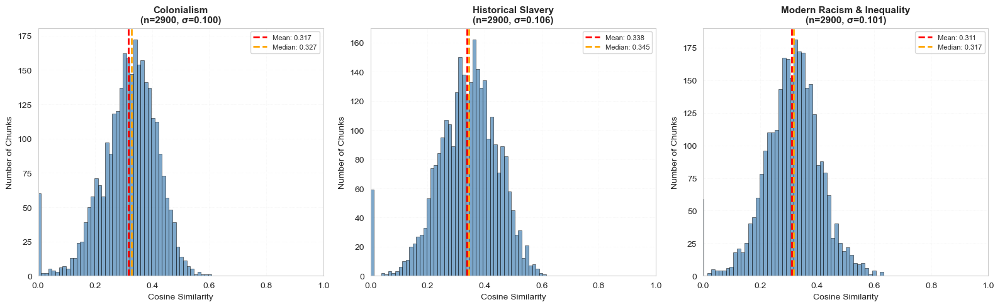


DISTRIBUTION STATISTICS
                     Topic     Mean   Median      Std       Min      Max
               Colonialism 0.317242 0.326843 0.099520 -0.014109 0.608336
        Historical Slavery 0.338189 0.345153 0.106249  0.000000 0.615884
Modern Racism & Inequality 0.310875 0.316549 0.101090 -0.025071 0.632626

✓ Statistics saved: Model_iterations\Slavery_005\visuals\viz_1_statistics.csv

✅ Visualization 1 complete!


In [21]:
# ============================================================
# CELL 13: VIZ 1 - TOPIC SCORE DISTRIBUTION PLOTS
# ============================================================
print(f"\n{'='*60}")
print("CREATING VISUALIZATION 1: TOPIC SCORE DISTRIBUTIONS")
print(f"{'='*60}")

# Check if we have data to visualize
if 'df_viz' not in locals() or df_viz is None or len(df_viz) == 0:
    print("⚠️  No filtered data available. Using df_all_scores instead.")
    df_viz = df_all_scores.copy() if df_all_scores is not None else None

if df_viz is None or len(df_viz) == 0:
    print("❌ No data available for visualization. Please run previous cells first.")
else:
    print(f"Creating distribution plots for {len(topics)} topics...")
    print(f"Using {len(df_viz)} chunks")
    
    # Create figure with subplots
    n_topics = len(topic_cols)
    n_cols = 3
    n_rows = (n_topics + n_cols - 1) // n_cols  # Ceiling division
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 5 * n_rows))
    
    # Flatten axes if multiple rows, otherwise make it a list
    if n_rows > 1:
        axes = axes.flatten()
    elif n_rows == 1 and n_topics > 1:
        axes = axes  # Already a 1D array
    else:
        axes = [axes]  # Single subplot case
    
    # Plot each topic
    for idx, col in enumerate(topic_cols):
        if idx < len(axes):
            topic_name = col.replace("cos_", "")
            
            # Calculate statistics
            mean_val = df_viz[col].mean()
            median_val = df_viz[col].median()
            std_val = df_viz[col].std()
            
            # Create histogram
            axes[idx].hist(df_viz[col], bins=50, color='steelblue', alpha=0.7, 
                          edgecolor='black', linewidth=0.5)
            
            # Add mean and median lines
            axes[idx].axvline(mean_val, color='red', linestyle='--', linewidth=2, 
                             label=f'Mean: {mean_val:.3f}')
            axes[idx].axvline(median_val, color='orange', linestyle='--', linewidth=2, 
                             label=f'Median: {median_val:.3f}')
            
            # Styling
            axes[idx].set_xlabel('Cosine Similarity', fontsize=10)
            axes[idx].set_ylabel('Number of Chunks', fontsize=10)
            axes[idx].set_title(f'{topic_name}\n(n={len(df_viz)}, σ={std_val:.3f})', 
                               fontsize=11, fontweight='bold')
            axes[idx].legend(fontsize=8, loc='upper right')
            axes[idx].grid(alpha=0.3, linestyle=':', linewidth=0.5)
            
            # Set x-axis limits for better visualization
            axes[idx].set_xlim(0, 1)
    
    # Hide unused subplots
    for idx in range(len(topic_cols), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    
    # Save figure
    viz_path = os.path.join(visuals_folder, "viz_1_topic_distributions.png")
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Saved: {viz_path}")
    
    plt.show()
    
    # Print summary statistics
    print(f"\n{'='*60}")
    print("DISTRIBUTION STATISTICS")
    print(f"{'='*60}")
    
    stats_df = pd.DataFrame({
        'Topic': topics,
        'Mean': [df_viz[f'cos_{t}'].mean() for t in topics],
        'Median': [df_viz[f'cos_{t}'].median() for t in topics],
        'Std': [df_viz[f'cos_{t}'].std() for t in topics],
        'Min': [df_viz[f'cos_{t}'].min() for t in topics],
        'Max': [df_viz[f'cos_{t}'].max() for t in topics],
    })
    
    print(stats_df.to_string(index=False))
    
    # Save statistics
    stats_path = os.path.join(visuals_folder, "viz_1_statistics.csv")
    stats_df.to_csv(stats_path, index=False)
    print(f"\n✓ Statistics saved: {stats_path}")
    
    print(f"\n✅ Visualization 1 complete!")

In [22]:
# ============================================================
# CELL 14: VIZ 2 - UNIFIED 2D TOPIC SPACE VISUALIZATION
# ============================================================
print(f"\n{'='*60}")
print("CREATING UNIFIED 2D TOPIC SPACE VISUALIZATION")
print(f"{'='*60}")

# Check if we have data to visualize
if 'df_viz' not in locals() or df_viz is None or len(df_viz) == 0:
    print("⚠️  No filtered data available. Using df_all_scores instead.")
    df_viz = df_all_scores.copy() if df_all_scores is not None else None

if df_viz is None or len(df_viz) == 0:
    print("❌ No data available for visualization. Please run previous cells first.")
else:
    print(f"✓ Visualizing {len(df_viz)} chunks")
    
    # Create a working copy
    df_pca = df_viz.copy()
    
    # Get the cosine score matrix
    score_matrix = df_pca[topic_cols].values
    
    # Apply PCA to reduce to 2D
    from sklearn.decomposition import PCA
    from sklearn.preprocessing import StandardScaler
    
    scaler = StandardScaler()
    scores_scaled = scaler.fit_transform(score_matrix)
    
    pca = PCA(n_components=2, random_state=42)
    pca_coords = pca.fit_transform(scores_scaled)
    
    # Add PCA coordinates to dataframe
    df_pca['pca_x'] = pca_coords[:, 0]
    df_pca['pca_y'] = pca_coords[:, 1]
    
    # Ensure primary_topic and primary_score exist
    if 'primary_topic' not in df_pca.columns:
        df_pca['primary_topic'] = df_pca[topic_cols].idxmax(axis=1).str.replace('cos_', '')
    if 'primary_score' not in df_pca.columns:
        df_pca['primary_score'] = df_pca[topic_cols].max(axis=1)
    
    # Create snippet for hover text
    if 'snippet' not in df_pca.columns:
        df_pca['snippet'] = df_pca['raw_text'].fillna('').str[:200]
    
    # Create the unified plot
    fig = go.Figure()
    
    # Color palette for topics
    topic_colors = px.colors.qualitative.Set2
    
    print(f"\nPlotting {len(topics)} topics...")
    
    # Plot each topic with a different color
    for i, topic in enumerate(topics):
        topic_data = df_pca[df_pca['primary_topic'] == topic]
        
        if len(topic_data) == 0:
            print(f"  ⚠️  No data for topic: {topic}")
            continue
        
        print(f"  • {topic}: {len(topic_data)} chunks")
        
        # Create hover texts
        hover_texts = []
        for idx, r in topic_data.iterrows():
            # Get all topic scores for this chunk
            topic_scores = "<br>".join([f"  • {t}: {r[f'cos_{t}']:.3f}" for t in topics])
            
            # Get confidence level if available
            conf_level = f"<b>Confidence:</b> {r.get('confidence_level', 'N/A')}<br>" if 'confidence_level' in r else ""
            
            hover = (
                f"<b>Primary Topic:</b> {r['primary_topic']}<br>"
                f"<b>Primary Score:</b> {r['primary_score']:.4f}<br>"
                f"{conf_level}"
                f"<b>File:</b> {r.get('short_filename', 'Unknown')}<br>"
                f"<b>Chunk:</b> {r.get('chunk_id', 'Unknown')}<br>"
                f"<br><b>All Topic Scores:</b><br>{topic_scores}<br>"
                f"<br><b>Text Preview:</b><br>{r['snippet'][:150]}..."
            )
            hover_texts.append(hover)
        
        # Add scatter trace for this topic
        fig.add_trace(
            go.Scatter(
                x=topic_data['pca_x'],
                y=topic_data['pca_y'],
                mode='markers',
                marker=dict(
                    size=8,
                    color=topic_colors[i % len(topic_colors)],
                    opacity=0.7,
                    line=dict(width=0.5, color='white')
                ),
                name=topic,
                hovertemplate='%{hovertext}<extra></extra>',
                hovertext=hover_texts
            )
        )
    
    # Update layout
    fig.update_layout(
        title=dict(
            text=f'Unified Topic Space Visualization<br><sub>All {len(df_pca)} chunks colored by primary topic | PCA on cosine similarity scores</sub>',
            x=0.5,
            xanchor='center'
        ),
        xaxis_title=f'PCA Component 1 ({pca.explained_variance_ratio_[0]:.1%} variance)',
        yaxis_title=f'PCA Component 2 ({pca.explained_variance_ratio_[1]:.1%} variance)',
        height=800,
        width=1400,
        template='plotly_white',
        hovermode='closest',
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.01,
            bgcolor='rgba(255,255,255,0.8)',
            bordercolor='gray',
            borderwidth=1
        )
    )
    
    # Save the visualization
    output_html = os.path.join(visuals_folder, "viz_2_unified_topic_space.html")
    fig.write_html(output_html)
    print(f"\n✓ Saved interactive HTML: {output_html}")
    
    # Also save a static PNG
    try:
        output_png = os.path.join(visuals_folder, "viz_2_unified_topic_space.png")
        fig.write_image(output_png, width=1400, height=800)
        print(f"✓ Saved static PNG: {output_png}")
    except Exception as e:
        print(f"  ⚠️  Could not save PNG (install kaleido if needed): {e}")
    
    # Print statistics
    print(f"\n{'='*60}")
    print("PCA STATISTICS")
    print(f"{'='*60}")
    print(f"  Total points: {len(df_pca)}")
    print(f"  PC1 variance explained: {pca.explained_variance_ratio_[0]:.2%}")
    print(f"  PC2 variance explained: {pca.explained_variance_ratio_[1]:.2%}")
    print(f"  Total variance explained: {pca.explained_variance_ratio_[:2].sum():.2%}")
    
    # Print topic distribution
    print(f"\n{'='*60}")
    print("TOPIC DISTRIBUTION IN VISUALIZATION")
    print(f"{'='*60}")
    topic_counts = df_pca['primary_topic'].value_counts()
    for topic, count in topic_counts.items():
        print(f"  {topic:30s}: {count:4d} chunks ({count/len(df_pca)*100:5.1f}%)")
    
    # Show confidence distribution if available
    if 'confidence_level' in df_pca.columns:
        print(f"\n{'='*60}")
        print("CONFIDENCE LEVEL DISTRIBUTION")
        print(f"{'='*60}")
        conf_counts = df_pca['confidence_level'].value_counts()
        for conf, count in conf_counts.items():
            print(f"  {conf:10s}: {count:4d} chunks ({count/len(df_pca)*100:5.1f}%)")
    
    # Save PCA data for further analysis
    pca_data_path = os.path.join(visuals_folder, "viz_2_pca_coordinates.csv")
    df_pca[['chunk_id', 'primary_topic', 'primary_score', 'pca_x', 'pca_y'] + 
           (['confidence_level'] if 'confidence_level' in df_pca.columns else [])].to_csv(
        pca_data_path, index=False
    )
    print(f"\n✓ PCA coordinates saved: {pca_data_path}")
    
    print(f"\n✅ Visualization 2 complete!")
    
    # Display the plot
    try:
        fig.show()
    except Exception as e:
        print(f"\n  Note: Could not display plot inline: {e}")
        print(f"  Open the HTML file to view: {output_html}")


CREATING UNIFIED 2D TOPIC SPACE VISUALIZATION
✓ Visualizing 2900 chunks

Plotting 3 topics...
  • Colonialism: 870 chunks
  • Historical Slavery: 1196 chunks
  • Modern Racism & Inequality: 834 chunks

✓ Saved interactive HTML: Model_iterations\Slavery_005\visuals\viz_2_unified_topic_space.html
✓ Saved static PNG: Model_iterations\Slavery_005\visuals\viz_2_unified_topic_space.png

PCA STATISTICS
  Total points: 2900
  PC1 variance explained: 69.06%
  PC2 variance explained: 23.29%
  Total variance explained: 92.35%

TOPIC DISTRIBUTION IN VISUALIZATION
  Historical Slavery            : 1196 chunks ( 41.2%)
  Colonialism                   :  870 chunks ( 30.0%)
  Modern Racism & Inequality    :  834 chunks ( 28.8%)

CONFIDENCE LEVEL DISTRIBUTION
  high      : 1183 chunks ( 40.8%)
  low       : 1041 chunks ( 35.9%)
  none      :  676 chunks ( 23.3%)

✓ PCA coordinates saved: Model_iterations\Slavery_005\visuals\viz_2_pca_coordinates.csv

✅ Visualization 2 complete!



CREATING VISUALIZATION 3: BOX PLOT COMPARISON
Creating box plots for 3 topics...
Using 2900 chunks

✓ Saved: Model_iterations\Slavery_005\visuals\viz_3_boxplot_comparison.png


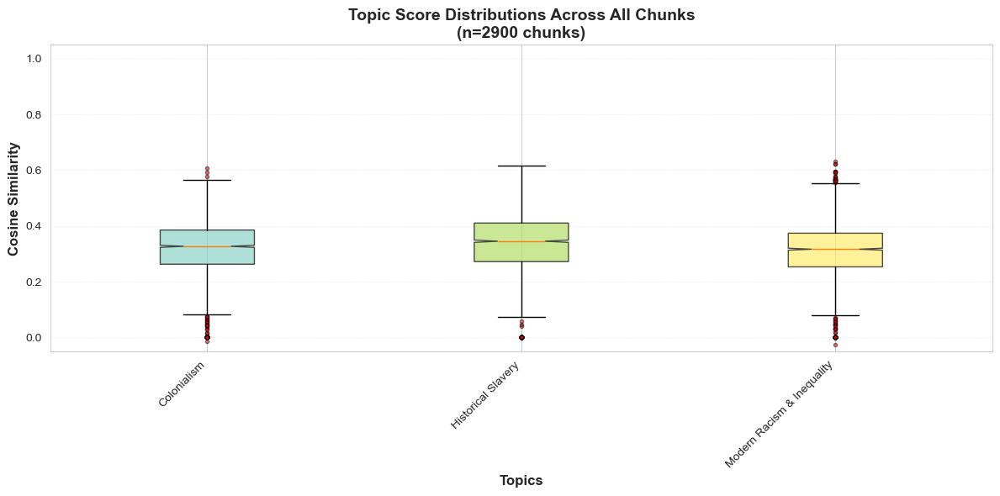


BOX PLOT STATISTICS
                     Topic  Q1 (25%)   Median  Q3 (75%)      IQR       Min      Max  Outliers
               Colonialism  0.262592 0.326843  0.385300 0.122707 -0.014109 0.608336        83
        Historical Slavery  0.272021 0.345153  0.410353 0.138332  0.000000 0.615884        62
Modern Racism & Inequality  0.253159 0.316549  0.373895 0.120736 -0.025071 0.632626       101

✓ Statistics saved: Model_iterations\Slavery_005\visuals\viz_3_boxplot_statistics.csv

KEY INSIGHTS
  Highest median score: Historical Slavery (0.345)
  Lowest median score:  Modern Racism & Inequality (0.317)
  Most outliers:        Modern Racism & Inequality (101 outliers)
  Largest spread (IQR): Historical Slavery (IQR=0.138)

✅ Visualization 3 complete!


In [23]:
# ============================================================
# CELL 15: VIZ 3 - BOX PLOT COMPARISON
# ============================================================
print(f"\n{'='*60}")
print("CREATING VISUALIZATION 3: BOX PLOT COMPARISON")
print(f"{'='*60}")

# Check if we have data to visualize
if 'df_viz' not in locals() or df_viz is None or len(df_viz) == 0:
    print("⚠️  No filtered data available. Using df_all_scores instead.")
    df_viz = df_all_scores.copy() if df_all_scores is not None else None

if df_viz is None or len(df_viz) == 0:
    print("❌ No data available for visualization. Please run previous cells first.")
else:
    print(f"Creating box plots for {len(topics)} topics...")
    print(f"Using {len(df_viz)} chunks")
    
    # Prepare data for box plot
    plot_data = []
    plot_labels = []
    
    for col in topic_cols:
        plot_data.append(df_viz[col].values)
        plot_labels.append(col.replace("cos_", ""))
    
    # Create figure
    fig, ax = plt.subplots(figsize=(max(12, len(topics) * 1.5), 6))
    
    # Create box plot
    bp = ax.boxplot(plot_data, labels=plot_labels, patch_artist=True, notch=True,
                     showfliers=True,  # Show outliers
                     flierprops=dict(marker='o', markerfacecolor='red', markersize=3, 
                                    linestyle='none', alpha=0.5))
    
    # Color the boxes
    colors = plt.cm.Set3(np.linspace(0, 1, len(topics)))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    # Styling
    ax.set_ylabel('Cosine Similarity', fontsize=12, fontweight='bold')
    ax.set_xlabel('Topics', fontsize=12, fontweight='bold')
    ax.set_title(f'Topic Score Distributions Across All Chunks\n(n={len(df_viz)} chunks)', 
                 fontsize=14, fontweight='bold')
    ax.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.5)
    ax.set_ylim(-0.05, 1.05)
    
    # Rotate x-axis labels for readability
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.tight_layout()
    
    # Save figure
    viz_path = os.path.join(visuals_folder, "viz_3_boxplot_comparison.png")
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Saved: {viz_path}")
    
    plt.show()
    
    # Print summary statistics
    print(f"\n{'='*60}")
    print("BOX PLOT STATISTICS")
    print(f"{'='*60}")
    
    stats_data = []
    for topic, col in zip(topics, topic_cols):
        data = df_viz[col]
        stats_data.append({
            'Topic': topic,
            'Q1 (25%)': data.quantile(0.25),
            'Median': data.median(),
            'Q3 (75%)': data.quantile(0.75),
            'IQR': data.quantile(0.75) - data.quantile(0.25),
            'Min': data.min(),
            'Max': data.max(),
            'Outliers': ((data < (data.quantile(0.25) - 1.5 * (data.quantile(0.75) - data.quantile(0.25)))) |
                        (data > (data.quantile(0.75) + 1.5 * (data.quantile(0.75) - data.quantile(0.25))))).sum()
        })
    
    stats_df = pd.DataFrame(stats_data)
    print(stats_df.to_string(index=False))
    
    # Save statistics
    stats_path = os.path.join(visuals_folder, "viz_3_boxplot_statistics.csv")
    stats_df.to_csv(stats_path, index=False)
    print(f"\n✓ Statistics saved: {stats_path}")
    
    # Identify topics with highest/lowest medians
    max_median_topic = stats_df.loc[stats_df['Median'].idxmax(), 'Topic']
    max_median_value = stats_df['Median'].max()
    min_median_topic = stats_df.loc[stats_df['Median'].idxmin(), 'Topic']
    min_median_value = stats_df['Median'].min()
    
    print(f"\n{'='*60}")
    print("KEY INSIGHTS")
    print(f"{'='*60}")
    print(f"  Highest median score: {max_median_topic} ({max_median_value:.3f})")
    print(f"  Lowest median score:  {min_median_topic} ({min_median_value:.3f})")
    print(f"  Most outliers:        {stats_df.loc[stats_df['Outliers'].idxmax(), 'Topic']} ({stats_df['Outliers'].max()} outliers)")
    print(f"  Largest spread (IQR): {stats_df.loc[stats_df['IQR'].idxmax(), 'Topic']} (IQR={stats_df['IQR'].max():.3f})")
    
    print(f"\n✅ Visualization 3 complete!")


CREATING VISUALIZATION 4: HEATMAP OF TOP CHUNKS
Selecting top 30 chunks by maximum topic score...

✓ Saved: Model_iterations\Slavery_005\visuals\viz_4_heatmap_top_chunks.png


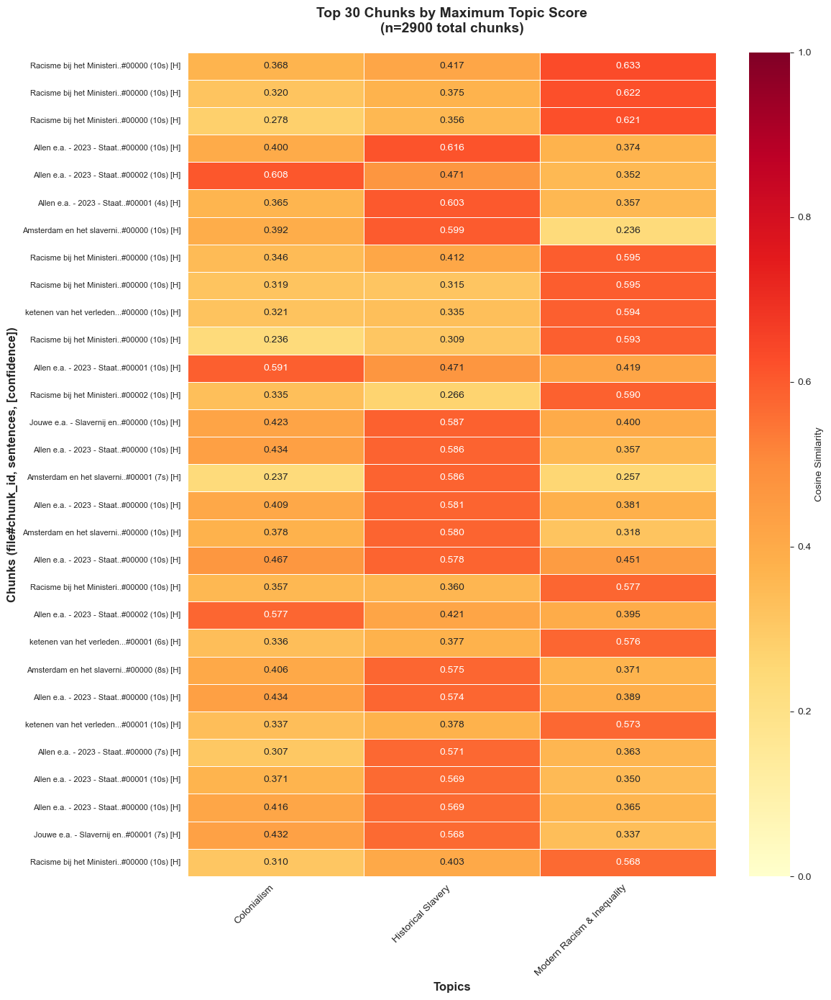


TOP CHUNKS STATISTICS

Score range:
  Highest: 0.6326
  Lowest:  0.5682
  Mean:    0.5886

Primary topic distribution in top 30 chunks:
  Historical Slavery            : 15 chunks ( 50.0%)
  Modern Racism & Inequality    : 12 chunks ( 40.0%)
  Colonialism                   :  3 chunks ( 10.0%)

Confidence level distribution:
  high      : 30 chunks (100.0%)

✓ Top chunks details saved: Model_iterations\Slavery_005\visuals\viz_4_top_chunks_details.csv

✅ Visualization 4 complete!


In [24]:
# ============================================================
# CELL 16: VIZ 4 - HEATMAP OF TOP CHUNKS
# ============================================================
print(f"\n{'='*60}")
print("CREATING VISUALIZATION 4: HEATMAP OF TOP CHUNKS")
print(f"{'='*60}")

# Check if we have data to visualize
if 'df_viz' not in locals() or df_viz is None or len(df_viz) == 0:
    print("⚠️  No filtered data available. Using df_all_scores instead.")
    df_viz = df_all_scores.copy() if df_all_scores is not None else None

if df_viz is None or len(df_viz) == 0:
    print("❌ No data available for visualization. Please run previous cells first.")
else:
    # Create working copy
    df_heatmap = df_viz.copy()
    
    # Calculate max score if not already present
    if 'max_score' not in df_heatmap.columns:
        df_heatmap['max_score'] = df_heatmap[topic_cols].max(axis=1)
    
    # Number of top chunks to display
    N_TOP_CHUNKS = min(30, len(df_heatmap))  # Adjust if less than 30 chunks
    
    print(f"Selecting top {N_TOP_CHUNKS} chunks by maximum topic score...")
    
    # Get top chunks
    top_chunks = df_heatmap.nlargest(N_TOP_CHUNKS, 'max_score')
    
    # Prepare heatmap data (topic scores)
    heatmap_data = top_chunks[topic_cols].values
    
    # Create short labels for y-axis
    short_labels = []
    for idx, row in top_chunks.iterrows():
        # Try to create a readable label
        try:
            filename = row.get('filename', 'unknown')
            chunk_id = row.get('chunk_id', 'unknown')
            
            # Extract filename stem
            file_stem = Path(filename).stem[:25] if filename != 'unknown' else 'unknown'
            
            # Extract chunk number
            chunk_num = chunk_id.split(':')[-1] if ':' in str(chunk_id) else chunk_id
            
            # Build label
            label = f"{file_stem}..#{chunk_num}"
            
            # Add sentence count if available
            if 'sentence_count' in row and pd.notna(row['sentence_count']):
                label += f" ({int(row['sentence_count'])}s)"
            
            # Add confidence level if available
            if 'confidence_level' in row and pd.notna(row['confidence_level']):
                label += f" [{row['confidence_level'][0].upper()}]"  # H/L/N for high/low/none
            
            short_labels.append(label)
        except Exception as e:
            short_labels.append(f"chunk_{idx}")
    
    # Create figure
    fig, ax = plt.subplots(figsize=(12, max(14, N_TOP_CHUNKS * 0.4)))
    
    # Create heatmap
    sns.heatmap(heatmap_data, 
                xticklabels=[t.replace("cos_", "") for t in topic_cols],
                yticklabels=short_labels,
                cmap='YlOrRd',
                annot=True,
                fmt='.3f',
                cbar_kws={'label': 'Cosine Similarity'},
                linewidths=0.5,
                vmin=0,
                vmax=1,
                ax=ax)
    
    # Styling
    ax.set_title(f'Top {N_TOP_CHUNKS} Chunks by Maximum Topic Score\n(n={len(df_viz)} total chunks)', 
                 fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('Topics', fontsize=12, fontweight='bold')
    ax.set_ylabel('Chunks (file#chunk_id, sentences, [confidence])', fontsize=12, fontweight='bold')
    
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=8)
    plt.tight_layout()
    
    # Save figure
    viz_path = os.path.join(visuals_folder, "viz_4_heatmap_top_chunks.png")
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Saved: {viz_path}")
    
    plt.show()
    
    # Print statistics about top chunks
    print(f"\n{'='*60}")
    print("TOP CHUNKS STATISTICS")
    print(f"{'='*60}")
    
    print(f"\nScore range:")
    print(f"  Highest: {top_chunks['max_score'].max():.4f}")
    print(f"  Lowest:  {top_chunks['max_score'].min():.4f}")
    print(f"  Mean:    {top_chunks['max_score'].mean():.4f}")
    
    # Show primary topic distribution in top chunks
    if 'primary_topic' not in top_chunks.columns:
        top_chunks['primary_topic'] = top_chunks[topic_cols].idxmax(axis=1).str.replace('cos_', '')
    
    print(f"\nPrimary topic distribution in top {N_TOP_CHUNKS} chunks:")
    topic_dist = top_chunks['primary_topic'].value_counts()
    for topic, count in topic_dist.items():
        print(f"  {topic:30s}: {count:2d} chunks ({count/N_TOP_CHUNKS*100:5.1f}%)")
    
    # Show confidence distribution if available
    if 'confidence_level' in top_chunks.columns:
        print(f"\nConfidence level distribution:")
        conf_dist = top_chunks['confidence_level'].value_counts()
        for conf, count in conf_dist.items():
            print(f"  {conf:10s}: {count:2d} chunks ({count/N_TOP_CHUNKS*100:5.1f}%)")
    
    # Save top chunks details
    top_chunks_export = top_chunks[['chunk_id', 'filename', 'primary_topic', 'max_score'] + 
                                   topic_cols +
                                   (['confidence_level'] if 'confidence_level' in top_chunks.columns else []) +
                                   (['raw_text'] if 'raw_text' in top_chunks.columns else [])]
    
    export_path = os.path.join(visuals_folder, "viz_4_top_chunks_details.csv")
    top_chunks_export.to_csv(export_path, index=False, encoding='utf-8')
    print(f"\n✓ Top chunks details saved: {export_path}")
    
    print(f"\n✅ Visualization 4 complete!")


CREATING UNIFIED 2D TOPIC VISUALIZATION


FileNotFoundError: [Errno 2] No such file or directory: 'xfmr_doc_topic_cosine_scores.csv'

✓ Saved: Model_iterations\vocab_003\visuals\viz_4_scatter_matrix.png


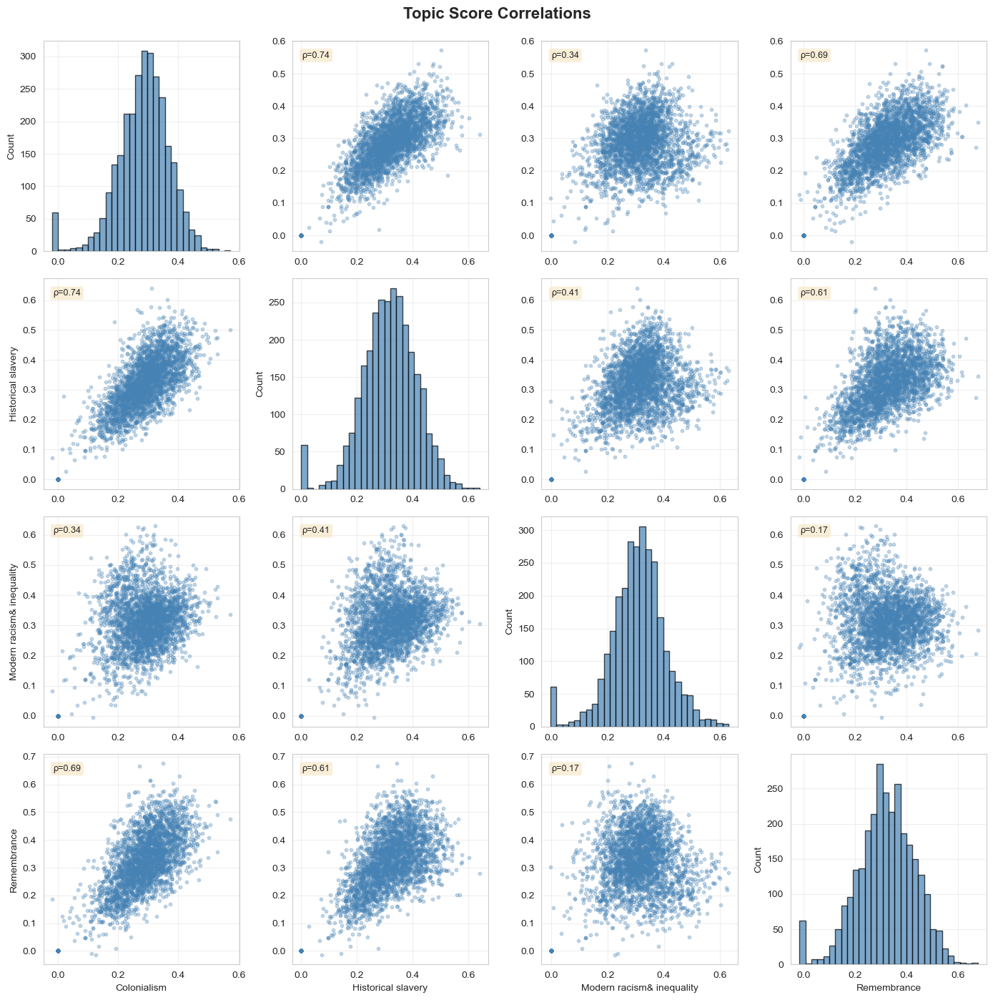

In [28]:
# ============================================================
# CELL 7: VIZ 4 - SCATTER PLOT MATRIX
# ============================================================
if len(topics) >= 2:
    n_topics_to_plot = min(4, len(topics))
    fig, axes = plt.subplots(n_topics_to_plot, n_topics_to_plot, figsize=(14, 14))
    
    if n_topics_to_plot == 1:
        axes = np.array([[axes]])
    elif n_topics_to_plot == 2:
        axes = axes.reshape(2, 2)
    
    for i in range(n_topics_to_plot):
        for j in range(n_topics_to_plot):
            if i == j:
                axes[i, j].hist(df[topic_cols[i]], bins=30, color='steelblue', 
                               alpha=0.7, edgecolor='black')
                axes[i, j].set_ylabel('Count')
                if i == n_topics_to_plot - 1:
                    axes[i, j].set_xlabel(topics[i])
            else:
                axes[i, j].scatter(df[topic_cols[j]], df[topic_cols[i]], 
                                  alpha=0.3, s=10, color='steelblue')
                axes[i, j].set_xlabel(topics[j] if i == n_topics_to_plot - 1 else '')
                axes[i, j].set_ylabel(topics[i] if j == 0 else '')
                
                corr = df[topic_cols[i]].corr(df[topic_cols[j]])
                axes[i, j].text(0.05, 0.95, f'ρ={corr:.2f}', 
                               transform=axes[i, j].transAxes,
                               fontsize=9, verticalalignment='top',
                               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            
            axes[i, j].grid(alpha=0.3)
    
    plt.suptitle('Topic Score Correlations', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    
    viz_path = os.path.join(visuals_folder, "viz_4_scatter_matrix.png")
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    print(f"✓ Saved: {viz_path}")
    plt.show()



CREATING VISUALIZATION 5: DOMINANT TOPICS DISTRIBUTION
Analyzing dominant topics for 2900 chunks...

✓ Saved: Model_iterations\Slavery_005\visuals\viz_5_dominant_topics.png


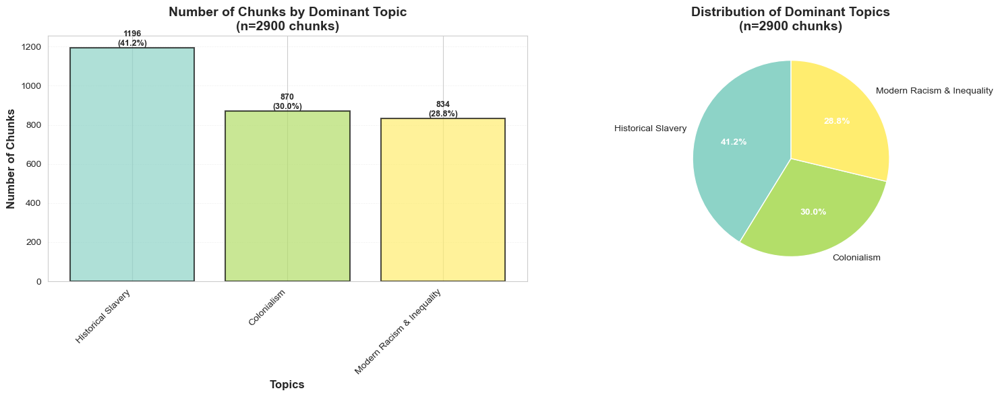


DOMINANT TOPICS STATISTICS

Topic distribution:
  Historical Slavery            : 1196 chunks ( 41.2%) - avg score: 0.407
  Colonialism                   :  870 chunks ( 30.0%) - avg score: 0.348
  Modern Racism & Inequality    :  834 chunks ( 28.8%) - avg score: 0.387

Dominance strength (score of dominant topic):
  Mean:   0.3836
  Median: 0.3916
  Min:    0.0000
  Max:    0.6326

Score margin (difference between 1st and 2nd topic):
  Mean:   0.0645
  Median: 0.0511

Dominance clarity:
  Clear (margin > 0.10):      621 chunks ( 21.4%)
  Moderate (margin 0.05-0.10):  856 chunks ( 29.5%)
  Ambiguous (margin < 0.05): 1423 chunks ( 49.1%)

By confidence level:

  HIGH confidence (1183 chunks):
    Historical Slavery          : 527 chunks ( 44.5%)
    Modern Racism & Inequality  : 420 chunks ( 35.5%)
    Colonialism                 : 236 chunks ( 19.9%)

  LOW confidence (1041 chunks):
    Historical Slavery          : 412 chunks ( 39.6%)
    Colonialism                 : 364 chunks ( 35

In [25]:
# ============================================================
# CELL 17: VIZ 5 - DOMINANT TOPICS DISTRIBUTION
# ============================================================
print(f"\n{'='*60}")
print("CREATING VISUALIZATION 5: DOMINANT TOPICS DISTRIBUTION")
print(f"{'='*60}")

# Check if we have data to visualize
if 'df_viz' not in locals() or df_viz is None or len(df_viz) == 0:
    print("⚠️  No filtered data available. Using df_all_scores instead.")
    df_viz = df_all_scores.copy() if df_all_scores is not None else None

if df_viz is None or len(df_viz) == 0:
    print("❌ No data available for visualization. Please run previous cells first.")
else:
    # Create working copy
    df_dominant = df_viz.copy()
    
    # Calculate dominant topic and score if not already present
    if 'dominant_topic' not in df_dominant.columns or 'primary_topic' in df_dominant.columns:
        # Use primary_topic if available, otherwise calculate
        if 'primary_topic' in df_dominant.columns:
            df_dominant['dominant_topic'] = df_dominant['primary_topic']
        else:
            df_dominant['dominant_topic'] = df_dominant[topic_cols].idxmax(axis=1).str.replace('cos_', '')
    
    if 'dominant_score' not in df_dominant.columns:
        if 'primary_score' in df_dominant.columns:
            df_dominant['dominant_score'] = df_dominant['primary_score']
        else:
            df_dominant['dominant_score'] = df_dominant[topic_cols].max(axis=1)
    
    print(f"Analyzing dominant topics for {len(df_dominant)} chunks...")
    
    # Get topic counts
    topic_counts = df_dominant['dominant_topic'].value_counts()
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Color palette
    colors = plt.cm.Set3(np.linspace(0, 1, len(topic_counts)))
    
    # --- LEFT PLOT: Bar Chart ---
    bars = ax1.bar(range(len(topic_counts)), topic_counts.values, color=colors, 
                   alpha=0.7, edgecolor='black', linewidth=1.5)
    ax1.set_xticks(range(len(topic_counts)))
    ax1.set_xticklabels(topic_counts.index, rotation=45, ha='right', fontsize=10)
    ax1.set_ylabel('Number of Chunks', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Topics', fontsize=12, fontweight='bold')
    ax1.set_title(f'Number of Chunks by Dominant Topic\n(n={len(df_dominant)} chunks)', 
                  fontsize=14, fontweight='bold')
    ax1.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.5)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}\n({height/len(df_dominant)*100:.1f}%)',
                ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    # --- RIGHT PLOT: Pie Chart ---
    wedges, texts, autotexts = ax2.pie(topic_counts.values, 
                                        labels=topic_counts.index, 
                                        autopct='%1.1f%%',
                                        colors=colors, 
                                        startangle=90,
                                        textprops={'fontsize': 10})
    
    # Make percentage text bold
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
        autotext.set_fontsize(10)
    
    ax2.set_title(f'Distribution of Dominant Topics\n(n={len(df_dominant)} chunks)', 
                  fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    
    # Save figure
    viz_path = os.path.join(visuals_folder, "viz_5_dominant_topics.png")
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Saved: {viz_path}")
    
    plt.show()
    
    # Print detailed statistics
    print(f"\n{'='*60}")
    print("DOMINANT TOPICS STATISTICS")
    print(f"{'='*60}")
    
    print(f"\nTopic distribution:")
    for topic, count in topic_counts.items():
        pct = count / len(df_dominant) * 100
        avg_score = df_dominant[df_dominant['dominant_topic'] == topic]['dominant_score'].mean()
        print(f"  {topic:30s}: {count:4d} chunks ({pct:5.1f}%) - avg score: {avg_score:.3f}")
    
    # Calculate dominance strength statistics
    print(f"\nDominance strength (score of dominant topic):")
    print(f"  Mean:   {df_dominant['dominant_score'].mean():.4f}")
    print(f"  Median: {df_dominant['dominant_score'].median():.4f}")
    print(f"  Min:    {df_dominant['dominant_score'].min():.4f}")
    print(f"  Max:    {df_dominant['dominant_score'].max():.4f}")
    
    # Analyze score margins (how clear is the dominance?)
    if 'score_margin' not in df_dominant.columns:
        topic_scores = df_dominant[topic_cols].values
        sorted_scores = np.sort(topic_scores, axis=1)[:, ::-1]
        df_dominant['score_margin'] = sorted_scores[:, 0] - sorted_scores[:, 1]
    
    print(f"\nScore margin (difference between 1st and 2nd topic):")
    print(f"  Mean:   {df_dominant['score_margin'].mean():.4f}")
    print(f"  Median: {df_dominant['score_margin'].median():.4f}")
    
    # Categorize by dominance clarity
    clear_dominant = (df_dominant['score_margin'] > 0.1).sum()
    moderate_dominant = ((df_dominant['score_margin'] >= 0.05) & 
                         (df_dominant['score_margin'] <= 0.1)).sum()
    ambiguous = (df_dominant['score_margin'] < 0.05).sum()
    
    print(f"\nDominance clarity:")
    print(f"  Clear (margin > 0.10):     {clear_dominant:4d} chunks ({clear_dominant/len(df_dominant)*100:5.1f}%)")
    print(f"  Moderate (margin 0.05-0.10): {moderate_dominant:4d} chunks ({moderate_dominant/len(df_dominant)*100:5.1f}%)")
    print(f"  Ambiguous (margin < 0.05): {ambiguous:4d} chunks ({ambiguous/len(df_dominant)*100:5.1f}%)")
    
    # Show confidence distribution if available
    if 'confidence_level' in df_dominant.columns:
        print(f"\nBy confidence level:")
        for conf in ['high', 'low', 'none']:
            if conf in df_dominant['confidence_level'].values:
                conf_df = df_dominant[df_dominant['confidence_level'] == conf]
                conf_topics = conf_df['dominant_topic'].value_counts()
                print(f"\n  {conf.upper()} confidence ({len(conf_df)} chunks):")
                for topic, count in conf_topics.head(3).items():
                    print(f"    {topic:28s}: {count:3d} chunks ({count/len(conf_df)*100:5.1f}%)")
    
    # Save dominant topics data
    dominant_export = df_dominant[['chunk_id', 'dominant_topic', 'dominant_score', 'score_margin'] +
                                  (['confidence_level'] if 'confidence_level' in df_dominant.columns else [])]
    
    export_path = os.path.join(visuals_folder, "viz_5_dominant_topics_data.csv")
    dominant_export.to_csv(export_path, index=False, encoding='utf-8')
    print(f"\n✓ Dominant topics data saved: {export_path}")
    
    print(f"\n✅ Visualization 5 complete!")


DOCUMENT-LEVEL AGGREGATION

Documents analyzed: 1378
Average chunks per document: 2.1
✓ Saved document aggregation → Model_iterations\vocab_003\processed_data\document_level_topic_scores.csv
✓ Saved: Model_iterations\vocab_003\visuals\viz_6_document_dominant_topics.png


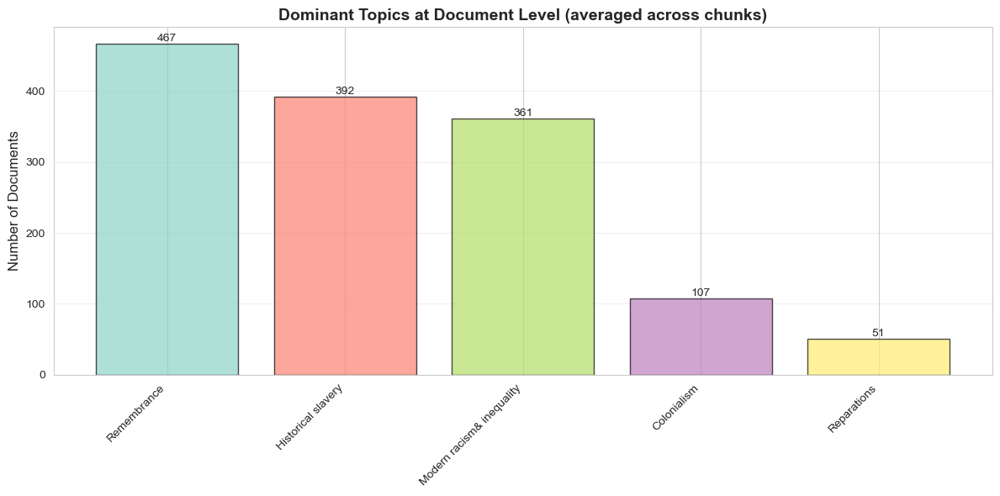

In [30]:
# ============================================================
# CELL 9: VIZ 6 - DOCUMENT-LEVEL AGGREGATION
# ============================================================
print("\n" + "="*60)
print("DOCUMENT-LEVEL AGGREGATION")
print("="*60)

doc_aggregated = df.groupby('filename').agg({
    **{col: 'mean' for col in topic_cols},
    'chunk_id': 'count',
})
doc_aggregated.rename(columns={'chunk_id': 'num_chunks'}, inplace=True)

doc_aggregated['dominant_topic'] = doc_aggregated[topic_cols].idxmax(axis=1).str.replace('cos_', '')
doc_aggregated['dominant_score'] = doc_aggregated[topic_cols].max(axis=1)

print(f"\nDocuments analyzed: {len(doc_aggregated)}")
print(f"Average chunks per document: {doc_aggregated['num_chunks'].mean():.1f}")

doc_agg_path = os.path.join(data_folder, "document_level_topic_scores.csv")
doc_aggregated.to_csv(doc_agg_path, encoding='utf-8-sig')
print(f"✓ Saved document aggregation → {doc_agg_path}")

doc_topic_counts = doc_aggregated['dominant_topic'].value_counts()

fig, ax = plt.subplots(figsize=(12, 6))
colors = plt.cm.Set3(np.linspace(0, 1, len(doc_topic_counts)))
bars = ax.bar(range(len(doc_topic_counts)), doc_topic_counts.values, 
              color=colors, alpha=0.7, edgecolor='black')
ax.set_xticks(range(len(doc_topic_counts)))
ax.set_xticklabels(doc_topic_counts.index, rotation=45, ha='right')
ax.set_ylabel('Number of Documents', fontsize=12)
ax.set_title('Dominant Topics at Document Level (averaged across chunks)', 
             fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=10)

plt.tight_layout()

viz_path = os.path.join(visuals_folder, "viz_6_document_dominant_topics.png")
plt.savefig(viz_path, dpi=300, bbox_inches='tight')
print(f"✓ Saved: {viz_path}")
plt.show()



In [31]:
# ============================================================
# CELL 10: EXPORT TOP CHUNKS PER TOPIC
# ============================================================
print("\n" + "="*60)
print("TOP 10 CHUNKS PER TOPIC")
print("="*60)

top_chunks_report = []
for col in topic_cols:
    topic_name = col.replace("cos_", "")
    print(f"\n{topic_name}:")
    
    cols_to_keep = ['filename', 'chunk_id', col]
    if 'sentence_count' in df.columns:
        cols_to_keep.append('sentence_count')
    
    top = df.nlargest(10, col)[cols_to_keep].copy()
    top['topic'] = topic_name
    top.rename(columns={col: 'score'}, inplace=True)
    
    for idx, row in top.iterrows():
        display = f"{row['score']:.4f} - {Path(row['filename']).name} [chunk: {row['chunk_id']}]"
        if 'sentence_count' in row:
            display += f" ({int(row['sentence_count'])} sentences)"
        print(f"  {display}")
        top_chunks_report.append(row)

report_df = pd.DataFrame(top_chunks_report)
report_path = os.path.join(data_folder, "top_chunks_per_topic.csv")
report_df.to_csv(report_path, index=False, encoding='utf-8-sig')
print(f"\n✓ Saved detailed report → {report_path}")



TOP 10 CHUNKS PER TOPIC

Colonialism:
  0.5728 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.451.txt [chunk: c0aee7eb:00002] (10 sentences)
  0.5306 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.465.txt [chunk: f2e5f4e4:00004] (10 sentences)
  0.5301 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.452.txt [chunk: b79b973e:00001] (10 sentences)
  0.5239 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.451.txt [chunk: c0aee7eb:00004] (10 sentences)
  0.5216 - ketenen van het verleden.152.txt [chunk: ccb9b5e8:00002] (10 sentences)
  0.5059 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.461.txt [chunk: e29b2b78:00002] (10 sentences)
  0.5002 - Allen e.a. - 2023 - Staat en slavernij het Nederland

In [32]:
#============================================================
# CELL 11: EXPORT SUMMARY STATISTICS
# ============================================================
summary_stats = []
for col in topic_cols:
    topic_name = col.replace("cos_", "")
    summary_stats.append({
        'topic': topic_name,
        'mean': df[col].mean(),
        'median': df[col].median(),
        'std': df[col].std(),
        'min': df[col].min(),
        'max': df[col].max(),
        'q25': df[col].quantile(0.25),
        'q75': df[col].quantile(0.75),
        'n_chunks': len(df),
        'n_high_score': (df[col] > 0.7).sum(),
        'pct_high_score': 100 * (df[col] > 0.7).sum() / len(df),
    })

summary_df = pd.DataFrame(summary_stats)
summary_path = os.path.join(data_folder, "topic_score_statistics.csv")
summary_df.to_csv(summary_path, index=False, encoding='utf-8-sig')
print(f"✓ Saved statistics → {summary_path}")

✓ Saved statistics → Model_iterations\vocab_003\processed_data\topic_score_statistics.csv


In [33]:
# ============================================================
# CELL 12: CLUSTERING CONFIGURATION
# ============================================================
print("\n" + "="*60)
print("CLUSTERING ANALYSIS SETUP")
print("="*60)

N_CLUSTERS = 5
MIN_SCORE_THRESHOLD = 0.3

print(f"Configuration:")
print(f"  - Clusters per topic: {N_CLUSTERS}")
print(f"  - Minimum score threshold: {MIN_SCORE_THRESHOLD}")


CLUSTERING ANALYSIS SETUP
Configuration:
  - Clusters per topic: 5
  - Minimum score threshold: 0.3


In [34]:
# ============================================================
# CELL 13: PERFORM CLUSTERING PER TOPIC
# ============================================================
print("\n" + "="*60)
print("PERFORMING CLUSTERING PER TOPIC")
print("="*60)

clustering_results = {}

for topic_col in topic_cols:
    topic_name = topic_col.replace("cos_", "")
    print(f"\nProcessing: {topic_name}")
    
    topic_df = df[df[topic_col] > MIN_SCORE_THRESHOLD].copy()
    
    if len(topic_df) < N_CLUSTERS:
        print(f"  ⚠ Only {len(topic_df)} chunks above threshold, skipping clustering")
        continue
    
    X = topic_df[topic_cols].values
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    n_clusters = min(N_CLUSTERS, len(topic_df))
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)
    
    topic_df['cluster'] = cluster_labels
    topic_df['pca_x'] = X_pca[:, 0]
    topic_df['pca_y'] = X_pca[:, 1]
    topic_df['primary_score'] = topic_df[topic_col]
    
    if 'raw_text' in topic_df.columns:
        topic_df['snippet'] = topic_df['raw_text'].apply(
            lambda x: (str(x)[:200] + '...') if pd.notna(x) and len(str(x)) > 200 else str(x) if pd.notna(x) else ''
        )
    else:
        topic_df['snippet'] = ''
    
    clustering_results[topic_name] = {
        'data': topic_df,
        'kmeans': kmeans,
        'pca': pca,
        'scaler': scaler,
        'n_clusters': n_clusters,
        'explained_variance': pca.explained_variance_ratio_
    }
    
    print(f"  ✓ Clustered {len(topic_df)} chunks into {n_clusters} clusters")
    print(f"  PCA explained variance: {pca.explained_variance_ratio_.sum():.2%}")


PERFORMING CLUSTERING PER TOPIC

Processing: Colonialism
  ✓ Clustered 1282 chunks into 5 clusters
  PCA explained variance: 59.03%

Processing: Historical slavery
  ✓ Clustered 1674 chunks into 5 clusters
  PCA explained variance: 56.41%

Processing: Modern racism& inequality
  ✓ Clustered 1621 chunks into 5 clusters
  PCA explained variance: 71.13%

Processing: Remembrance
  ✓ Clustered 1665 chunks into 5 clusters
  PCA explained variance: 62.84%

Processing: Reparations
  ✓ Clustered 449 chunks into 5 clusters
  PCA explained variance: 65.90%


In [35]:
# ============================================================
# CELL 14: INTERACTIVE 2D CLUSTERING VISUALIZATION
# ============================================================
print("\n" + "="*60)
print("CREATING 2D CLUSTERING VISUALIZATIONS")
print("="*60)

n_topics = len(clustering_results)
if n_topics == 0:
    print("⚠ No topics had enough chunks to cluster")
else:
    n_cols = 2
    n_rows = (n_topics + n_cols - 1) // n_cols
    
    fig = make_subplots(
        rows=n_rows, 
        cols=n_cols,
        subplot_titles=list(clustering_results.keys()),
        vertical_spacing=0.10,
        horizontal_spacing=0.10
    )
    
    color_scale = px.colors.qualitative.Set3
    
    for i, (topic_name, results) in enumerate(clustering_results.items()):
        row = i // n_cols + 1
        col = i % n_cols + 1
        
        topic_df = results['data']
        
        hover_texts = {}
        for idx, r in topic_df.iterrows():
            hover = (
                f"<b>File:</b> {Path(r['filename']).name}<br>"
                f"<b>Chunk:</b> {r['chunk_id']}<br>"
                f"<b>Cluster:</b> {r['cluster']}<br>"
                f"<b>Score:</b> {r['primary_score']:.4f}<br>"
                f"<br><b>Text:</b><br>{r['snippet'][:150]}"
            )
            hover_texts[idx] = hover
        
        for cluster_id in sorted(topic_df['cluster'].unique()):
            cluster_data = topic_df[topic_df['cluster'] == cluster_id]
            cluster_hover = [hover_texts[idx] for idx in cluster_data.index]
            
            fig.add_trace(
                go.Scatter(
                    x=cluster_data['pca_x'],
                    y=cluster_data['pca_y'],
                    mode='markers',
                    marker=dict(
                        size=8,
                        color=color_scale[cluster_id % len(color_scale)],
                        opacity=0.7,
                        line=dict(width=0.5, color='white')
                    ),
                    name=f'C{cluster_id}',
                    hovertemplate='%{hovertext}<extra></extra>',
                    hovertext=cluster_hover,
                    showlegend=(i == 0),
                    legendgroup=f'cluster_{cluster_id}'
                ),
                row=row,
                col=col
            )
        
        centers_pca = results['pca'].transform(results['scaler'].transform(results['kmeans'].cluster_centers_))
        fig.add_trace(
            go.Scatter(
                x=centers_pca[:, 0],
                y=centers_pca[:, 1],
                mode='markers',
                marker=dict(
                    size=15,
                    color='red',
                    symbol='x',
                    line=dict(width=2, color='darkred')
                ),
                name='Centers',
                showlegend=(i == 0),
                legendgroup='centers',
                hoverinfo='skip'
            ),
            row=row,
            col=col
        )
    
    fig.update_layout(
        title_text=f'Topic Clustering (K-means, k={N_CLUSTERS})<br><sub>PCA 2D projection | Min score threshold: {MIN_SCORE_THRESHOLD}</sub>',
        height=400 * n_rows,
        width=1400,
        template='plotly_white',
        hovermode='closest'
    )
    
    fig.update_xaxes(title_text='PCA Component 1', showgrid=True)
    fig.update_yaxes(title_text='PCA Component 2', showgrid=True)
    
    output_html = os.path.join(data_folder, "viz_topic_clustering.html")
    fig.write_html(output_html)
    print(f"✓ Saved clustering visualization → {output_html}")
    
    try:
        fig.show()
    except:
        pass



CREATING 2D CLUSTERING VISUALIZATIONS
✓ Saved clustering visualization → Model_iterations\vocab_003\processed_data\viz_topic_clustering.html


In [37]:
# ============================================================
# CELL 14: UNIFIED 2D CLUSTERING VISUALIZATION
# ============================================================
print("\n" + "="*60)
print("CREATING UNIFIED 2D CLUSTERING VISUALIZATION")
print("="*60)

n_topics = len(clustering_results)
if n_topics == 0:
    print("⚠ No topics had enough chunks to cluster")
else:
    # Combine all topic data into one DataFrame
    all_data = []
    for topic_name, results in clustering_results.items():
        topic_df = results['data'].copy()
        topic_df['topic'] = topic_name
        all_data.append(topic_df)
    
    combined_df = pd.concat(all_data, ignore_index=True)
    
    # Fit PCA on all combined embeddings for unified space
    all_embeddings = np.vstack([
        results['scaler'].transform(results['data'][embedding_cols].values)
        for results in clustering_results.values()
    ])
    
    from sklearn.decomposition import PCA
    unified_pca = PCA(n_components=2, random_state=42)
    all_pca_coords = unified_pca.fit_transform(all_embeddings)
    
    # Add PCA coordinates to combined dataframe
    combined_df['unified_pca_x'] = all_pca_coords[:, 0]
    combined_df['unified_pca_y'] = all_pca_coords[:, 1]
    
    # Create the unified plot
    fig = go.Figure()
    
    # Color palette for topics
    topic_colors = px.colors.qualitative.Set2
    
    # Plot each topic with a different color
    for i, (topic_name, results) in enumerate(clustering_results.items()):
        topic_data = combined_df[combined_df['topic'] == topic_name]
        
        # Create hover texts
        hover_texts = []
        for idx, r in topic_data.iterrows():
            hover = (
                f"<b>Topic:</b> {r['topic']}<br>"
                f"<b>File:</b> {Path(r['filename']).name}<br>"
                f"<b>Chunk:</b> {r['chunk_id']}<br>"
                f"<b>Cluster:</b> {r['cluster']}<br>"
                f"<b>Score:</b> {r['primary_score']:.4f}<br>"
                f"<br><b>Text:</b><br>{r['snippet'][:150]}"
            )
            hover_texts.append(hover)
        
        # Add scatter trace for this topic
        fig.add_trace(
            go.Scatter(
                x=topic_data['unified_pca_x'],
                y=topic_data['unified_pca_y'],
                mode='markers',
                marker=dict(
                    size=8,
                    color=topic_colors[i % len(topic_colors)],
                    opacity=0.7,
                    line=dict(width=0.5, color='white')
                ),
                name=topic_name,
                hovertemplate='%{hovertext}<extra></extra>',
                hovertext=hover_texts
            )
        )
        
        # Add cluster centers for this topic (transformed to unified space)
        centers_scaled = results['scaler'].transform(results['kmeans'].cluster_centers_)
        centers_unified = unified_pca.transform(centers_scaled)
        
        fig.add_trace(
            go.Scatter(
                x=centers_unified[:, 0],
                y=centers_unified[:, 1],
                mode='markers',
                marker=dict(
                    size=15,
                    color=topic_colors[i % len(topic_colors)],
                    symbol='x',
                    line=dict(width=2, color='black')
                ),
                name=f'{topic_name} (centers)',
                showlegend=False,
                hoverinfo='skip'
            )
        )
    
    fig.update_layout(
        title=f'Unified Topic Clustering Visualization<br><sub>All topics in shared PCA space (K={N_CLUSTERS}, Min score: {MIN_SCORE_THRESHOLD})</sub>',
        xaxis_title='PCA Component 1',
        yaxis_title='PCA Component 2',
        height=800,
        width=1400,
        template='plotly_white',
        hovermode='closest',
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.01
        )
    )
    
    output_html = os.path.join(data_folder, "viz_unified_topic_clustering.html")
    fig.write_html(output_html)
    print(f"✓ Saved unified clustering visualization → {output_html}")
    print(f"✓ Total points plotted: {len(combined_df)}")
    print(f"✓ Variance explained: PC1={unified_pca.explained_variance_ratio_[0]:.2%}, PC2={unified_pca.explained_variance_ratio_[1]:.2%}")
    
    try:
        fig.show()
    except:
        pass


CREATING UNIFIED 2D CLUSTERING VISUALIZATION


NameError: name 'embedding_cols' is not defined

In [36]:
# ============================================================
# CELL 15: 3D CLUSTERING VISUALIZATION
# ============================================================
print("\n" + "="*60)
print("CREATING 3D VISUALIZATIONS")
print("="*60)

for topic_name, results in clustering_results.items():
    topic_df = results['data']
    
    if len(topic_df) < 3:
        continue
        
    pca_3d = PCA(n_components=3, random_state=42)
    X_scaled = results['scaler'].transform(topic_df[topic_cols].values)
    X_pca_3d = pca_3d.fit_transform(X_scaled)
    
    hover_texts = {}
    for idx, r in topic_df.iterrows():
        hover = (
            f"<b>File:</b> {Path(r['filename']).name}<br>"
            f"<b>Cluster:</b> {r['cluster']}<br>"
            f"<b>Score:</b> {r['primary_score']:.4f}<br>"
            f"<b>Text:</b> {r.get('snippet', '')[:100]}"
        )
        hover_texts[idx] = hover
    
    fig_3d = go.Figure()
    
    for cluster_id in sorted(topic_df['cluster'].unique()):
        cluster_mask = topic_df['cluster'] == cluster_id
        cluster_data = topic_df[cluster_mask]
        cluster_hover = [hover_texts[idx] for idx in cluster_data.index]
        
        fig_3d.add_trace(go.Scatter3d(
            x=X_pca_3d[cluster_mask, 0],
            y=X_pca_3d[cluster_mask, 1],
            z=X_pca_3d[cluster_mask, 2],
            mode='markers',
            marker=dict(
                size=5,
                color=color_scale[cluster_id % len(color_scale)],
                opacity=0.8
            ),
            name=f'Cluster {cluster_id}',
            hovertemplate='%{hovertext}<extra></extra>',
            hovertext=cluster_hover
        ))
    
    fig_3d.update_layout(
        title=f'{topic_name} - 3D Clustering View',
        scene=dict(
            xaxis_title='PCA 1',
            yaxis_title='PCA 2',
            zaxis_title='PCA 3'
        ),
        width=1000,
        height=800
    )
    
    output_3d = os.path.join(data_folder, f"viz_3d_cluster_{topic_name.replace(' ', '_')}.html")
    fig_3d.write_html(output_3d)
    print(f"  ✓ {topic_name} 3D → {output_3d}")



CREATING 3D VISUALIZATIONS
  ✓ Colonialism 3D → Model_iterations\vocab_003\processed_data\viz_3d_cluster_Colonialism.html
  ✓ Historical slavery 3D → Model_iterations\vocab_003\processed_data\viz_3d_cluster_Historical_slavery.html
  ✓ Modern racism& inequality 3D → Model_iterations\vocab_003\processed_data\viz_3d_cluster_Modern_racism&_inequality.html
  ✓ Remembrance 3D → Model_iterations\vocab_003\processed_data\viz_3d_cluster_Remembrance.html
  ✓ Reparations 3D → Model_iterations\vocab_003\processed_data\viz_3d_cluster_Reparations.html


In [ ]:
# ============================================================
# CELL 17: TOP CHUNKS PER CLUSTER
# ============================================================
print("\n" + "="*60)
print("TOP 3 CHUNKS PER CLUSTER (by score)")
print("="*60)

for topic_name, results in clustering_results.items():
    topic_df = results['data']
    
    print(f"\n{topic_name}:")
    
    for cluster_id in sorted(topic_df['cluster'].unique()):
        cluster_data = topic_df[topic_df['cluster'] == cluster_id]
        top_chunks = cluster_data.nlargest(3, 'primary_score')
        
        print(f"\n  Cluster {cluster_id} (n={len(cluster_data)}):")
        for idx, row in top_chunks.iterrows():
            snippet = row.get('snippet', '')[:100]
            print(f"    {row['primary_score']:.4f} - {Path(row['filename']).name}")
            print(f"      → {snippet}...")

In [ ]:
# ============================================================
# CELL 18: FINAL SUMMARY
# ============================================================
print("\n" + "="*60)
print("✓ ALL VISUALIZATIONS & ANALYSIS COMPLETED")
print("="*60)

print(f"\nGenerated files in: {data_folder}")
print("\nStatic visualizations (PNG):")
print("  - viz_1_distributions.png")
print("  - viz_2_boxplot_comparison.png")
print("  - viz_3_heatmap_top_chunks.png")
print("  - viz_4_scatter_matrix.png")
print("  - viz_5_dominant_topics.png")
print("  - viz_6_document_dominant_topics.png")

print("\nInteractive visualizations (HTML):")
print("  - viz_topic_clustering.html (2D clustering)")
print("  - viz_3d_cluster_*.html (3D per topic)")

print("\nData exports (CSV):")
print("  - top_chunks_per_topic.csv")
print("  - document_level_topic_scores.csv")
print("  - topic_score_statistics.csv")
print("  - cluster_statistics.csv")
print("  - clustered_*.csv (per topic)")

print(f"\nAnalysis summary:")
print(f"  - Topics analyzed: {len(topics)}")
print(f"  - Total chunks: {len(df)}")
print(f"  - Unique documents: {df['filename'].nunique()}")
if clustering_results:
    print(f"  - Topics clustered: {len(clustering_results)}")
    total_clustered = sum(len(r['data']) for r in clustering_results.values())
    print(f"  - Total chunks clustered: {total_clustered}")

In [11]:
from pathlib import Path

OUT_DIR = Path(r"C:\Users\Home\policy-analysis\dictionairy")
PRUNED_PATH = OUT_DIR / "xfmr_neighbors_pruned.csv"
if not PRUNED_PATH.exists():
    print(f"[Note] Skipping topic vectors; create {PRUNED_PATH.name} after manual pruning.")
else:
    pruned = pd.read_csv(PRUNED_PATH)

    # Precompute per-term weights (SIF-like)
    total_tf = max(1, sum(term_freq.values()))
    a = CONFIG["scoring"]["sif_a"]
    def term_weight(t: str) -> float:
        if not CONFIG["scoring"]["use_sif"]:
            return 1.0
        tf = term_freq.get(t, 1)
        return 1.0 / (a + tf / total_tf)

    # Topic vectors = weighted average of term embeddings
    topic2vec, topic2terms = {}, defaultdict(list)
    for topic, sub in pruned.groupby("topic", sort=False):
        vecs, ws = [], []
        for t in sub["term"]:
            if t not in term2idx:  # if pruned term fell outside vocab
                continue
            v = vocab_emb[term2idx[t]]
            w = term_weight(t)
            vecs.append(v); ws.append(w); topic2terms[topic].append(t)
        if not vecs:
            continue
        V = np.vstack(vecs); W = np.array(ws).reshape(-1, 1)
        tv = (V * W).sum(axis=0) / (W.sum() + 1e-12)
        # normalize
        tv = tv / (np.linalg.norm(tv) + 1e-12)
        topic2vec[topic] = tv

    # Save topic vectors
    np.save(OUT_DIR / "xfmr_topic_vectors.npy", topic2vec, allow_pickle=True)
    with open(OUT_DIR / "xfmr_topic_vectors_meta.json", "w", encoding="utf-8") as f:
        json.dump({"topics": list(topic2vec.keys()), "terms": topic2terms}, f, ensure_ascii=False, indent=2)
    print("Saved topic vectors + metadata.")

    # =========================
    # 8) DOCUMENT SCORING
    # =========================
    def cosine(a: np.ndarray, b: np.ndarray) -> float:
        return float(np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b) + 1e-12))

    # Encode each document with the same model
    records = []
    for fp, toks in tqdm(doc_tokens, desc="Scoring documents"):
        # You can also score by chunks/sentences; here we use full doc text
        text = " ".join(toks)
        dv = st_embed([text])[0]  # normalized
        row = {"path": fp.as_posix()}
        for topic, tv in topic2vec.items():
            row[f"cos_{topic}"] = cosine(dv, tv)
        records.append(row)

    scores_df = pd.DataFrame(records)
    scores_df.to_csv(OUT_DIR / "xfmr_doc_topic_cosine_scores.csv", index=False, encoding="utf-8-sig")
    print(f"Saved document scores → {OUT_DIR / 'xfmr_doc_topic_cosine_scores.csv'}")

    # Per-topic dictionary suggestions (ready to import)
    sug_dir = ensure_dir(OUT_DIR / "dictionary_suggestions")
    for topic, sub in pruned.groupby("topic", sort=False):
        out = sub.copy()
        out.insert(0, "topic", topic)
        out["keep"] = True
        out.to_csv(sug_dir / f"{topic.replace(' ', '_')}_suggestions.csv", index=False, encoding="utf-8-sig")
    print(f"Saved per-topic suggestions → {sug_dir}")


Saved topic vectors + metadata.


Scoring documents:   0%|          | 0/1582 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   0%|          | 1/1582 [00:00<03:12,  8.22it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   0%|          | 4/1582 [00:00<01:24, 18.70it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   1%|          | 9/1582 [00:00<00:49, 31.63it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   1%|          | 15/1582 [00:00<00:39, 39.79it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   1%|▏         | 20/1582 [00:00<00:36, 43.17it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   2%|▏         | 25/1582 [00:00<00:38, 40.08it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   2%|▏         | 30/1582 [00:00<00:44, 34.74it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   2%|▏         | 35/1582 [00:00<00:40, 38.37it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   3%|▎         | 40/1582 [00:01<00:37, 41.12it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   3%|▎         | 45/1582 [00:01<00:37, 40.64it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   3%|▎         | 50/1582 [00:01<00:37, 40.62it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   3%|▎         | 55/1582 [00:01<00:35, 42.55it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   4%|▍         | 60/1582 [00:01<00:37, 40.21it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   4%|▍         | 65/1582 [00:01<00:35, 42.19it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   4%|▍         | 70/1582 [00:01<00:35, 42.09it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   5%|▍         | 75/1582 [00:01<00:34, 43.43it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   5%|▌         | 80/1582 [00:02<00:34, 43.84it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   5%|▌         | 85/1582 [00:02<00:34, 43.38it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   6%|▌         | 90/1582 [00:02<00:34, 43.66it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   6%|▌         | 95/1582 [00:02<00:36, 41.12it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   6%|▋         | 100/1582 [00:02<00:35, 41.62it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   7%|▋         | 105/1582 [00:02<00:34, 42.56it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   7%|▋         | 110/1582 [00:02<00:34, 42.66it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   7%|▋         | 115/1582 [00:02<00:35, 40.80it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   8%|▊         | 120/1582 [00:02<00:36, 40.48it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   8%|▊         | 125/1582 [00:03<00:34, 42.69it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   8%|▊         | 130/1582 [00:03<00:32, 44.40it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   9%|▊         | 135/1582 [00:03<00:34, 41.61it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   9%|▉         | 140/1582 [00:03<00:32, 43.76it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   9%|▉         | 145/1582 [00:03<00:32, 44.41it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:   9%|▉         | 150/1582 [00:03<00:31, 45.75it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  10%|▉         | 155/1582 [00:03<00:32, 44.58it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  10%|█         | 160/1582 [00:03<00:38, 37.25it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  10%|█         | 165/1582 [00:04<00:36, 39.20it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  11%|█         | 170/1582 [00:04<00:34, 40.82it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  11%|█         | 175/1582 [00:04<00:34, 41.21it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  11%|█▏        | 180/1582 [00:04<00:34, 40.33it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  12%|█▏        | 185/1582 [00:04<00:33, 41.16it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  12%|█▏        | 190/1582 [00:04<00:32, 42.39it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  12%|█▏        | 195/1582 [00:04<00:31, 43.68it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  13%|█▎        | 200/1582 [00:04<00:30, 44.67it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  13%|█▎        | 205/1582 [00:04<00:32, 41.99it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  13%|█▎        | 210/1582 [00:05<00:31, 43.03it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  14%|█▎        | 215/1582 [00:05<00:30, 44.29it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  14%|█▍        | 220/1582 [00:05<00:30, 45.10it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  14%|█▍        | 225/1582 [00:05<00:32, 42.17it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  15%|█▍        | 230/1582 [00:05<00:31, 42.51it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  15%|█▍        | 235/1582 [00:05<00:30, 43.63it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  15%|█▌        | 240/1582 [00:05<00:30, 44.01it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  15%|█▌        | 245/1582 [00:05<00:31, 42.16it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  16%|█▌        | 250/1582 [00:06<00:30, 43.32it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  16%|█▌        | 255/1582 [00:06<00:29, 44.61it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  16%|█▋        | 260/1582 [00:06<00:29, 44.98it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  17%|█▋        | 265/1582 [00:06<00:28, 46.19it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  17%|█▋        | 270/1582 [00:06<00:31, 42.20it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  17%|█▋        | 275/1582 [00:06<00:30, 43.08it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  18%|█▊        | 280/1582 [00:06<00:29, 44.00it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  18%|█▊        | 285/1582 [00:06<00:28, 45.48it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  18%|█▊        | 290/1582 [00:06<00:28, 45.11it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  19%|█▊        | 295/1582 [00:07<00:30, 42.54it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  19%|█▉        | 300/1582 [00:07<00:29, 43.73it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  19%|█▉        | 305/1582 [00:07<00:28, 44.56it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  20%|█▉        | 310/1582 [00:07<00:27, 45.95it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  20%|█▉        | 315/1582 [00:07<00:29, 42.81it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  20%|██        | 320/1582 [00:07<00:29, 43.35it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  21%|██        | 325/1582 [00:07<00:28, 43.96it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  21%|██        | 330/1582 [00:07<00:27, 45.00it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  21%|██        | 335/1582 [00:07<00:29, 42.96it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  21%|██▏       | 340/1582 [00:08<00:28, 43.11it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  22%|██▏       | 345/1582 [00:08<00:27, 44.34it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  22%|██▏       | 350/1582 [00:08<00:27, 45.22it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  22%|██▏       | 355/1582 [00:08<00:27, 45.12it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  23%|██▎       | 360/1582 [00:08<00:26, 46.45it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  23%|██▎       | 365/1582 [00:08<00:28, 42.61it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  23%|██▎       | 370/1582 [00:08<00:27, 44.22it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  24%|██▎       | 375/1582 [00:08<00:26, 45.45it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  24%|██▍       | 380/1582 [00:08<00:26, 45.68it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  24%|██▍       | 385/1582 [00:09<00:25, 46.07it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  25%|██▍       | 390/1582 [00:09<00:28, 41.20it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  25%|██▍       | 395/1582 [00:09<00:28, 41.36it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  25%|██▌       | 400/1582 [00:09<00:27, 42.64it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  26%|██▌       | 405/1582 [00:09<00:26, 43.79it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  26%|██▌       | 410/1582 [00:09<00:28, 40.53it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  26%|██▌       | 415/1582 [00:09<00:27, 42.41it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  27%|██▋       | 420/1582 [00:09<00:26, 43.39it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  27%|██▋       | 425/1582 [00:10<00:29, 39.40it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  27%|██▋       | 430/1582 [00:10<00:28, 40.68it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  27%|██▋       | 435/1582 [00:10<00:27, 41.35it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  28%|██▊       | 440/1582 [00:10<00:27, 42.21it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  28%|██▊       | 445/1582 [00:10<00:25, 44.09it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  28%|██▊       | 450/1582 [00:10<00:24, 45.47it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  29%|██▉       | 455/1582 [00:10<00:24, 46.70it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  29%|██▉       | 460/1582 [00:10<00:26, 42.91it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  29%|██▉       | 465/1582 [00:10<00:24, 44.69it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  30%|██▉       | 470/1582 [00:11<00:24, 45.55it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  30%|███       | 476/1582 [00:11<00:23, 47.41it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  30%|███       | 481/1582 [00:11<00:25, 43.55it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  31%|███       | 487/1582 [00:11<00:23, 45.81it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  31%|███       | 493/1582 [00:11<00:22, 48.03it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  32%|███▏      | 499/1582 [00:11<00:21, 49.43it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  32%|███▏      | 505/1582 [00:11<00:21, 50.47it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  32%|███▏      | 511/1582 [00:11<00:20, 51.31it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  33%|███▎      | 517/1582 [00:12<00:22, 47.17it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  33%|███▎      | 523/1582 [00:12<00:21, 48.54it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  33%|███▎      | 528/1582 [00:12<00:22, 47.37it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  34%|███▎      | 533/1582 [00:12<00:22, 45.85it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  34%|███▍      | 539/1582 [00:12<00:22, 47.16it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  34%|███▍      | 545/1582 [00:12<00:21, 48.52it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  35%|███▍      | 551/1582 [00:12<00:20, 49.22it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  35%|███▌      | 556/1582 [00:12<00:20, 49.27it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  35%|███▌      | 561/1582 [00:12<00:22, 44.83it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  36%|███▌      | 566/1582 [00:13<00:22, 44.72it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  36%|███▌      | 572/1582 [00:13<00:21, 46.53it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  37%|███▋      | 578/1582 [00:13<00:20, 48.35it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  37%|███▋      | 584/1582 [00:13<00:20, 48.53it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  37%|███▋      | 589/1582 [00:13<00:21, 45.39it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  38%|███▊      | 594/1582 [00:13<00:21, 46.35it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  38%|███▊      | 599/1582 [00:13<00:23, 41.47it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  38%|███▊      | 605/1582 [00:13<00:22, 43.94it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  39%|███▊      | 610/1582 [00:14<00:22, 43.67it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  39%|███▉      | 615/1582 [00:14<00:22, 42.87it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  39%|███▉      | 621/1582 [00:14<00:21, 45.17it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  40%|███▉      | 627/1582 [00:14<00:20, 46.94it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  40%|███▉      | 632/1582 [00:14<00:19, 47.53it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  40%|████      | 637/1582 [00:14<00:21, 44.42it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  41%|████      | 642/1582 [00:14<00:20, 45.50it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  41%|████      | 648/1582 [00:14<00:19, 47.68it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  41%|████▏     | 653/1582 [00:14<00:19, 47.32it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  42%|████▏     | 659/1582 [00:15<00:18, 48.82it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  42%|████▏     | 664/1582 [00:15<00:18, 48.94it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  42%|████▏     | 669/1582 [00:15<00:20, 45.04it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  43%|████▎     | 674/1582 [00:15<00:19, 46.20it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  43%|████▎     | 680/1582 [00:15<00:18, 47.99it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  43%|████▎     | 685/1582 [00:15<00:18, 48.30it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  44%|████▎     | 691/1582 [00:15<00:18, 49.01it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  44%|████▍     | 697/1582 [00:15<00:17, 50.37it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  44%|████▍     | 703/1582 [00:16<00:18, 46.31it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  45%|████▍     | 709/1582 [00:16<00:18, 47.61it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  45%|████▌     | 715/1582 [00:16<00:17, 48.38it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  46%|████▌     | 720/1582 [00:16<00:18, 45.61it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  46%|████▌     | 725/1582 [00:16<00:18, 46.14it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  46%|████▌     | 731/1582 [00:16<00:17, 47.80it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  47%|████▋     | 737/1582 [00:16<00:17, 48.65it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  47%|████▋     | 742/1582 [00:16<00:20, 40.87it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  47%|████▋     | 747/1582 [00:16<00:19, 41.89it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  48%|████▊     | 752/1582 [00:17<00:19, 43.59it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  48%|████▊     | 757/1582 [00:17<00:18, 44.72it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  48%|████▊     | 762/1582 [00:17<00:19, 41.75it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  49%|████▊     | 768/1582 [00:17<00:18, 44.57it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  49%|████▉     | 773/1582 [00:17<00:18, 42.60it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  49%|████▉     | 778/1582 [00:17<00:19, 41.99it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  50%|████▉     | 784/1582 [00:17<00:18, 43.90it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  50%|████▉     | 789/1582 [00:17<00:18, 41.81it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  50%|█████     | 794/1582 [00:18<00:18, 43.05it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  51%|█████     | 799/1582 [00:18<00:17, 44.28it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  51%|█████     | 804/1582 [00:18<00:17, 45.51it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  51%|█████     | 809/1582 [00:18<00:18, 42.31it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  51%|█████▏    | 814/1582 [00:18<00:17, 44.04it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  52%|█████▏    | 819/1582 [00:18<00:16, 45.06it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  52%|█████▏    | 825/1582 [00:18<00:16, 46.94it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  53%|█████▎    | 831/1582 [00:18<00:15, 48.27it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  53%|█████▎    | 836/1582 [00:18<00:16, 46.53it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  53%|█████▎    | 841/1582 [00:19<00:17, 43.39it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  53%|█████▎    | 846/1582 [00:19<00:16, 43.62it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  54%|█████▍    | 852/1582 [00:19<00:16, 45.59it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  54%|█████▍    | 858/1582 [00:19<00:15, 47.77it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  55%|█████▍    | 863/1582 [00:19<00:16, 44.25it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  55%|█████▍    | 869/1582 [00:19<00:15, 46.72it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  55%|█████▌    | 874/1582 [00:19<00:14, 47.42it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  56%|█████▌    | 879/1582 [00:19<00:14, 48.07it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  56%|█████▌    | 885/1582 [00:20<00:14, 48.64it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  56%|█████▋    | 890/1582 [00:20<00:15, 45.32it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  57%|█████▋    | 895/1582 [00:20<00:15, 44.66it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  57%|█████▋    | 901/1582 [00:20<00:14, 46.44it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  57%|█████▋    | 907/1582 [00:20<00:14, 47.88it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  58%|█████▊    | 912/1582 [00:20<00:14, 47.35it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  58%|█████▊    | 917/1582 [00:20<00:15, 43.98it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  58%|█████▊    | 922/1582 [00:20<00:16, 39.08it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  59%|█████▊    | 927/1582 [00:21<00:16, 39.81it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  59%|█████▉    | 932/1582 [00:21<00:15, 41.40it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  59%|█████▉    | 937/1582 [00:21<00:15, 42.23it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  60%|█████▉    | 942/1582 [00:21<00:15, 40.92it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  60%|█████▉    | 947/1582 [00:21<00:16, 37.42it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  60%|██████    | 951/1582 [00:21<00:17, 37.10it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  60%|██████    | 956/1582 [00:21<00:16, 38.32it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  61%|██████    | 961/1582 [00:21<00:15, 38.84it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  61%|██████    | 966/1582 [00:22<00:15, 39.62it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  61%|██████▏   | 971/1582 [00:22<00:18, 33.20it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  62%|██████▏   | 975/1582 [00:22<00:20, 29.10it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  62%|██████▏   | 980/1582 [00:22<00:18, 32.40it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  62%|██████▏   | 985/1582 [00:22<00:17, 34.91it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  63%|██████▎   | 990/1582 [00:22<00:16, 36.71it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  63%|██████▎   | 995/1582 [00:22<00:15, 38.11it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  63%|██████▎   | 999/1582 [00:23<00:16, 35.26it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  63%|██████▎   | 1003/1582 [00:23<00:16, 34.97it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  64%|██████▎   | 1008/1582 [00:23<00:15, 37.13it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  64%|██████▍   | 1013/1582 [00:23<00:14, 38.50it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  64%|██████▍   | 1018/1582 [00:23<00:14, 40.08it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  65%|██████▍   | 1023/1582 [00:23<00:13, 40.32it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  65%|██████▍   | 1028/1582 [00:23<00:14, 37.89it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  65%|██████▌   | 1032/1582 [00:23<00:14, 37.34it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  66%|██████▌   | 1037/1582 [00:24<00:14, 38.37it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  66%|██████▌   | 1042/1582 [00:24<00:13, 39.50it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  66%|██████▌   | 1047/1582 [00:24<00:14, 37.19it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  66%|██████▋   | 1051/1582 [00:24<00:14, 36.78it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  67%|██████▋   | 1056/1582 [00:24<00:13, 39.03it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  67%|██████▋   | 1061/1582 [00:24<00:12, 41.19it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  67%|██████▋   | 1066/1582 [00:24<00:11, 43.26it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  68%|██████▊   | 1071/1582 [00:24<00:11, 44.88it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  68%|██████▊   | 1076/1582 [00:24<00:11, 44.80it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  68%|██████▊   | 1081/1582 [00:25<00:12, 40.91it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  69%|██████▊   | 1086/1582 [00:25<00:11, 41.89it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  69%|██████▉   | 1091/1582 [00:25<00:11, 43.19it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  69%|██████▉   | 1096/1582 [00:25<00:11, 44.10it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  70%|██████▉   | 1101/1582 [00:25<00:10, 44.08it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  70%|██████▉   | 1106/1582 [00:25<00:11, 39.69it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  70%|███████   | 1111/1582 [00:25<00:12, 38.48it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  70%|███████   | 1115/1582 [00:25<00:12, 38.66it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  71%|███████   | 1119/1582 [00:26<00:11, 38.82it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  71%|███████   | 1124/1582 [00:26<00:11, 40.15it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  71%|███████▏  | 1129/1582 [00:26<00:10, 41.35it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  72%|███████▏  | 1134/1582 [00:26<00:11, 40.60it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  72%|███████▏  | 1139/1582 [00:26<00:11, 39.13it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  72%|███████▏  | 1144/1582 [00:26<00:10, 40.77it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  73%|███████▎  | 1149/1582 [00:26<00:10, 42.92it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  73%|███████▎  | 1154/1582 [00:26<00:09, 43.58it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  73%|███████▎  | 1159/1582 [00:26<00:09, 42.92it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  74%|███████▎  | 1164/1582 [00:27<00:10, 40.00it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  74%|███████▍  | 1169/1582 [00:27<00:10, 38.68it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  74%|███████▍  | 1173/1582 [00:27<00:10, 38.79it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  74%|███████▍  | 1178/1582 [00:27<00:10, 40.23it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  75%|███████▍  | 1183/1582 [00:27<00:11, 35.46it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  75%|███████▌  | 1187/1582 [00:27<00:11, 34.40it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  75%|███████▌  | 1191/1582 [00:27<00:11, 33.38it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  76%|███████▌  | 1196/1582 [00:28<00:10, 35.39it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  76%|███████▌  | 1200/1582 [00:28<00:10, 36.46it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  76%|███████▌  | 1205/1582 [00:28<00:09, 37.92it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  76%|███████▋  | 1210/1582 [00:28<00:09, 39.09it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  77%|███████▋  | 1215/1582 [00:28<00:08, 40.86it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  77%|███████▋  | 1220/1582 [00:28<00:08, 41.37it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  77%|███████▋  | 1225/1582 [00:28<00:09, 38.70it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  78%|███████▊  | 1229/1582 [00:28<00:09, 37.78it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  78%|███████▊  | 1233/1582 [00:28<00:09, 37.97it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  78%|███████▊  | 1237/1582 [00:29<00:09, 37.71it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  78%|███████▊  | 1241/1582 [00:29<00:09, 34.71it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  79%|███████▊  | 1245/1582 [00:29<00:10, 32.11it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  79%|███████▉  | 1249/1582 [00:29<00:11, 30.13it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  79%|███████▉  | 1253/1582 [00:29<00:11, 29.55it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  79%|███████▉  | 1257/1582 [00:29<00:10, 31.41it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  80%|███████▉  | 1261/1582 [00:29<00:11, 28.95it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  80%|███████▉  | 1264/1582 [00:30<00:11, 28.38it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  80%|████████  | 1268/1582 [00:30<00:10, 30.07it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  80%|████████  | 1272/1582 [00:30<00:10, 30.85it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  81%|████████  | 1276/1582 [00:30<00:09, 32.03it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  81%|████████  | 1280/1582 [00:30<00:09, 33.51it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  81%|████████  | 1284/1582 [00:30<00:09, 32.17it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  81%|████████▏ | 1288/1582 [00:30<00:09, 31.16it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  82%|████████▏ | 1292/1582 [00:30<00:08, 32.45it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  82%|████████▏ | 1296/1582 [00:30<00:08, 32.53it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  82%|████████▏ | 1300/1582 [00:31<00:08, 33.25it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  82%|████████▏ | 1304/1582 [00:31<00:08, 33.46it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  83%|████████▎ | 1308/1582 [00:31<00:08, 34.25it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  83%|████████▎ | 1312/1582 [00:31<00:07, 34.94it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  83%|████████▎ | 1316/1582 [00:31<00:07, 33.45it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  83%|████████▎ | 1320/1582 [00:31<00:07, 35.13it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  84%|████████▍ | 1325/1582 [00:31<00:06, 36.83it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  84%|████████▍ | 1330/1582 [00:31<00:06, 38.19it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  84%|████████▍ | 1335/1582 [00:32<00:06, 39.77it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  85%|████████▍ | 1339/1582 [00:32<00:06, 36.23it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  85%|████████▍ | 1343/1582 [00:32<00:06, 36.93it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  85%|████████▌ | 1348/1582 [00:32<00:06, 38.43it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  86%|████████▌ | 1353/1582 [00:32<00:05, 39.92it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  86%|████████▌ | 1358/1582 [00:32<00:05, 40.21it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  86%|████████▌ | 1363/1582 [00:32<00:05, 40.76it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  86%|████████▋ | 1368/1582 [00:32<00:05, 41.29it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  87%|████████▋ | 1373/1582 [00:33<00:08, 25.01it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  87%|████████▋ | 1378/1582 [00:33<00:07, 29.06it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  87%|████████▋ | 1383/1582 [00:33<00:06, 32.29it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  88%|████████▊ | 1388/1582 [00:33<00:05, 35.30it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  88%|████████▊ | 1393/1582 [00:33<00:05, 37.18it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  88%|████████▊ | 1398/1582 [00:33<00:04, 38.93it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  89%|████████▊ | 1403/1582 [00:33<00:04, 36.91it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  89%|████████▉ | 1407/1582 [00:34<00:05, 34.55it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  89%|████████▉ | 1411/1582 [00:34<00:05, 32.07it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  89%|████████▉ | 1415/1582 [00:34<00:04, 33.68it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  90%|████████▉ | 1420/1582 [00:34<00:04, 36.12it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  90%|█████████ | 1424/1582 [00:34<00:04, 33.60it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  90%|█████████ | 1428/1582 [00:34<00:04, 34.53it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  91%|█████████ | 1433/1582 [00:34<00:04, 36.76it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  91%|█████████ | 1438/1582 [00:34<00:03, 37.42it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  91%|█████████ | 1443/1582 [00:35<00:03, 38.84it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  92%|█████████▏| 1448/1582 [00:35<00:03, 39.80it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  92%|█████████▏| 1453/1582 [00:35<00:03, 40.83it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  92%|█████████▏| 1458/1582 [00:35<00:03, 37.16it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  92%|█████████▏| 1462/1582 [00:35<00:03, 36.77it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  93%|█████████▎| 1467/1582 [00:35<00:02, 38.61it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  93%|█████████▎| 1472/1582 [00:35<00:02, 39.24it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  93%|█████████▎| 1477/1582 [00:35<00:02, 40.61it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  94%|█████████▎| 1482/1582 [00:36<00:02, 41.80it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  94%|█████████▍| 1487/1582 [00:36<00:02, 39.75it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  94%|█████████▍| 1492/1582 [00:36<00:02, 38.05it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  95%|█████████▍| 1497/1582 [00:36<00:02, 38.91it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  95%|█████████▍| 1501/1582 [00:36<00:02, 35.54it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  95%|█████████▌| 1505/1582 [00:36<00:02, 35.87it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  95%|█████████▌| 1509/1582 [00:36<00:01, 36.67it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  96%|█████████▌| 1514/1582 [00:36<00:01, 38.36it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  96%|█████████▌| 1519/1582 [00:37<00:01, 40.77it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  96%|█████████▋| 1524/1582 [00:37<00:01, 37.55it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  97%|█████████▋| 1528/1582 [00:37<00:01, 37.55it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  97%|█████████▋| 1532/1582 [00:37<00:01, 37.98it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  97%|█████████▋| 1536/1582 [00:37<00:01, 38.41it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  97%|█████████▋| 1541/1582 [00:37<00:01, 39.78it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  98%|█████████▊| 1546/1582 [00:37<00:00, 40.72it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  98%|█████████▊| 1551/1582 [00:37<00:00, 41.38it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  98%|█████████▊| 1556/1582 [00:37<00:00, 40.34it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  99%|█████████▊| 1561/1582 [00:38<00:00, 37.54it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  99%|█████████▉| 1565/1582 [00:38<00:00, 37.38it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  99%|█████████▉| 1569/1582 [00:38<00:00, 37.94it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents:  99%|█████████▉| 1574/1582 [00:38<00:00, 39.34it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents: 100%|█████████▉| 1578/1582 [00:38<00:00, 39.37it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Scoring documents: 100%|██████████| 1582/1582 [00:38<00:00, 40.86it/s]

Saved document scores → C:\Users\Home\policy-analysis\dictionairy\xfmr_doc_topic_cosine_scores.csv


ValueError: cannot insert topic, already exists

Loading chunk scores...
✓ Loaded 2900 chunks across 5 topics
Topics: Colonialism, Historical slavery, Modern racism& inequality, Remembrance, Reparations

SUMMARY STATISTICS

Colonialism:
  Mean:   0.2917
  Median: 0.2992
  Std:    0.0950
  Min:    -0.0216
  Max:    0.5936

Historical slavery:
  Mean:   0.3265
  Median: 0.3284
  Std:    0.1020
  Min:    0.0000
  Max:    0.6401

Modern racism& inequality:
  Mean:   0.3079
  Median: 0.3118
  Std:    0.0963
  Min:    -0.0003
  Max:    0.6240

Remembrance:
  Mean:   0.3193
  Median: 0.3216
  Std:    0.1106
  Min:    -0.0141
  Max:    0.6745

Reparations:
  Mean:   0.2269
  Median: 0.2263
  Std:    0.0793
  Min:    -0.0034
  Max:    0.6281

CHUNK STATISTICS
Total chunks: 2900
Unique documents: 1378
Average sentences per chunk: 8.5
Min sentences: 3
Max sentences: 10
Chunks with empty text_for_scoring: 0 (0.0%)

✓ Saved: viz_1_distributions.png


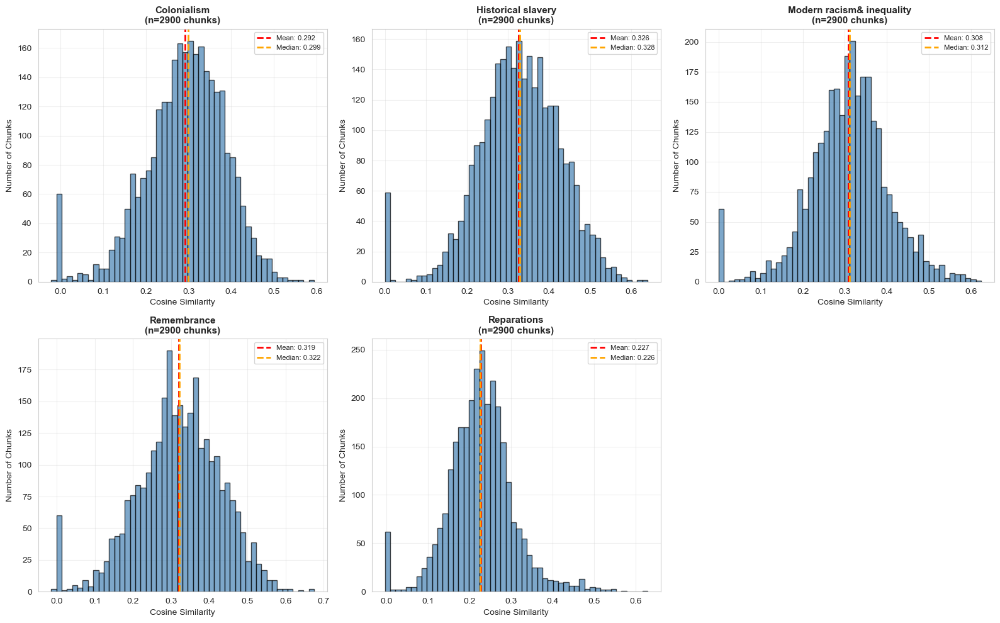

✓ Saved: viz_2_boxplot_comparison.png


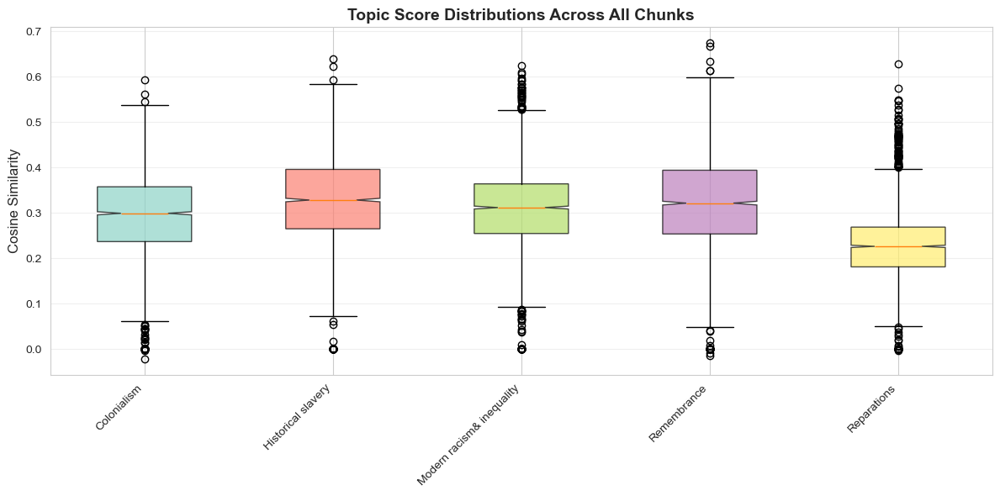

✓ Saved: viz_3_heatmap_top_chunks.png


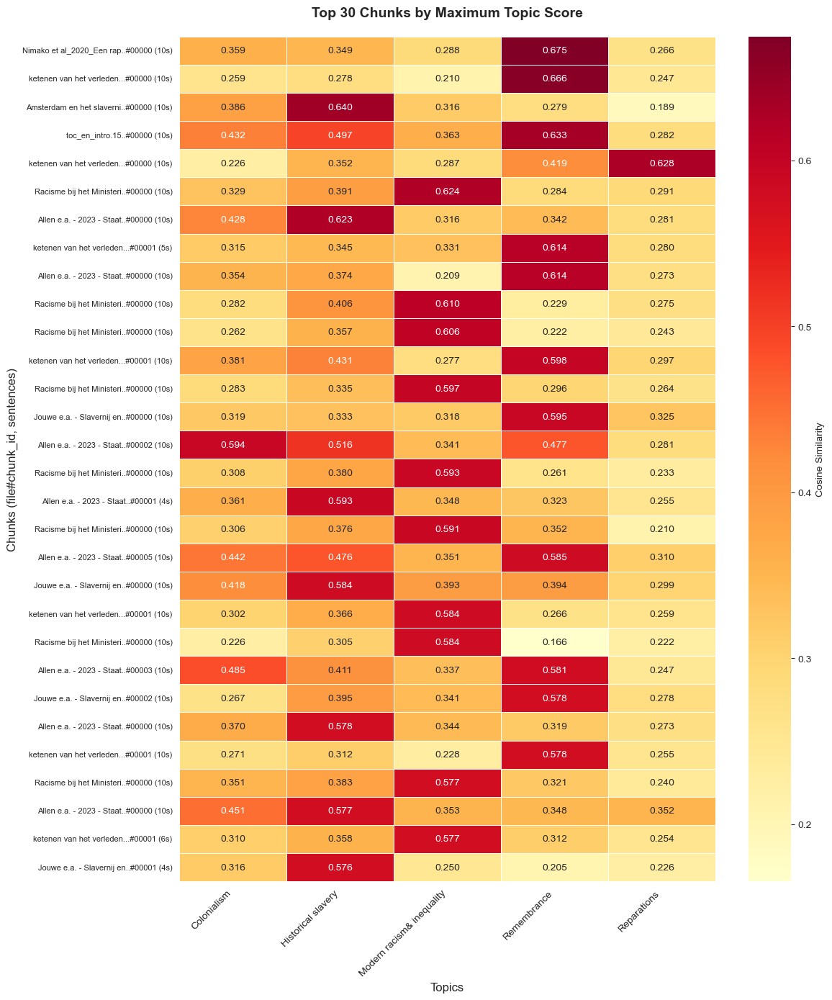

✓ Saved: viz_4_scatter_matrix.png


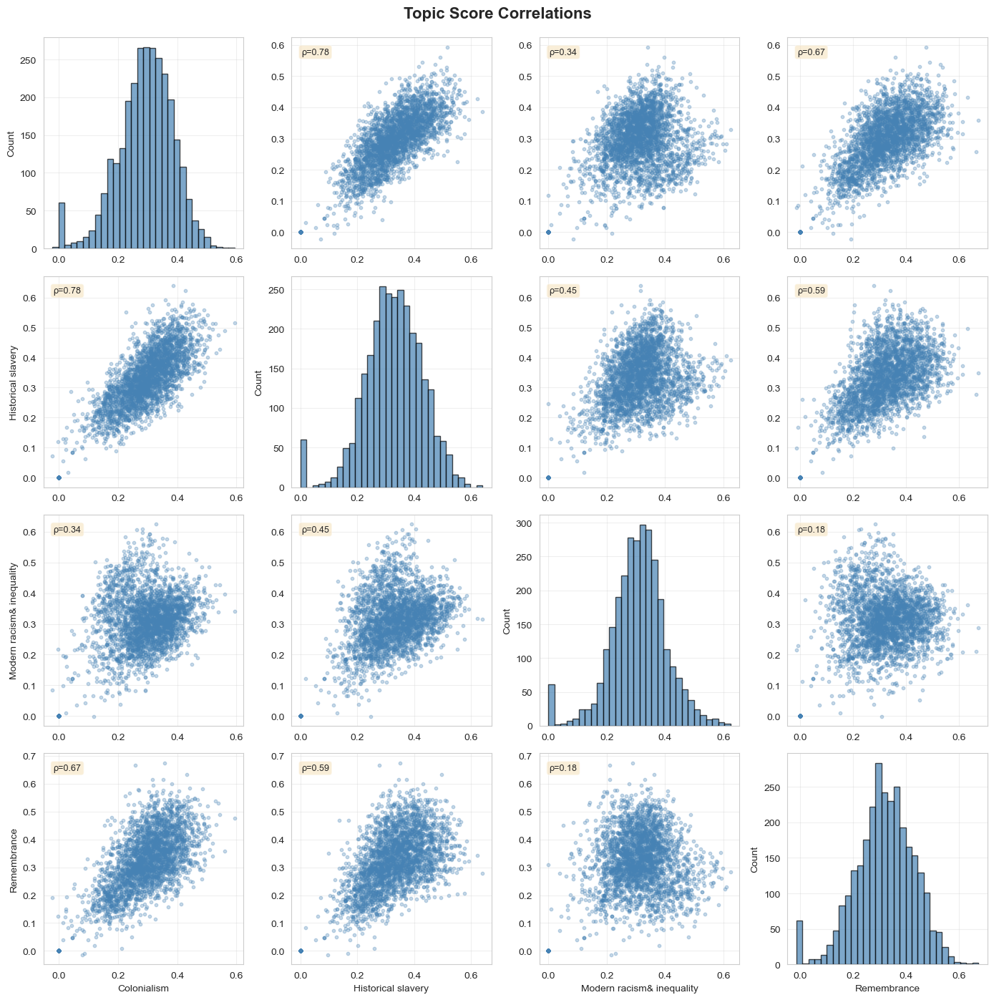


TOP 10 CHUNKS PER TOPIC

Colonialism:
  0.5936 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.451.txt [chunk: c0aee7eb:00002] (10 sentences)
  0.5609 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.452.txt [chunk: b79b973e:00001] (10 sentences)
  0.5444 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.465.txt [chunk: f2e5f4e4:00004] (10 sentences)
  0.5380 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.451.txt [chunk: c0aee7eb:00004] (10 sentences)
  0.5308 - Allen e.a. - 2023 - Staat en slavernij het Nederlandse koloniale slavernijverleden en zijn doorwerkingen.461.txt [chunk: e29b2b78:00002] (10 sentences)
  0.5280 - ketenen van het verleden.152.txt [chunk: ccb9b5e8:00002] (10 sentences)
  0.5199 - Allen e.a. - 2023 - Staat en slavernij het Nederland

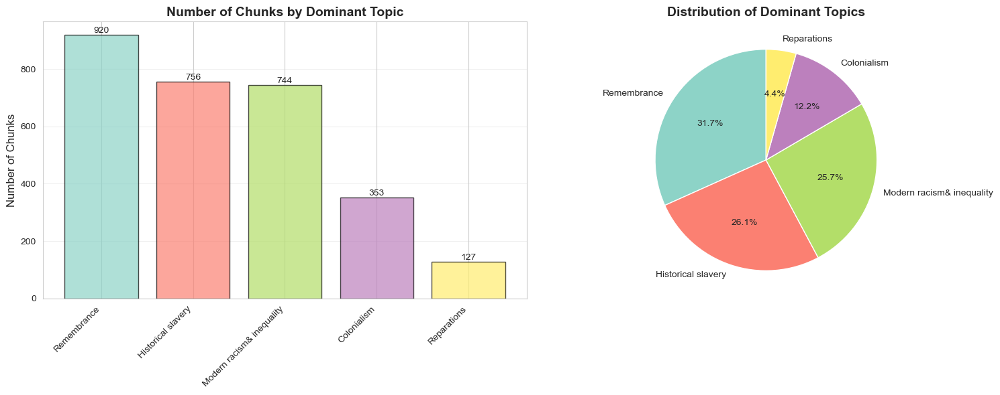


DOCUMENT-LEVEL AGGREGATION

Documents analyzed: 1378
Average chunks per document: 2.1
✓ Saved document aggregation → document_level_topic_scores.csv
✓ Saved: viz_6_document_dominant_topics.png


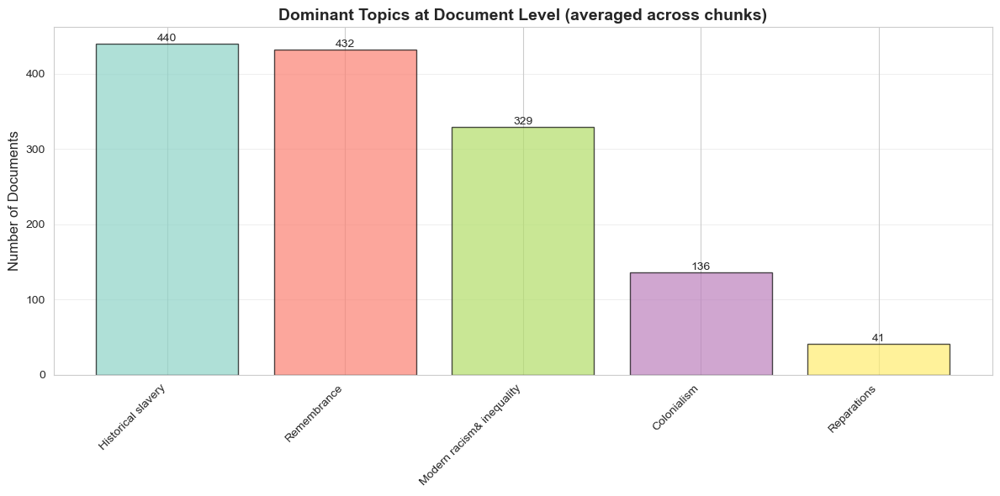

✓ Saved statistics → topic_score_statistics.csv

✓ ALL VISUALIZATIONS COMPLETED

Generated files in: C:\Users\Home\policy-analysis\dictionairy
  - viz_1_distributions.png
  - viz_2_boxplot_comparison.png
  - viz_3_heatmap_top_chunks.png
  - viz_4_scatter_matrix.png
  - viz_5_dominant_topics.png
  - viz_6_document_dominant_topics.png
  - top_chunks_per_topic.csv
  - document_level_topic_scores.csv
  - topic_score_statistics.csv


In [20]:
"""
Visualize chunk topic scores from the transformer-based scoring
Adapted for sentence-based chunking with chunk_id instead of filename
Creates multiple views: heatmaps, distributions, top chunks, scatter plots
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 10

# =========================
# 1) LOAD DATA
# =========================
OUT_DIR = Path(r"C:\Users\Home\policy-analysis\dictionairy")
SCORES_PATH = OUT_DIR / "xfmr_doc_topic_cosine_scores.csv"

print("Loading chunk scores...")
df = pd.read_csv(SCORES_PATH)

# Extract topic columns (those starting with "cos_")
topic_cols = [col for col in df.columns if col.startswith("cos_")]
topics = [col.replace("cos_", "") for col in topic_cols]

print(f"✓ Loaded {len(df)} chunks across {len(topics)} topics")
print(f"Topics: {', '.join(topics)}")

# Add short filename for display
df['short_filename'] = df['filename'].apply(lambda x: Path(x).name)

# Add display label combining filename and chunk info
df['display_label'] = df.apply(
    lambda row: f"{Path(row['filename']).stem}_{row['chunk_id'].split(':')[-1]}", 
    axis=1
)

# =========================
# 2) SUMMARY STATISTICS
# =========================
print("\n" + "="*60)
print("SUMMARY STATISTICS")
print("="*60)

for col in topic_cols:
    topic_name = col.replace("cos_", "")
    print(f"\n{topic_name}:")
    print(f"  Mean:   {df[col].mean():.4f}")
    print(f"  Median: {df[col].median():.4f}")
    print(f"  Std:    {df[col].std():.4f}")
    print(f"  Min:    {df[col].min():.4f}")
    print(f"  Max:    {df[col].max():.4f}")

# Additional chunk-specific stats
print(f"\n{'='*60}")
print(f"CHUNK STATISTICS")
print(f"{'='*60}")
print(f"Total chunks: {len(df)}")
print(f"Unique documents: {df['filename'].nunique()}")
if 'sentence_count' in df.columns:
    print(f"Average sentences per chunk: {df['sentence_count'].mean():.1f}")
    print(f"Min sentences: {df['sentence_count'].min()}")
    print(f"Max sentences: {df['sentence_count'].max()}")

# Count chunks with empty text_for_scoring
if 'text_for_scoring' in df.columns:
    empty_chunks = (df['text_for_scoring'] == '').sum()
    print(f"Chunks with empty text_for_scoring: {empty_chunks} ({100*empty_chunks/len(df):.1f}%)")

# =========================
# 3) VISUALIZATION 1: Distribution Plot
# =========================
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, col in enumerate(topic_cols):
    if idx < len(axes):
        topic_name = col.replace("cos_", "")
        axes[idx].hist(df[col], bins=50, color='steelblue', alpha=0.7, edgecolor='black')
        axes[idx].axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df[col].mean():.3f}')
        axes[idx].axvline(df[col].median(), color='orange', linestyle='--', linewidth=2, label=f'Median: {df[col].median():.3f}')
        axes[idx].set_xlabel('Cosine Similarity')
        axes[idx].set_ylabel('Number of Chunks')
        axes[idx].set_title(f'{topic_name}\n(n={len(df)} chunks)', fontsize=11, fontweight='bold')
        axes[idx].legend(fontsize=8)
        axes[idx].grid(alpha=0.3)

# Hide extra subplots if fewer than 6 topics
for idx in range(len(topic_cols), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig(OUT_DIR / "viz_1_distributions.png", dpi=300, bbox_inches='tight')
print(f"\n✓ Saved: viz_1_distributions.png")
plt.show()

# =========================
# 4) VISUALIZATION 2: Box Plot Comparison
# =========================
fig, ax = plt.subplots(figsize=(12, 6))

# Prepare data for box plot
plot_data = []
plot_labels = []
for col in topic_cols:
    plot_data.append(df[col].values)
    plot_labels.append(col.replace("cos_", ""))

bp = ax.boxplot(plot_data, labels=plot_labels, patch_artist=True, notch=True)

# Color the boxes
colors = plt.cm.Set3(np.linspace(0, 1, len(topics)))
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

ax.set_ylabel('Cosine Similarity', fontsize=12)
ax.set_title('Topic Score Distributions Across All Chunks', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(OUT_DIR / "viz_2_boxplot_comparison.png", dpi=300, bbox_inches='tight')
print(f"✓ Saved: viz_2_boxplot_comparison.png")
plt.show()

# =========================
# 5) VISUALIZATION 3: Heatmap of Top Chunks
# =========================
# Show top 30 chunks based on max score across any topic
df['max_score'] = df[topic_cols].max(axis=1)
top_chunks = df.nlargest(30, 'max_score')

# Create heatmap data
heatmap_data = top_chunks[topic_cols].values

# Create shorter labels for chunks
short_labels = []
for idx, row in top_chunks.iterrows():
    label = f"{Path(row['filename']).stem[:25]}..#{row['chunk_id'].split(':')[-1]}"
    if 'sentence_count' in row:
        label += f" ({int(row['sentence_count'])}s)"
    short_labels.append(label)

fig, ax = plt.subplots(figsize=(12, 14))
sns.heatmap(heatmap_data, 
            xticklabels=[t.replace("cos_", "") for t in topic_cols],
            yticklabels=short_labels,
            cmap='YlOrRd',
            annot=True,
            fmt='.3f',
            cbar_kws={'label': 'Cosine Similarity'},
            linewidths=0.5,
            ax=ax)

ax.set_title('Top 30 Chunks by Maximum Topic Score', fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Topics', fontsize=12)
ax.set_ylabel('Chunks (file#chunk_id, sentences)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.savefig(OUT_DIR / "viz_3_heatmap_top_chunks.png", dpi=300, bbox_inches='tight')
print(f"✓ Saved: viz_3_heatmap_top_chunks.png")
plt.show()

# =========================
# 6) VISUALIZATION 4: Scatter Plot Matrix
# =========================
if len(topics) >= 2:
    # Create scatter plots for first 4 topics (or fewer if less available)
    n_topics_to_plot = min(4, len(topics))
    fig, axes = plt.subplots(n_topics_to_plot, n_topics_to_plot, figsize=(14, 14))
    
    if n_topics_to_plot == 1:
        axes = np.array([[axes]])
    elif n_topics_to_plot == 2:
        axes = axes.reshape(2, 2)
    
    for i in range(n_topics_to_plot):
        for j in range(n_topics_to_plot):
            if i == j:
                # Diagonal: histogram
                axes[i, j].hist(df[topic_cols[i]], bins=30, color='steelblue', alpha=0.7, edgecolor='black')
                axes[i, j].set_ylabel('Count')
                if i == n_topics_to_plot - 1:
                    axes[i, j].set_xlabel(topics[i])
            else:
                # Off-diagonal: scatter plot
                axes[i, j].scatter(df[topic_cols[j]], df[topic_cols[i]], 
                                  alpha=0.3, s=10, color='steelblue')
                axes[i, j].set_xlabel(topics[j] if i == n_topics_to_plot - 1 else '')
                axes[i, j].set_ylabel(topics[i] if j == 0 else '')
                
                # Add correlation coefficient
                corr = df[topic_cols[i]].corr(df[topic_cols[j]])
                axes[i, j].text(0.05, 0.95, f'ρ={corr:.2f}', 
                               transform=axes[i, j].transAxes,
                               fontsize=9, verticalalignment='top',
                               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            
            axes[i, j].grid(alpha=0.3)
    
    plt.suptitle('Topic Score Correlations', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(OUT_DIR / "viz_4_scatter_matrix.png", dpi=300, bbox_inches='tight')
    print(f"✓ Saved: viz_4_scatter_matrix.png")
    plt.show()

# =========================
# 7) EXPORT: Top Chunks per Topic
# =========================
print("\n" + "="*60)
print("TOP 10 CHUNKS PER TOPIC")
print("="*60)

top_chunks_report = []
for col in topic_cols:
    topic_name = col.replace("cos_", "")
    print(f"\n{topic_name}:")
    
    cols_to_keep = ['filename', 'chunk_id', col]
    if 'sentence_count' in df.columns:
        cols_to_keep.append('sentence_count')
    
    top = df.nlargest(10, col)[cols_to_keep].copy()
    top['topic'] = topic_name
    top.rename(columns={col: 'score'}, inplace=True)
    
    for idx, row in top.iterrows():
        display = f"{row['score']:.4f} - {Path(row['filename']).name} [chunk: {row['chunk_id']}]"
        if 'sentence_count' in row:
            display += f" ({int(row['sentence_count'])} sentences)"
        print(f"  {display}")
        top_chunks_report.append(row)

# Save report
report_df = pd.DataFrame(top_chunks_report)
report_path = OUT_DIR / "top_chunks_per_topic.csv"
report_df.to_csv(report_path, index=False, encoding='utf-8-sig')
print(f"\n✓ Saved detailed report → {report_path.name}")

# =========================
# 8) VISUALIZATION 5: Dominant Topic per Chunk
# =========================
# Find which topic has highest score for each chunk
df['dominant_topic'] = df[topic_cols].idxmax(axis=1).str.replace('cos_', '')
df['dominant_score'] = df[topic_cols].max(axis=1)

# Count chunks per dominant topic
topic_counts = df['dominant_topic'].value_counts()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart
colors = plt.cm.Set3(np.linspace(0, 1, len(topic_counts)))
bars = ax1.bar(range(len(topic_counts)), topic_counts.values, color=colors, alpha=0.7, edgecolor='black')
ax1.set_xticks(range(len(topic_counts)))
ax1.set_xticklabels(topic_counts.index, rotation=45, ha='right')
ax1.set_ylabel('Number of Chunks', fontsize=12)
ax1.set_title('Number of Chunks by Dominant Topic', fontsize=14, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=10)

# Pie chart
ax2.pie(topic_counts.values, labels=topic_counts.index, autopct='%1.1f%%',
        colors=colors, startangle=90)
ax2.set_title('Distribution of Dominant Topics', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(OUT_DIR / "viz_5_dominant_topics.png", dpi=300, bbox_inches='tight')
print(f"✓ Saved: viz_5_dominant_topics.png")
plt.show()

# =========================
# 9) VISUALIZATION 6: Per-Document Topic Aggregation
# =========================
# Aggregate chunks by document to see document-level patterns
print("\n" + "="*60)
print("DOCUMENT-LEVEL AGGREGATION")
print("="*60)

doc_aggregated = df.groupby('filename').agg({
    **{col: 'mean' for col in topic_cols},  # Average topic scores
    'chunk_id': 'count',  # Number of chunks
})
doc_aggregated.rename(columns={'chunk_id': 'num_chunks'}, inplace=True)

# Find dominant topic per document
doc_aggregated['dominant_topic'] = doc_aggregated[topic_cols].idxmax(axis=1).str.replace('cos_', '')
doc_aggregated['dominant_score'] = doc_aggregated[topic_cols].max(axis=1)

print(f"\nDocuments analyzed: {len(doc_aggregated)}")
print(f"Average chunks per document: {doc_aggregated['num_chunks'].mean():.1f}")

# Save document-level summary
doc_agg_path = OUT_DIR / "document_level_topic_scores.csv"
doc_aggregated.to_csv(doc_agg_path, encoding='utf-8-sig')
print(f"✓ Saved document aggregation → {doc_agg_path.name}")

# Visualize document-level dominant topics
doc_topic_counts = doc_aggregated['dominant_topic'].value_counts()

fig, ax = plt.subplots(figsize=(12, 6))
colors = plt.cm.Set3(np.linspace(0, 1, len(doc_topic_counts)))
bars = ax.bar(range(len(doc_topic_counts)), doc_topic_counts.values, color=colors, alpha=0.7, edgecolor='black')
ax.set_xticks(range(len(doc_topic_counts)))
ax.set_xticklabels(doc_topic_counts.index, rotation=45, ha='right')
ax.set_ylabel('Number of Documents', fontsize=12)
ax.set_title('Dominant Topics at Document Level (averaged across chunks)', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig(OUT_DIR / "viz_6_document_dominant_topics.png", dpi=300, bbox_inches='tight')
print(f"✓ Saved: viz_6_document_dominant_topics.png")
plt.show()

# =========================
# 10) SUMMARY STATISTICS EXPORT
# =========================
summary_stats = []
for col in topic_cols:
    topic_name = col.replace("cos_", "")
    summary_stats.append({
        'topic': topic_name,
        'mean': df[col].mean(),
        'median': df[col].median(),
        'std': df[col].std(),
        'min': df[col].min(),
        'max': df[col].max(),
        'q25': df[col].quantile(0.25),
        'q75': df[col].quantile(0.75),
        'n_chunks': len(df),
        'n_high_score': (df[col] > 0.7).sum(),  # chunks with score > 0.7
        'pct_high_score': 100 * (df[col] > 0.7).sum() / len(df),
    })

summary_df = pd.DataFrame(summary_stats)
summary_path = OUT_DIR / "topic_score_statistics.csv"
summary_df.to_csv(summary_path, index=False, encoding='utf-8-sig')
print(f"✓ Saved statistics → {summary_path.name}")

print("\n" + "="*60)
print("✓ ALL VISUALIZATIONS COMPLETED")
print("="*60)
print(f"\nGenerated files in: {OUT_DIR}")
print("  - viz_1_distributions.png")
print("  - viz_2_boxplot_comparison.png")
print("  - viz_3_heatmap_top_chunks.png")
print("  - viz_4_scatter_matrix.png")
print("  - viz_5_dominant_topics.png")
print("  - viz_6_document_dominant_topics.png")
print("  - top_chunks_per_topic.csv")
print("  - document_level_topic_scores.csv")
print("  - topic_score_statistics.csv")

In [25]:
"""
Clustering analysis per topic
Shows clusters of similar chunks within each topic using:
- K-means clustering
- Interactive visualizations with tooltips
- Cluster statistics and exports
"""

import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from pathlib import Path
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# =========================
# 1) LOAD DATA
# =========================
OUT_DIR = Path(r"C:\Users\Home\policy-analysis\dictionairy")
SCORES_PATH = OUT_DIR / "xfmr_doc_topic_cosine_scores.csv"

print("Loading chunk scores...")
df = pd.read_csv(SCORES_PATH)

# Extract topic columns
topic_cols = [col for col in df.columns if col.startswith("cos_")]
topics = [col.replace("cos_", "") for col in topic_cols]

print(f"✓ Loaded {len(df)} chunks across {len(topics)} topics")

# =========================
# 2) CONFIGURATION
# =========================
N_CLUSTERS = 5  # Number of clusters per topic
MIN_SCORE_THRESHOLD = 0.3  # Only cluster chunks with score > this for each topic

# =========================
# 3) CLUSTERING PER TOPIC
# =========================
print("\n" + "="*60)
print("PERFORMING CLUSTERING PER TOPIC")
print("="*60)

clustering_results = {}

for topic_col in topic_cols:
    topic_name = topic_col.replace("cos_", "")
    print(f"\nProcessing: {topic_name}")
    
    # Filter chunks with sufficient score for this topic
    topic_df = df[df[topic_col] > MIN_SCORE_THRESHOLD].copy()
    
    if len(topic_df) < N_CLUSTERS:
        print(f"  ⚠ Only {len(topic_df)} chunks above threshold, skipping clustering")
        continue
    
    # Prepare features: all topic scores for these chunks
    X = topic_df[topic_cols].values
    
    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Perform K-means clustering
    n_clusters = min(N_CLUSTERS, len(topic_df))
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # Perform PCA for visualization (2D)
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)
    
    # Store results
    topic_df['cluster'] = cluster_labels
    topic_df['pca_x'] = X_pca[:, 0]
    topic_df['pca_y'] = X_pca[:, 1]
    topic_df['primary_score'] = topic_df[topic_col]
    
    # Add snippet
    if 'raw_text' in topic_df.columns:
        topic_df['snippet'] = topic_df['raw_text'].apply(
            lambda x: (str(x)[:200] + '...') if pd.notna(x) and len(str(x)) > 200 else str(x) if pd.notna(x) else ''
        )
    else:
        topic_df['snippet'] = ''
    
    clustering_results[topic_name] = {
        'data': topic_df,
        'kmeans': kmeans,
        'pca': pca,
        'scaler': scaler,
        'n_clusters': n_clusters,
        'explained_variance': pca.explained_variance_ratio_
    }
    
    print(f"  ✓ Clustered {len(topic_df)} chunks into {n_clusters} clusters")
    print(f"  PCA explained variance: {pca.explained_variance_ratio_.sum():.2%}")

# =========================
# 4) VISUALIZATION: INTERACTIVE SCATTER PER TOPIC
# =========================
print("\n" + "="*60)
print("CREATING VISUALIZATIONS")
print("="*60)

n_topics = len(clustering_results)
if n_topics == 0:
    print("⚠ No topics had enough chunks to cluster")
else:
    n_cols = 2
    n_rows = (n_topics + n_cols - 1) // n_cols
    
    fig = make_subplots(
        rows=n_rows, 
        cols=n_cols,
        subplot_titles=list(clustering_results.keys()),
        vertical_spacing=0.10,
        horizontal_spacing=0.10
    )
    
    color_scale = px.colors.qualitative.Set3
    
    for i, (topic_name, results) in enumerate(clustering_results.items()):
        row = i // n_cols + 1
        col = i % n_cols + 1
        
        topic_df = results['data']
        
        # Create hover text dictionary indexed by original dataframe index
        hover_texts = {}
        for idx, r in topic_df.iterrows():
            hover = (
                f"<b>File:</b> {Path(r['filename']).name}<br>"
                f"<b>Chunk:</b> {r['chunk_id']}<br>"
                f"<b>Cluster:</b> {r['cluster']}<br>"
                f"<b>Score:</b> {r['primary_score']:.4f}<br>"
                f"<br><b>Text:</b><br>{r['snippet'][:150]}"
            )
            hover_texts[idx] = hover
        
        # Plot each cluster with different color
        for cluster_id in sorted(topic_df['cluster'].unique()):
            cluster_data = topic_df[topic_df['cluster'] == cluster_id]
            cluster_hover = [hover_texts[idx] for idx in cluster_data.index]
            
            fig.add_trace(
                go.Scatter(
                    x=cluster_data['pca_x'],
                    y=cluster_data['pca_y'],
                    mode='markers',
                    marker=dict(
                        size=8,
                        color=color_scale[cluster_id % len(color_scale)],
                        opacity=0.7,
                        line=dict(width=0.5, color='white')
                    ),
                    name=f'C{cluster_id}',
                    hovertemplate='%{hovertext}<extra></extra>',
                    hovertext=cluster_hover,
                    showlegend=(i == 0),  # Only show legend for first subplot
                    legendgroup=f'cluster_{cluster_id}'
                ),
                row=row,
                col=col
            )
        
        # Add cluster centers
        centers_pca = results['pca'].transform(results['scaler'].transform(results['kmeans'].cluster_centers_))
        fig.add_trace(
            go.Scatter(
                x=centers_pca[:, 0],
                y=centers_pca[:, 1],
                mode='markers',
                marker=dict(
                    size=15,
                    color='red',
                    symbol='x',
                    line=dict(width=2, color='darkred')
                ),
                name='Centers',
                showlegend=(i == 0),
                legendgroup='centers',
                hoverinfo='skip'
            ),
            row=row,
            col=col
        )
    
    fig.update_layout(
        title_text=f'Topic Clustering (K-means, k={N_CLUSTERS})<br><sub>PCA 2D projection | Min score threshold: {MIN_SCORE_THRESHOLD}</sub>',
        height=400 * n_rows,
        width=1400,
        template='plotly_white',
        hovermode='closest'
    )
    
    fig.update_xaxes(title_text='PCA Component 1', showgrid=True)
    fig.update_yaxes(title_text='PCA Component 2', showgrid=True)
    
    output_html = OUT_DIR / "viz_topic_clustering.html"
    fig.write_html(output_html)
    print(f"✓ Saved clustering visualization → {output_html.name}")
    
    try:
        fig.show()
    except:
        pass

# =========================
# 5) CLUSTER STATISTICS
# =========================
print("\n" + "="*60)
print("CLUSTER STATISTICS")
print("="*60)

cluster_stats_all = []

for topic_name, results in clustering_results.items():
    topic_df = results['data']
    
    print(f"\n{topic_name}:")
    print(f"  Total chunks in clusters: {len(topic_df)}")
    
    for cluster_id in sorted(topic_df['cluster'].unique()):
        cluster_data = topic_df[topic_df['cluster'] == cluster_id]
        
        # Calculate statistics
        stats = {
            'topic': topic_name,
            'cluster_id': cluster_id,
            'n_chunks': len(cluster_data),
            'avg_score': cluster_data['primary_score'].mean(),
            'min_score': cluster_data['primary_score'].min(),
            'max_score': cluster_data['primary_score'].max(),
            'std_score': cluster_data['primary_score'].std(),
        }
        
        # Add average scores for all topics in this cluster
        for tc in topic_cols:
            stats[f'avg_{tc}'] = cluster_data[tc].mean()
        
        cluster_stats_all.append(stats)
        
        print(f"  Cluster {cluster_id}: {len(cluster_data)} chunks, "
              f"avg_score={stats['avg_score']:.3f}, "
              f"range=[{stats['min_score']:.3f}, {stats['max_score']:.3f}]")

# Save cluster statistics
stats_df = pd.DataFrame(cluster_stats_all)
stats_path = OUT_DIR / "cluster_statistics.csv"
stats_df.to_csv(stats_path, index=False, encoding='utf-8-sig')
print(f"\n✓ Saved cluster statistics → {stats_path.name}")

# =========================
# 6) EXPORT CLUSTERED CHUNKS
# =========================
print("\n" + "="*60)
print("EXPORTING CLUSTERED CHUNKS")
print("="*60)

for topic_name, results in clustering_results.items():
    topic_df = results['data'].copy()
    
    # Select relevant columns
    export_cols = ['filename', 'chunk_id', 'cluster', 'primary_score']
    if 'sentence_count' in topic_df.columns:
        export_cols.append('sentence_count')
    if 'raw_text' in topic_df.columns:
        export_cols.append('raw_text')
    
    # Add all topic scores
    export_cols.extend(topic_cols)
    
    topic_export = topic_df[export_cols].copy()
    topic_export = topic_export.sort_values(['cluster', 'primary_score'], ascending=[True, False])
    
    # Save
    export_path = OUT_DIR / f"clustered_{topic_name.replace(' ', '_')}.csv"
    topic_export.to_csv(export_path, index=False, encoding='utf-8-sig')
    print(f"  ✓ {topic_name}: {len(topic_export)} chunks → {export_path.name}")

# =========================
# 7) TOP CHUNKS PER CLUSTER
# =========================
print("\n" + "="*60)
print("TOP 3 CHUNKS PER CLUSTER (by score)")
print("="*60)

for topic_name, results in clustering_results.items():
    topic_df = results['data']
    
    print(f"\n{topic_name}:")
    
    for cluster_id in sorted(topic_df['cluster'].unique()):
        cluster_data = topic_df[topic_df['cluster'] == cluster_id]
        top_chunks = cluster_data.nlargest(3, 'primary_score')
        
        print(f"\n  Cluster {cluster_id} (n={len(cluster_data)}):")
        for idx, row in top_chunks.iterrows():
            snippet = row.get('snippet', '')[:100]
            print(f"    {row['primary_score']:.4f} - {Path(row['filename']).name}")
            print(f"      → {snippet}...")

# =========================
# 8) ALTERNATIVE: 3D VISUALIZATION
# =========================
print("\n" + "="*60)
print("CREATING 3D VISUALIZATIONS")
print("="*60)

for topic_name, results in clustering_results.items():
    topic_df = results['data']
    
    # Use PCA with 3 components for 3D viz
    if len(topic_df) < 3:
        continue
        
    pca_3d = PCA(n_components=3, random_state=42)
    X_scaled = results['scaler'].transform(topic_df[topic_cols].values)
    X_pca_3d = pca_3d.fit_transform(X_scaled)
    
    # Create hover text dictionary indexed by original dataframe index
    hover_texts = {}
    for idx, r in topic_df.iterrows():
        hover = (
            f"<b>File:</b> {Path(r['filename']).name}<br>"
            f"<b>Cluster:</b> {r['cluster']}<br>"
            f"<b>Score:</b> {r['primary_score']:.4f}<br>"
            f"<b>Text:</b> {r.get('snippet', '')[:100]}"
        )
        hover_texts[idx] = hover
    
    fig_3d = go.Figure()
    
    for cluster_id in sorted(topic_df['cluster'].unique()):
        cluster_mask = topic_df['cluster'] == cluster_id
        cluster_data = topic_df[cluster_mask]
        cluster_hover = [hover_texts[idx] for idx in cluster_data.index]
        
        fig_3d.add_trace(go.Scatter3d(
            x=X_pca_3d[cluster_mask, 0],
            y=X_pca_3d[cluster_mask, 1],
            z=X_pca_3d[cluster_mask, 2],
            mode='markers',
            marker=dict(
                size=5,
                color=color_scale[cluster_id % len(color_scale)],
                opacity=0.8
            ),
            name=f'Cluster {cluster_id}',
            hovertemplate='%{hovertext}<extra></extra>',
            hovertext=cluster_hover
        ))
    
    fig_3d.update_layout(
        title=f'{topic_name} - 3D Clustering View',
        scene=dict(
            xaxis_title='PCA 1',
            yaxis_title='PCA 2',
            zaxis_title='PCA 3'
        ),
        width=1000,
        height=800
    )
    
    output_3d = OUT_DIR / f"viz_3d_cluster_{topic_name.replace(' ', '_')}.html"
    fig_3d.write_html(output_3d)
    print(f"  ✓ {topic_name} 3D → {output_3d.name}")

print("\n" + "="*60)
print("✓ CLUSTERING ANALYSIS COMPLETED")
print("="*60)
print(f"\nGenerated files:")
print(f"  - viz_topic_clustering.html (2D clustering by topic)")
print(f"  - viz_3d_cluster_*.html (3D views per topic)")
print(f"  - clustered_*.csv (chunks with cluster assignments)")
print(f"  - cluster_statistics.csv (cluster metrics)")

Loading chunk scores...
✓ Loaded 2900 chunks across 5 topics

PERFORMING CLUSTERING PER TOPIC

Processing: Colonialism
  ✓ Clustered 1440 chunks into 5 clusters
  PCA explained variance: 58.37%

Processing: Historical slavery
  ✓ Clustered 1783 chunks into 5 clusters
  PCA explained variance: 57.88%

Processing: Modern racism& inequality
  ✓ Clustered 1629 chunks into 5 clusters
  PCA explained variance: 71.76%

Processing: Remembrance
  ✓ Clustered 1675 chunks into 5 clusters
  PCA explained variance: 63.05%

Processing: Reparations
  ✓ Clustered 380 chunks into 5 clusters
  PCA explained variance: 68.45%

CREATING VISUALIZATIONS
✓ Saved clustering visualization → viz_topic_clustering.html



CLUSTER STATISTICS

Colonialism:
  Total chunks in clusters: 1440
  Cluster 0: 307 chunks, avg_score=0.431, range=[0.359, 0.594]
  Cluster 1: 138 chunks, avg_score=0.340, range=[0.300, 0.440]
  Cluster 2: 301 chunks, avg_score=0.344, range=[0.300, 0.424]
  Cluster 3: 370 chunks, avg_score=0.343, range=[0.300, 0.456]
  Cluster 4: 324 chunks, avg_score=0.360, range=[0.301, 0.479]

Historical slavery:
  Total chunks in clusters: 1783
  Cluster 0: 190 chunks, avg_score=0.386, range=[0.304, 0.516]
  Cluster 1: 230 chunks, avg_score=0.344, range=[0.300, 0.471]
  Cluster 2: 488 chunks, avg_score=0.363, range=[0.300, 0.551]
  Cluster 3: 431 chunks, avg_score=0.466, range=[0.355, 0.640]
  Cluster 4: 444 chunks, avg_score=0.366, range=[0.300, 0.492]

Modern racism& inequality:
  Total chunks in clusters: 1629
  Cluster 0: 475 chunks, avg_score=0.362, range=[0.300, 0.508]
  Cluster 1: 279 chunks, avg_score=0.368, range=[0.301, 0.501]
  Cluster 2: 481 chunks, avg_score=0.339, range=[0.300, 0.431]

Loading chunk scores...
✓ Loaded 2900 chunks across 5 topics

Standardizing features...
Performing PCA...
✓ PCA completed
  Explained variance (first 3 components): 89.60%

K-MEANS CLUSTERING
✓ Saved: clustering_1_elbow_method.png


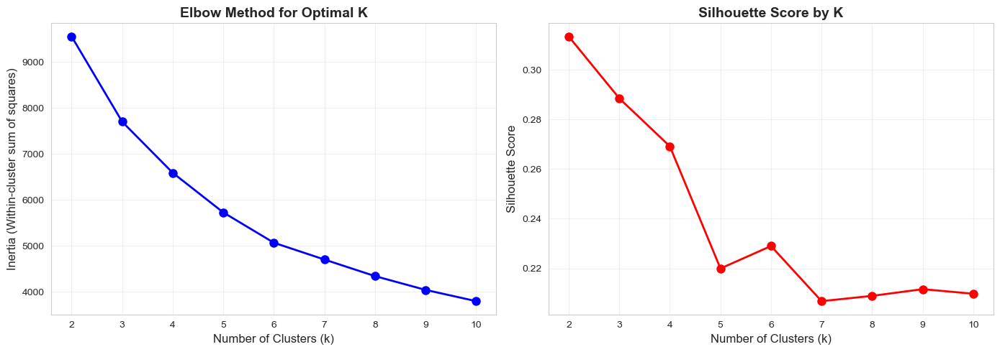


✓ Optimal K (by silhouette): 2

Cluster sizes:
  Cluster 0: 1926 chunks (66.4%)
  Cluster 1: 974 chunks (33.6%)

HIERARCHICAL CLUSTERING
✓ Hierarchical clustering completed with 2 clusters

DBSCAN CLUSTERING
✓ DBSCAN completed
  Clusters found: 4
  Noise points: 127 (4.4%)

CREATING INTERACTIVE VISUALIZATIONS
✓ Saved: clustering_2_interactive_3d_pca.html


✓ Saved: clustering_3_comparison_2d_pca.png


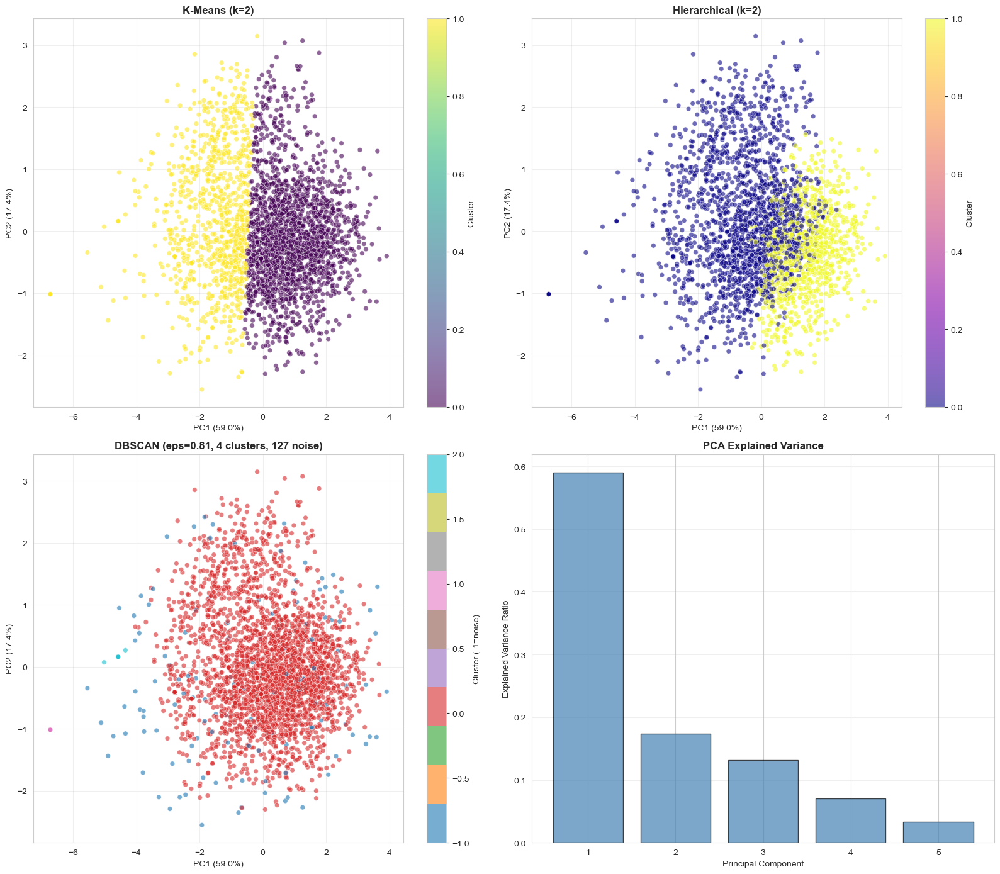


CLUSTER CHARACTERISTICS (K-Means)

--- Cluster 0 (1926 chunks) ---
  Colonialism: 0.337
  Historical slavery: 0.378
  Modern racism& inequality: 0.330
  Remembrance: 0.369
  Reparations: 0.255
  → Dominant topic: Historical slavery

--- Cluster 1 (974 chunks) ---
  Colonialism: 0.202
  Historical slavery: 0.225
  Modern racism& inequality: 0.264
  Remembrance: 0.221
  Reparations: 0.171
  → Dominant topic: Modern racism& inequality

✓ Saved cluster profiles → cluster_profiles.csv

Creating cluster profile heatmap...
✓ Saved: clustering_4_profile_heatmap.png


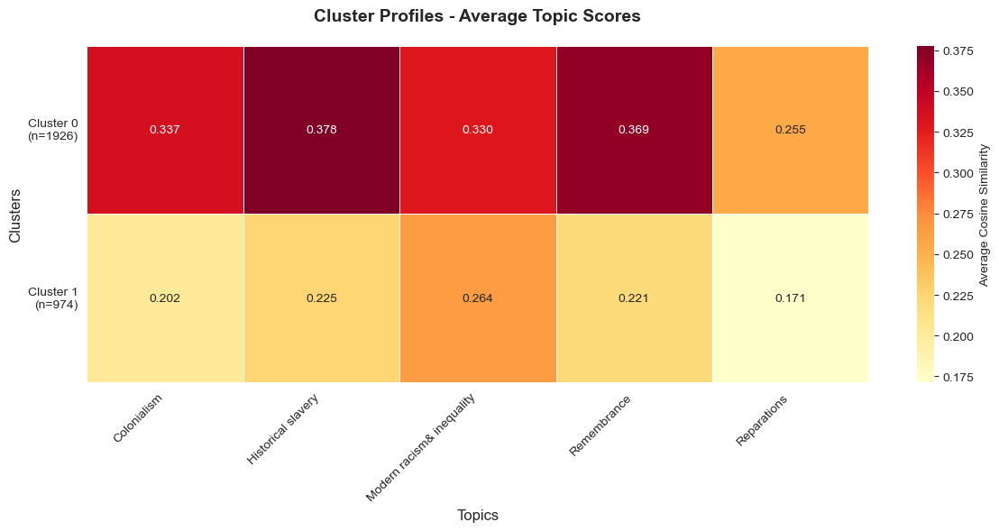


✓ Saved clustered data → chunks_with_clusters.csv

✓ CLUSTERING ANALYSIS COMPLETED

Generated files:
  - clustering_1_elbow_method.png
  - clustering_2_interactive_3d_pca.html (open in browser!)
  - clustering_3_comparison_2d_pca.png
  - clustering_4_profile_heatmap.png
  - cluster_profiles.csv
  - chunks_with_clusters.csv

Optimal number of clusters: 2
Silhouette score: 0.313


In [23]:
"""
Clustering analysis on chunk topic scores
Uses multiple clustering algorithms and creates interactive visualizations
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.graph_objects as go
import plotly.express as px

# =========================
# 1) LOAD DATA
# =========================
OUT_DIR = Path(r"C:\Users\Home\policy-analysis\dictionairy")
SCORES_PATH = OUT_DIR / "xfmr_doc_topic_cosine_scores.csv"

print("Loading chunk scores...")
df = pd.read_csv(SCORES_PATH)

# Extract topic columns
topic_cols = [col for col in df.columns if col.startswith("cos_")]
topics = [col.replace("cos_", "") for col in topic_cols]

print(f"✓ Loaded {len(df)} chunks across {len(topics)} topics")

# Extract feature matrix (topic scores only)
X = df[topic_cols].values

# Add short labels
df['short_filename'] = df['filename'].apply(lambda x: Path(x).name)
df['display_label'] = df.apply(
    lambda row: f"{Path(row['filename']).stem[:20]}_{row['chunk_id'].split(':')[-1]}", 
    axis=1
)

# Create text snippets for hover
df['snippet'] = df.get('raw_text', '').fillna('').str[:150] + '...'

# =========================
# 2) STANDARDIZE DATA
# =========================
print("\nStandardizing features...")
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# =========================
# 3) DIMENSIONALITY REDUCTION (PCA)
# =========================
print("Performing PCA...")
pca = PCA(n_components=min(10, len(topic_cols)))
X_pca = pca.fit_transform(X_scaled)

print(f"✓ PCA completed")
print(f"  Explained variance (first 3 components): {pca.explained_variance_ratio_[:3].sum():.2%}")

# =========================
# 4) K-MEANS CLUSTERING
# =========================
print("\n" + "="*60)
print("K-MEANS CLUSTERING")
print("="*60)

# Elbow method to find optimal k
inertias = []
silhouettes = []
K_range = range(2, min(11, len(df)//10))

from sklearn.metrics import silhouette_score

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)
    silhouettes.append(silhouette_score(X_scaled, kmeans.labels_))

# Plot elbow curve
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(K_range, inertias, 'bo-', linewidth=2, markersize=8)
ax1.set_xlabel('Number of Clusters (k)', fontsize=12)
ax1.set_ylabel('Inertia (Within-cluster sum of squares)', fontsize=12)
ax1.set_title('Elbow Method for Optimal K', fontsize=14, fontweight='bold')
ax1.grid(alpha=0.3)

ax2.plot(K_range, silhouettes, 'ro-', linewidth=2, markersize=8)
ax2.set_xlabel('Number of Clusters (k)', fontsize=12)
ax2.set_ylabel('Silhouette Score', fontsize=12)
ax2.set_title('Silhouette Score by K', fontsize=14, fontweight='bold')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(OUT_DIR / "clustering_1_elbow_method.png", dpi=300, bbox_inches='tight')
print(f"✓ Saved: clustering_1_elbow_method.png")
plt.show()

# Choose optimal k (highest silhouette)
optimal_k = K_range[np.argmax(silhouettes)]
print(f"\n✓ Optimal K (by silhouette): {optimal_k}")

# Fit final K-means
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df['kmeans_cluster'] = kmeans.fit_predict(X_scaled)

print(f"\nCluster sizes:")
for i in range(optimal_k):
    count = (df['kmeans_cluster'] == i).sum()
    print(f"  Cluster {i}: {count} chunks ({100*count/len(df):.1f}%)")

# =========================
# 5) HIERARCHICAL CLUSTERING
# =========================
print("\n" + "="*60)
print("HIERARCHICAL CLUSTERING")
print("="*60)

agg = AgglomerativeClustering(n_clusters=optimal_k, linkage='ward')
df['hierarchical_cluster'] = agg.fit_predict(X_scaled)

print(f"✓ Hierarchical clustering completed with {optimal_k} clusters")

# =========================
# 6) DBSCAN CLUSTERING
# =========================
print("\n" + "="*60)
print("DBSCAN CLUSTERING")
print("="*60)

# Try DBSCAN with different eps values
from sklearn.neighbors import NearestNeighbors

# Find optimal eps using k-distance graph
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(X_scaled)
distances, indices = neighbors_fit.kneighbors(X_scaled)
distances = np.sort(distances[:, -1], axis=0)

# Use elbow in k-distance
eps = np.percentile(distances, 90)  # 90th percentile as heuristic

dbscan = DBSCAN(eps=eps, min_samples=5)
df['dbscan_cluster'] = dbscan.fit_predict(X_scaled)

n_clusters_dbscan = len(set(df['dbscan_cluster'])) - (1 if -1 in df['dbscan_cluster'] else 0)
n_noise = (df['dbscan_cluster'] == -1).sum()

print(f"✓ DBSCAN completed")
print(f"  Clusters found: {n_clusters_dbscan}")
print(f"  Noise points: {n_noise} ({100*n_noise/len(df):.1f}%)")

# =========================
# 7) INTERACTIVE 3D PCA VISUALIZATION
# =========================
print("\n" + "="*60)
print("CREATING INTERACTIVE VISUALIZATIONS")
print("="*60)

# Create hover text
hover_text = []
for idx, row in df.iterrows():
    text = (
        f"<b>File:</b> {row['short_filename']}<br>"
        f"<b>Chunk:</b> {row['chunk_id']}<br>"
        f"<b>K-Means:</b> Cluster {row['kmeans_cluster']}<br>"
        f"<b>Hierarchical:</b> Cluster {row['hierarchical_cluster']}<br>"
        f"<b>DBSCAN:</b> {'Noise' if row['dbscan_cluster'] == -1 else f'Cluster {row['dbscan_cluster']}'}<br>"
        f"<br><b>Snippet:</b><br>{row['snippet']}"
    )
    hover_text.append(text)

# 3D PCA plot with K-Means clusters
fig1 = go.Figure()

for cluster_id in sorted(df['kmeans_cluster'].unique()):
    cluster_data = df[df['kmeans_cluster'] == cluster_id]
    cluster_indices = cluster_data.index
    
    fig1.add_trace(go.Scatter3d(
        x=X_pca[cluster_indices, 0],
        y=X_pca[cluster_indices, 1],
        z=X_pca[cluster_indices, 2],
        mode='markers',
        name=f'Cluster {cluster_id}',
        marker=dict(
            size=5,
            opacity=0.7,
            line=dict(width=0.5, color='white')
        ),
        text=[hover_text[i] for i in cluster_indices],
        hovertemplate='%{text}<extra></extra>'
    ))

fig1.update_layout(
    title=f'3D PCA Visualization - K-Means Clustering (k={optimal_k})<br><sub>Hover for details</sub>',
    scene=dict(
        xaxis_title=f'PC1 ({pca.explained_variance_ratio_[0]:.1%})',
        yaxis_title=f'PC2 ({pca.explained_variance_ratio_[1]:.1%})',
        zaxis_title=f'PC3 ({pca.explained_variance_ratio_[2]:.1%})',
    ),
    width=1200,
    height=800,
    template='plotly_white'
)

output_3d = OUT_DIR / "clustering_2_interactive_3d_pca.html"
fig1.write_html(output_3d)
print(f"✓ Saved: clustering_2_interactive_3d_pca.html")

try:
    fig1.show()
except:
    pass

# 2D PCA plot comparing clustering methods
fig2, axes = plt.subplots(2, 2, figsize=(16, 14))

# K-Means
scatter1 = axes[0, 0].scatter(X_pca[:, 0], X_pca[:, 1], 
                               c=df['kmeans_cluster'], 
                               cmap='viridis', 
                               alpha=0.6, 
                               s=30, 
                               edgecolors='white', 
                               linewidth=0.5)
axes[0, 0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
axes[0, 0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
axes[0, 0].set_title(f'K-Means (k={optimal_k})', fontweight='bold', fontsize=12)
plt.colorbar(scatter1, ax=axes[0, 0], label='Cluster')
axes[0, 0].grid(alpha=0.3)

# Hierarchical
scatter2 = axes[0, 1].scatter(X_pca[:, 0], X_pca[:, 1], 
                               c=df['hierarchical_cluster'], 
                               cmap='plasma', 
                               alpha=0.6, 
                               s=30, 
                               edgecolors='white', 
                               linewidth=0.5)
axes[0, 1].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
axes[0, 1].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
axes[0, 1].set_title(f'Hierarchical (k={optimal_k})', fontweight='bold', fontsize=12)
plt.colorbar(scatter2, ax=axes[0, 1], label='Cluster')
axes[0, 1].grid(alpha=0.3)

# DBSCAN
scatter3 = axes[1, 0].scatter(X_pca[:, 0], X_pca[:, 1], 
                               c=df['dbscan_cluster'], 
                               cmap='tab10', 
                               alpha=0.6, 
                               s=30, 
                               edgecolors='white', 
                               linewidth=0.5)
axes[1, 0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
axes[1, 0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
axes[1, 0].set_title(f'DBSCAN (eps={eps:.2f}, {n_clusters_dbscan} clusters, {n_noise} noise)', 
                      fontweight='bold', fontsize=12)
plt.colorbar(scatter3, ax=axes[1, 0], label='Cluster (-1=noise)')
axes[1, 0].grid(alpha=0.3)

# Variance explained
axes[1, 1].bar(range(1, len(pca.explained_variance_ratio_)+1), 
               pca.explained_variance_ratio_, 
               color='steelblue', 
               alpha=0.7, 
               edgecolor='black')
axes[1, 1].set_xlabel('Principal Component')
axes[1, 1].set_ylabel('Explained Variance Ratio')
axes[1, 1].set_title('PCA Explained Variance', fontweight='bold', fontsize=12)
axes[1, 1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(OUT_DIR / "clustering_3_comparison_2d_pca.png", dpi=300, bbox_inches='tight')
print(f"✓ Saved: clustering_3_comparison_2d_pca.png")
plt.show()

# =========================
# 8) CLUSTER CHARACTERISTICS
# =========================
print("\n" + "="*60)
print("CLUSTER CHARACTERISTICS (K-Means)")
print("="*60)

cluster_profiles = []
for cluster_id in sorted(df['kmeans_cluster'].unique()):
    cluster_data = df[df['kmeans_cluster'] == cluster_id]
    
    print(f"\n--- Cluster {cluster_id} ({len(cluster_data)} chunks) ---")
    
    # Average topic scores
    profile = {'cluster': cluster_id, 'size': len(cluster_data)}
    for topic_col in topic_cols:
        avg_score = cluster_data[topic_col].mean()
        topic_name = topic_col.replace("cos_", "")
        profile[topic_name] = avg_score
        print(f"  {topic_name}: {avg_score:.3f}")
    
    # Dominant topic
    topic_means = cluster_data[topic_cols].mean()
    dominant = topic_means.idxmax().replace("cos_", "")
    profile['dominant_topic'] = dominant
    print(f"  → Dominant topic: {dominant}")
    
    cluster_profiles.append(profile)

# Save cluster profiles
profiles_df = pd.DataFrame(cluster_profiles)
profiles_path = OUT_DIR / "cluster_profiles.csv"
profiles_df.to_csv(profiles_path, index=False, encoding='utf-8-sig')
print(f"\n✓ Saved cluster profiles → {profiles_path.name}")

# =========================
# 9) HEATMAP OF CLUSTER PROFILES
# =========================
print("\nCreating cluster profile heatmap...")

# Prepare data for heatmap
heatmap_data = profiles_df[topics].values
cluster_labels = [f"Cluster {i}\n(n={profiles_df.loc[i, 'size']})" 
                  for i in range(len(profiles_df))]

fig, ax = plt.subplots(figsize=(12, max(6, len(cluster_profiles)*0.8)))
sns.heatmap(heatmap_data, 
            xticklabels=topics,
            yticklabels=cluster_labels,
            cmap='YlOrRd',
            annot=True,
            fmt='.3f',
            cbar_kws={'label': 'Average Cosine Similarity'},
            linewidths=0.5,
            ax=ax)

ax.set_title('Cluster Profiles - Average Topic Scores', fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Topics', fontsize=12)
ax.set_ylabel('Clusters', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(OUT_DIR / "clustering_4_profile_heatmap.png", dpi=300, bbox_inches='tight')
print(f"✓ Saved: clustering_4_profile_heatmap.png")
plt.show()

# =========================
# 10) SAVE CLUSTERED DATA
# =========================
output_csv = OUT_DIR / "chunks_with_clusters.csv"
df.to_csv(output_csv, index=False, encoding='utf-8-sig')
print(f"\n✓ Saved clustered data → {output_csv.name}")

print("\n" + "="*60)
print("✓ CLUSTERING ANALYSIS COMPLETED")
print("="*60)
print(f"\nGenerated files:")
print(f"  - clustering_1_elbow_method.png")
print(f"  - clustering_2_interactive_3d_pca.html (open in browser!)")
print(f"  - clustering_3_comparison_2d_pca.png")
print(f"  - clustering_4_profile_heatmap.png")
print(f"  - cluster_profiles.csv")
print(f"  - chunks_with_clusters.csv")
print(f"\nOptimal number of clusters: {optimal_k}")
print(f"Silhouette score: {silhouettes[optimal_k-2]:.3f}")